# CodeCademy Portofolio Project for Data Scientist / Machine Learning Specialization:  
# OKCupid - Date-a-Scientist dataset
In recent years, there has been a massive rise in the usage of dating apps to find love. Many of these apps use sophisticated data science techniques to recommend possible matches to users and to optimize the user experience. These apps give us access to a wealth of information that we’ve never had before about how different people experience romance.  
In this portfolio project, you will analyze some data from OKCupid, an app that focuses on using multiple choice and short answers to match users.  
You will also create a presentation about your findings from this OKCupid dataset.  
The purpose of this project is to practice formulating questions and implementing machine learning techniques to answer those questions. However, the questions you ask and how you answer them are entirely up to you.  

# Project Scoping
__Goals:__
- inspect data using EDA
- apply ML
  
__Data:__
- file provided: profiles.csv
  
__Analytical steps:__
- load and check data
- visualise data using EDA
- preprocess data
- build and run ML model
- evaluation ML model
- conclude
- next steps

# Loading Python libraries
- install and import required python libraries

In [1]:
# ## install new packages
# !pip install squarify
# !pip install nltk
# !pip install category_encoders
# !pip install wordcloud
# !pip install spacy
# !python -m spacy download en_core_web_sm
# !pip install gensim
# !pip install joblib
# !pip install pyLDAvis
# !pip install kneed
# !pip install umap
# !pip install umap-learn
# !pip install hdbscan
# !pip install networkx
# !pip install scipy
# !C:\Users\Owner\miniconda3\envs\new_env\python.exe -m pip install --upgrade pip setuptools wheel
# !pip install ace_tools
# !pip install python-louvain 
# !pip install gradio
# !pip install pdfkit
# !pip install WeasyPrint


In [2]:
## import required libraries
# Standard Libraries
import os
import glob
import re
import string
import html
import pickle
import multiprocessing
import webbrowser
from collections import Counter, defaultdict

# Data Handling & Manipulation
import pandas as pd
import numpy as np
import category_encoders as ce
import math

# Visualization
import matplotlib.pyplot as plt
import seaborn as sns
import squarify
from wordcloud import WordCloud, STOPWORDS

# Natural Language Processing (NLP)
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
import spacy
import gensim
from gensim import corpora
import gensim.corpora as corpora
from gensim.models import CoherenceModel, LdaModel
from gensim.corpora import Dictionary
import pyLDAvis
import pyLDAvis.gensim_models as gensimvis

# Machine Learning & Preprocessing
from sklearn.preprocessing import LabelEncoder, StandardScaler, RobustScaler, MinMaxScaler
from sklearn.impute import SimpleImputer
from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer
from sklearn.decomposition import TruncatedSVD, PCA
from sklearn.manifold import TSNE
from sklearn.model_selection import train_test_split, GridSearchCV, RandomizedSearchCV, ParameterGrid
from sklearn.metrics.pairwise import cosine_similarity, cosine_distances
from sklearn.metrics import (
    accuracy_score, precision_score, recall_score, f1_score, mean_absolute_error, r2_score,
    silhouette_score, davies_bouldin_score, calinski_harabasz_score
)
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, RandomForestRegressor, IsolationForest
from sklearn.mixture import GaussianMixture
from sklearn.neighbors import NearestNeighbors
from sklearn.cluster import KMeans

# Clustering & Dimensionality Reduction
import umap
from umap.umap_ import UMAP
import hdbscan

# Graph & Community Detection
import networkx as nx
import community.community_louvain as community

# Optimization & Utilities
from joblib import Parallel, delayed
from tqdm import tqdm
import warnings
from tqdm import TqdmWarning
warnings.filterwarnings("ignore", category=TqdmWarning)
from kneed import KneeLocator

# Statistical Tests & Distance Metrics
from scipy.spatial.distance import squareform, pdist, cdist
from scipy.stats import f_oneway, kruskal
from scipy.sparse import csr_matrix, coo_matrix

# Setting Display and Pandas Options
from IPython.display import display
from IPython.display import clear_output
pd.set_option('future.no_silent_downcasting', True)
pd.set_option('display.max_columns', None)
pd.set_option('display.expand_frame_repr', False)  # Disable column wrapping when using the "display" command

# interactive interface
import gradio as gr
# PDF report
# from weasyprint import HTML # doesn't work
import pdfkit
pdfkit_config = pdfkit.configuration(wkhtmltopdf="C:\\Program Files\\wkhtmltopdf\\bin\\wkhtmltopdf.exe")

# Data inspection, cleaning encoding and exploratory data analysis (EDA)
- load data file
- HTML formatting so that text string `&rsquo;` is properly encoded as `'` (a single quote)
- inspect data types and content
- determine necessary data wrandling/cleaning steps

## Data inspection

In [4]:
## Load and inspect data
# Load data file
profiles = pd.read_csv('profiles.csv', encoding='utf-8')
# Add a unique 'profile_id' column (stored as object/string, not int64)
profiles.insert(0, "profile_id", range(1, len(profiles) + 1)) # Starts at 1
profiles["profile_id"] = profiles["profile_id"].astype(str)  # Convert to object so that it's not interpreted as a numerical variable
# Apply html.unescape to decode HTML entities across all string columns
profiles = profiles.map(lambda x: html.unescape(x) if isinstance(x, str) else x)
display("HTML formatting: doesn't or doesn&rsquo;t?", profiles.sign[2]) # yes, "&rsquo;" is properly encoded as "'" (a single quote)
# Print dimensions of dataset
display("Dataset dimensions:", profiles.shape)
# Print head of dataset
display("Dataset top rows:", profiles.head(2))
# Print list of dataset variables
display("Dataset variables:", profiles.info())
# Print summary stats of numerical variables
display("Summary statistics of numerical variables:", profiles.describe())
# # Print types of dataset variables
# display("Variable types:", profiles.dtypes)
# Count missing values
display("Total missing values:", profiles.isna().value_counts().sum())
display("Missing value counts per variable:", profiles.isna().sum().sort_values(ascending=False))
display("Missing value percentage per variable:")
display(round((profiles.isna().sum() / profiles.shape[0] * 100),1).sort_values(ascending=False))
# Count variable categories
display("Category counts per variable:")
display(profiles.nunique().sort_values(ascending=False))

"HTML formatting: doesn't or doesn&rsquo;t?"

'pisces but it doesn’t matter'

'Dataset dimensions:'

(59946, 32)

'Dataset top rows:'

,profile_id,age,body_type,diet,drinks,drugs,education,essay0,essay1,essay2,essay3,essay4,essay5,essay6,essay7,essay8,essay9,ethnicity,height,income,job,last_online,location,offspring,orientation,pets,religion,sex,sign,smokes,speaks,status
0,1,22,a little extra,strictly anything,socially,never,working on college/university,about me:<br />\n<br />\ni would love to think...,currently working as an international agent fo...,making people laugh.<br />\nranting about a go...,"the way i look. i am a six foot half asian, ha...","books:<br />\nabsurdistan, the republic, of mi...",food.<br />\nwater.<br />\ncell phone.<br />\n...,duality and humorous things,trying to find someone to hang out with. i am ...,i am new to california and looking for someone...,you want to be swept off your feet!<br />\nyou...,"asian, white",75.0,-1,transportation,2012-06-28-20-30,"south san francisco, california","doesn’t have kids, but might want them",straight,likes dogs and likes cats,agnosticism and very serious about it,m,gemini,sometimes,english,single
1,2,35,average,mostly other,often,sometimes,working on space camp,i am a chef: this is what that means.<br />\n1...,dedicating everyday to being an unbelievable b...,being silly. having ridiculous amonts of fun w...,NaN,i am die hard christopher moore fan. i don't r...,delicious porkness in all of its glories.<br /...,NaN,NaN,i am very open and will share just about anyth...,NaN,white,70.0,80000,hospitality / travel,2012-06-29-21-41,"oakland, california","doesn’t have kids, but might want them",straight,likes dogs and likes cats,agnosticism but not too serious about it,m,cancer,no,"english (fluently), spanish (poorly), french (...",single


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 59946 entries, 0 to 59945
Data columns (total 32 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   profile_id   59946 non-null  object 
 1   age          59946 non-null  int64  
 2   body_type    54650 non-null  object 
 3   diet         35551 non-null  object 
 4   drinks       56961 non-null  object 
 5   drugs        45866 non-null  object 
 6   education    53318 non-null  object 
 7   essay0       54458 non-null  object 
 8   essay1       52374 non-null  object 
 9   essay2       50308 non-null  object 
 10  essay3       48470 non-null  object 
 11  essay4       49409 non-null  object 
 12  essay5       49096 non-null  object 
 13  essay6       46175 non-null  object 
 14  essay7       47495 non-null  object 
 15  essay8       40721 non-null  object 
 16  essay9       47343 non-null  object 
 17  ethnicity    54266 non-null  object 
 18  height       59943 non-null  float64
 19  inco

'Dataset variables:'

None

'Summary statistics of numerical variables:'

,age,height,income
count,59946.000000,59943.000000,59946.000000
mean,32.340290,68.295281,20033.222534
std,9.452779,3.994803,97346.192104
min,18.000000,1.000000,-1.000000
25%,26.000000,66.000000,-1.000000
50%,30.000000,68.000000,-1.000000
75%,37.000000,71.000000,-1.000000
max,110.000000,95.000000,1000000.000000


'Total missing values:'

59946

'Missing value counts per variable:'

offspring      35561
diet           24395
religion       20226
pets           19921
essay8         19225
drugs          14080
essay6         13771
essay9         12603
essay7         12451
essay3         11476
sign           11056
essay5         10850
essay4         10537
essay2          9638
job             8198
essay1          7572
education       6628
ethnicity       5680
smokes          5512
essay0          5488
body_type       5296
drinks          2985
speaks            50
height             3
sex                0
profile_id         0
orientation        0
location           0
last_online        0
income             0
age                0
status             0
dtype: int64

'Missing value percentage per variable:'

offspring      59.3
diet           40.7
religion       33.7
pets           33.2
essay8         32.1
drugs          23.5
essay6         23.0
essay9         21.0
essay7         20.8
essay3         19.1
sign           18.4
essay5         18.1
essay4         17.6
essay2         16.1
job            13.7
essay1         12.6
education      11.1
ethnicity       9.5
essay0          9.2
smokes          9.2
body_type       8.8
drinks          5.0
speaks          0.1
sex             0.0
profile_id      0.0
orientation     0.0
location        0.0
last_online     0.0
income          0.0
height          0.0
age             0.0
status          0.0
dtype: float64

'Category counts per variable:'

profile_id     59946
essay0         54350
essay1         51516
essay4         49260
essay5         48963
essay2         48635
essay7         45554
essay9         45443
essay6         43603
essay3         43533
essay8         39324
last_online    30123
speaks          7647
ethnicity        217
location         199
height            60
age               54
sign              48
religion          45
education         32
job               21
diet              18
offspring         15
pets              15
income            13
body_type         12
drinks             6
smokes             5
status             5
drugs              3
orientation        3
sex                2
dtype: int64

The data has 59946 rows (individuals) and 31 columns (features, not including the index).  
Most variables are categorical, with the exceptions of age, height and income that numerical. Height contains floats, while age and income contain integers. The variable last_online is a datetime that has been detected as an object so it must be coerced as a date.  
There are 59946 missing values in total. Some variables have none (e.g., age, status, sex, income...), some have a few NAs (height 3, speaks 50), while others have many (e.g. offsprings contains almost 60% of NAs).  
The variable age goes from 18 to 110; I need to check whether the max age is valid or not (could be a typo).  
The variable height goes from 1 to 95 inches; I need to check the age distribution and apply a cutoff to disregard any height below 21 in.   
The variable income goes from -1 to 1,000,000. Not only is -1 invalid but also the quartile distribution is highly skewed. THis variable has no NA. I need to look at the distribution and convert unrealistic numbers to NAs.  
Some variables are made of only a handful of categories (labels) (e.g. sex 2 , orientation 3), some have a few more (e.g. body_type 12, job 21), while others have vast numbers of labels (e.g. all the "essay" columns).   

In [12]:
## Inspect categorical variables
def display_variable_categories(df):
    for column in df.columns: 
        if df[column].dtype == 'object' and df[column].nunique() < 300:  
            display(f"{column} category:", df[column].nunique(), df[column].unique()) 

display_variable_categories(profiles)

'body_type category:'

12

array(['a little extra', 'average', 'thin', 'athletic', 'fit', nan,
       'skinny', 'curvy', 'full figured', 'jacked', 'rather not say',
       'used up', 'overweight'], dtype=object)

'diet category:'

18

array(['strictly anything', 'mostly other', 'anything', 'vegetarian', nan,
       'mostly anything', 'mostly vegetarian', 'strictly vegan',
       'strictly vegetarian', 'mostly vegan', 'strictly other',
       'mostly halal', 'other', 'vegan', 'mostly kosher',
       'strictly halal', 'halal', 'strictly kosher', 'kosher'],
      dtype=object)

'drinks category:'

6

array(['socially', 'often', 'not at all', 'rarely', nan, 'very often',
       'desperately'], dtype=object)

'drugs category:'

3

array(['never', 'sometimes', nan, 'often'], dtype=object)

'education category:'

32

array(['working on college/university', 'working on space camp',
       'graduated from masters program',
       'graduated from college/university', 'working on two-year college',
       nan, 'graduated from high school', 'working on masters program',
       'graduated from space camp', 'college/university',
       'dropped out of space camp', 'graduated from ph.d program',
       'graduated from law school', 'working on ph.d program',
       'two-year college', 'graduated from two-year college',
       'working on med school', 'dropped out of college/university',
       'space camp', 'graduated from med school',
       'dropped out of high school', 'working on high school',
       'masters program', 'dropped out of ph.d program',
       'dropped out of two-year college', 'dropped out of med school',
       'high school', 'working on law school', 'law school',
       'dropped out of masters program', 'ph.d program',
       'dropped out of law school', 'med school'], dtype=object)

'ethnicity category:'

217

array(['asian, white', 'white', nan, 'asian, black, other',
       'white, other', 'hispanic / latin, white', 'hispanic / latin',
       'pacific islander, white', 'asian', 'black, white',
       'pacific islander', 'asian, native american',
       'asian, pacific islander', 'black, native american, white',
       'middle eastern, other', 'native american, white', 'indian',
       'black', 'black, native american, hispanic / latin, other',
       'black, native american, hispanic / latin',
       'asian, black, pacific islander',
       'asian, middle eastern, black, native american, indian, pacific islander, hispanic / latin, white, other',
       'other', 'hispanic / latin, other', 'asian, black',
       'middle eastern, white', 'native american, white, other',
       'black, native american', 'black, white, other',
       'hispanic / latin, white, other', 'middle eastern', 'black, other',
       'native american, hispanic / latin, white', 'black, indian',
       'indian, white, othe

'job category:'

21

array(['transportation', 'hospitality / travel', nan, 'student',
       'artistic / musical / writer', 'computer / hardware / software',
       'banking / financial / real estate', 'entertainment / media',
       'sales / marketing / biz dev', 'other', 'medicine / health',
       'science / tech / engineering', 'executive / management',
       'education / academia', 'clerical / administrative',
       'construction / craftsmanship', 'rather not say',
       'political / government', 'law / legal services', 'unemployed',
       'military', 'retired'], dtype=object)

'location category:'

199

array(['south san francisco, california', 'oakland, california',
       'san francisco, california', 'berkeley, california',
       'belvedere tiburon, california', 'san mateo, california',
       'daly city, california', 'san leandro, california',
       'atherton, california', 'san rafael, california',
       'walnut creek, california', 'menlo park, california',
       'belmont, california', 'san jose, california',
       'palo alto, california', 'emeryville, california',
       'el granada, california', 'castro valley, california',
       'fairfax, california', 'mountain view, california',
       'burlingame, california', 'martinez, california',
       'pleasant hill, california', 'hayward, california',
       'alameda, california', 'vallejo, california',
       'benicia, california', 'el cerrito, california',
       'mill valley, california', 'richmond, california',
       'redwood city, california', 'el sobrante, california',
       'stanford, california', 'san pablo, california',

'offspring category:'

15

array(['doesn’t have kids, but might want them', nan, 'doesn’t want kids',
       'doesn’t have kids, but wants them', 'doesn’t have kids',
       'wants kids', 'has a kid', 'has kids',
       'doesn’t have kids, and doesn’t want any',
       'has kids, but doesn’t want more',
       'has a kid, but doesn’t want more', 'has a kid, and wants more',
       'has kids, and might want more', 'might want kids',
       'has a kid, and might want more', 'has kids, and wants more'],
      dtype=object)

'orientation category:'

3

array(['straight', 'bisexual', 'gay'], dtype=object)

'pets category:'

15

array(['likes dogs and likes cats', 'has cats', 'likes cats', nan,
       'has dogs and likes cats', 'likes dogs and has cats',
       'likes dogs and dislikes cats', 'has dogs',
       'has dogs and dislikes cats', 'likes dogs',
       'has dogs and has cats', 'dislikes dogs and has cats',
       'dislikes dogs and dislikes cats', 'dislikes cats',
       'dislikes dogs and likes cats', 'dislikes dogs'], dtype=object)

'religion category:'

45

array(['agnosticism and very serious about it',
       'agnosticism but not too serious about it', nan, 'atheism',
       'christianity', 'christianity but not too serious about it',
       'atheism and laughing about it',
       'christianity and very serious about it', 'other', 'catholicism',
       'catholicism but not too serious about it',
       'catholicism and somewhat serious about it',
       'agnosticism and somewhat serious about it',
       'catholicism and laughing about it',
       'agnosticism and laughing about it', 'agnosticism',
       'atheism and somewhat serious about it',
       'buddhism but not too serious about it',
       'other but not too serious about it', 'buddhism',
       'other and laughing about it',
       'judaism but not too serious about it',
       'buddhism and laughing about it',
       'other and somewhat serious about it',
       'other and very serious about it',
       'hinduism but not too serious about it',
       'atheism but not too ser

'sex category:'

2

array(['m', 'f'], dtype=object)

'sign category:'

48

array(['gemini', 'cancer', 'pisces but it doesn’t matter', 'pisces',
       'aquarius', 'taurus', 'virgo', 'sagittarius',
       'gemini but it doesn’t matter', 'cancer but it doesn’t matter',
       'leo but it doesn’t matter', nan, 'aquarius but it doesn’t matter',
       'aries and it’s fun to think about', 'libra but it doesn’t matter',
       'pisces and it’s fun to think about', 'libra',
       'taurus but it doesn’t matter',
       'sagittarius but it doesn’t matter',
       'scorpio and it matters a lot',
       'gemini and it’s fun to think about',
       'leo and it’s fun to think about',
       'cancer and it’s fun to think about',
       'libra and it’s fun to think about',
       'aquarius and it’s fun to think about',
       'virgo but it doesn’t matter',
       'scorpio and it’s fun to think about',
       'capricorn but it doesn’t matter', 'scorpio',
       'capricorn and it’s fun to think about', 'leo',
       'aries but it doesn’t matter', 'aries',
       'scorpio but

'smokes category:'

5

array(['sometimes', 'no', nan, 'when drinking', 'yes', 'trying to quit'],
      dtype=object)

'status category:'

5

array(['single', 'available', 'seeing someone', 'married', 'unknown'],
      dtype=object)

'location_town category:'

198

array(['south san francisco', 'oakland', 'san francisco', 'berkeley',
       'belvedere tiburon', 'san mateo', 'daly city', 'san leandro',
       'atherton', 'san rafael', 'walnut creek', 'menlo park', 'belmont',
       'san jose', 'palo alto', 'emeryville', 'el granada',
       'castro valley', 'fairfax', 'mountain view', 'burlingame',
       'martinez', 'pleasant hill', 'hayward', 'alameda', 'vallejo',
       'benicia', 'el cerrito', 'mill valley', 'richmond', 'redwood city',
       'el sobrante', 'stanford', 'san pablo', 'novato', 'pacifica',
       'lafayette', 'half moon bay', 'fremont', 'orinda', 'san anselmo',
       'corte madera', 'albany', 'san carlos', 'san lorenzo',
       'foster city', 'hercules', 'santa cruz', 'bolinas', 'sausalito',
       'millbrae', 'larkspur', 'moraga', 'san bruno', 'petaluma',
       'pinole', 'san geronimo', 'crockett', 'boulder', 'brisbane',
       'freedom', 'montara', 'green brae', 'woodside', 'new york', 'ross',
       'east palo alto', 'san qu

'location_state category:'

41

array(['california', 'colorado', 'new york', 'oregon', 'arizona',
       'hawaii', 'montana', 'wisconsin', 'virginia', 'spain', 'nevada',
       'illinois', 'vietnam', 'ireland', 'louisiana', 'michigan', 'texas',
       'united kingdom', 'massachusetts', 'north carolina', 'idaho',
       'mississippi', 'new jersey', 'florida', 'minnesota', 'georgia',
       'utah', 'washington', 'west virginia', 'connecticut', 'tennessee',
       'rhode island', 'district of columbia', 'british columbia',
       'missouri', 'germany', 'pennsylvania', 'netherlands',
       'switzerland', 'mexico', 'ohio'], dtype=object)

'location_country category:'

2

array(['US', 'canada'], dtype=object)

In [10]:
## inspect essay variables
display(profiles.filter(like="essay").head(2))


,essay0,essay1,essay2,essay3,essay4,essay5,essay6,essay7,essay8,essay9
0,about me:<br />\n<br />\ni would love to think...,currently working as an international agent fo...,making people laugh.<br />\nranting about a go...,"the way i look. i am a six foot half asian, ha...","books:<br />\nabsurdistan, the republic, of mi...",food.<br />\nwater.<br />\ncell phone.<br />\n...,duality and humorous things,trying to find someone to hang out with. i am ...,i am new to california and looking for someone...,you want to be swept off your feet!<br />\nyou...
1,i am a chef: this is what that means.<br />\n1...,dedicating everyday to being an unbelievable b...,being silly. having ridiculous amonts of fun w...,NaN,i am die hard christopher moore fan. i don't r...,delicious porkness in all of its glories.<br /...,NaN,NaN,i am very open and will share just about anyth...,NaN


After inspecting the dataset columns, we can summarise the variables as follows: 

- **age:** continuous numerical variable (int64) representing the individual's age; 0 NA; 54 categories
- **body_type:** categorical variable representing the individual's body type; 5296 NAs; 12 categories 
- **diet:** categorical variable representing the individual's diet; 24396 NAs; 18 categories
- **drinks:**  categorical variable representing the individual's alcohol intake; 2985 NAs; 6 categories
- **drugs:** categorical variable representing the individual's drug intake; 14080 NAs; 3 categories
- **education:** categorical variable representing the individual's highest education; 6628 NAs; 32 categories
- **essay0:** categorical variable representing the individual's summary; 5488 NAs; 54350 categories
- **essay1:** categorical variable representing the individual's life; 7572 NAs; 51516 categories
- **essay2:** categorical variable representing the individual's qualities; 9638 NAs; 48635 categories
- **essay3:** categorical variable representing the individual's obvious traits; 11476 NAs; 43533 categories
- **essay4:** categorical variable representing the individual's favorite books, movies, show, music, and food; 10537 NAs; 49260 categories
- **essay5:** categorical variable representing the individual's six most important things; 10850 NAs; 48963 categories
- **essay6:** categorical variable representing the individual's main thoughts: 13771 NAs; 43603 categories
- **essay7:** categorical variable representing the individual's Friday night habits; 12451 NAs; 45554 categories
- **essay8:** categorical variable representing the individual's most private admissions; 19225 NAs; 39324 categories
- **essay9:** categorical variable representing the individual's expectations from others; 12603 NAs; 45443 categories
- **ethnicity:** categorical variable representing the individual's ethnicity; 5680 NAs; 217 categories
- **height:** continuous numerical variable (float64) representing the individual's height; 3 NAs; 60 categories, every height less than 21 inches must be converted to NAs
- **income:** continuous numerical variable (int64) representing the individual's income; 0 NAs; 13 categories, the -1 must be converted to NAs
- **job:** categorical variable representing the individual's job; 8198 NAs; 21 categories
- **last_online:** date variable representing the individual's last login datetime; 0 NA; 30123 categories; object that must be coerced as a datetime label
- **location:** categorical variable representing the individual's location; 0 NA; 199 categories (town, state)
- **offspring:** categorical variable representing the individual's parental status and whether they want kids; 355561 NAs; 15 categories
- **orientation:** categorical variable representing the individual's sexual orientation; 0 NAs; 3 categories
- **pets:** categorical variable representing the individual's pet preferences; 19921 NAs; 15 categories
- **religion:** categorical variable representing the individual's religion; 20226 NAs; 45 categories, beside the recognised religions there is a relevancy scale
- **sex:** categorical variable representing the individual's gender; 0 NAs; 2 categories
- **sign:** categorical variable representing the individual's astrological sign; 11056 NAs; 48 categories, beside the 12 recognised signs there is a relevancy scale
- **smokes:** categorical variable representing the individual's smoking status; 5512 NAs; 5 categories
- **speaks:** categorical variable representing the individual's language spoken; 50 NAs; 7647 categories (several languages my be listed for multiligual individuals) 
- **status:** categorical variable representing the individual's relationship status; 0 NA; 5 categories


## EDA, data cleaning and encoding
- plot numerical variables
- plot categorical variables with < 100 categories
- assess how to use the essay variable
- start to formulate research hypothesis for ML modelisation

### Numerical variables
- plot data
- wrangle/clean data
- plot clean data

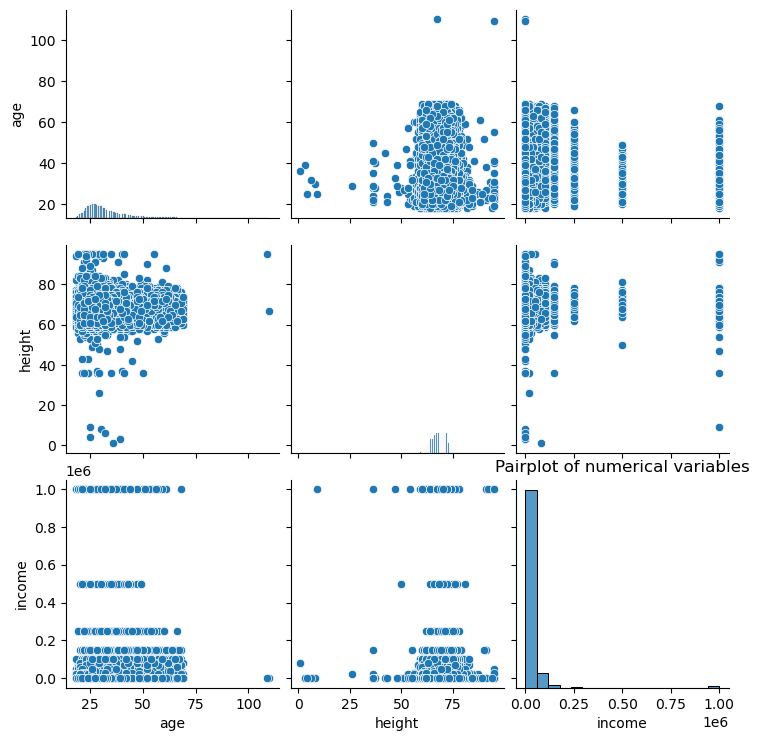

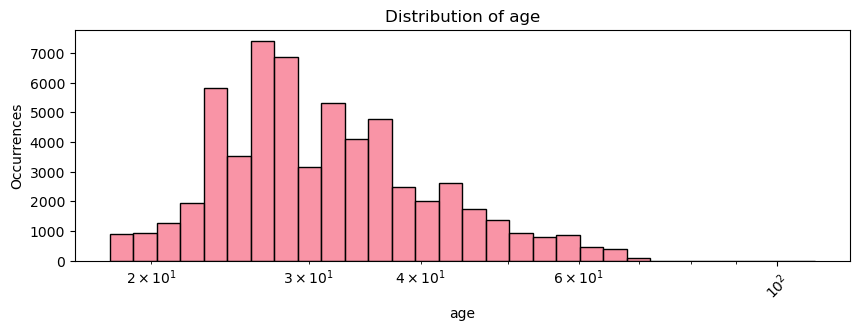

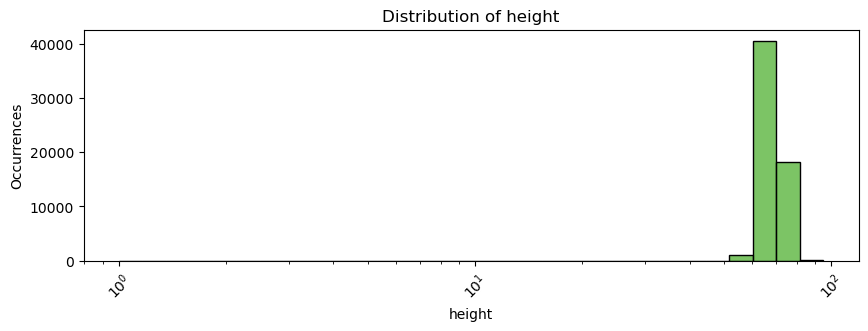

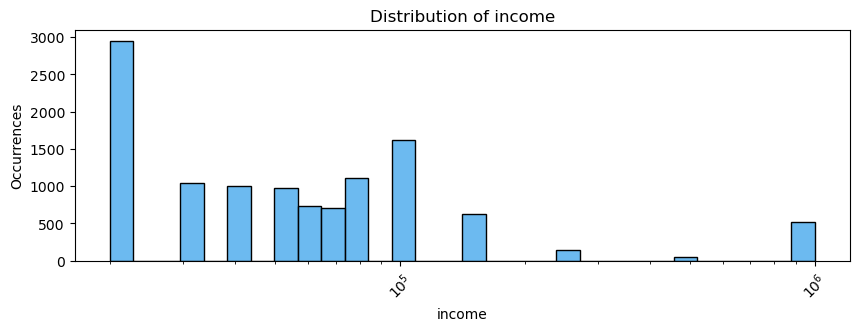

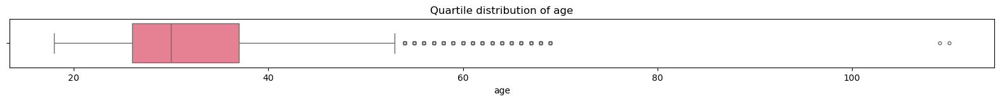

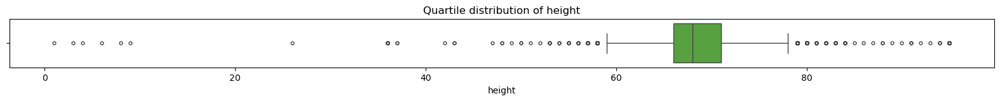

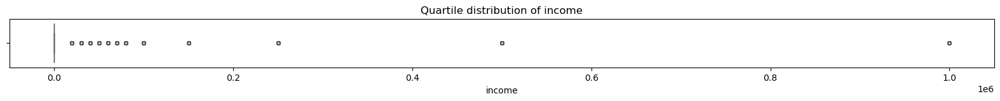

In [5]:
## Visualisation of numerical variables
# subsetting numerical variables only
num_variables = profiles[['age','height','income']]
# pairplots allows for a quick look at several variables in one go but do not allow for granularity
sns.pairplot(num_variables)
plt.title('Pairplot of numerical variables')
plt.show()

# histograms of individual variable for better granularity and log transformation to better visualise outliers
def hist_num_variable(df):
    colors = sns.color_palette("husl", len(df.columns))      
    for i, column in enumerate(df.columns):
        n_categories = df[column].nunique()  
        plt.figure(figsize=(10, 3))
        sns.histplot(data=df, x=column, bins=30, log_scale=10, color=colors[i])  
        plt.title(f"Distribution of {column}")
        plt.xlabel(column)
        plt.ylabel("Occurrences")
        plt.xticks(rotation=45)  
        plt.show()
        
hist_num_variable(num_variables)

# boxplot to better visualise outliers
def box_num_variable(df):
    colors = sns.color_palette("husl", len(df.columns))      
    for i, column in enumerate(df.columns):
        n_categories = df[column].nunique() 
        plt.figure(figsize=(20, 1))
        sns.boxplot(data=df[column], orient='h', fliersize=3.5, legend='auto',color=colors[i])
        plt.title(f"Quartile distribution of {column}")
        plt.show()
        
        
box_num_variable(num_variables)

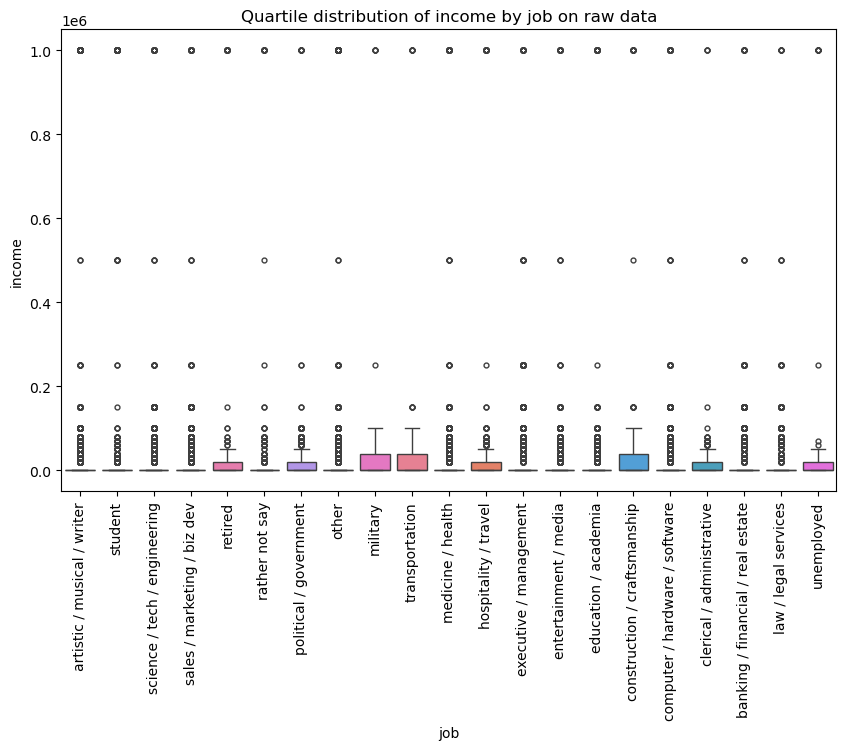

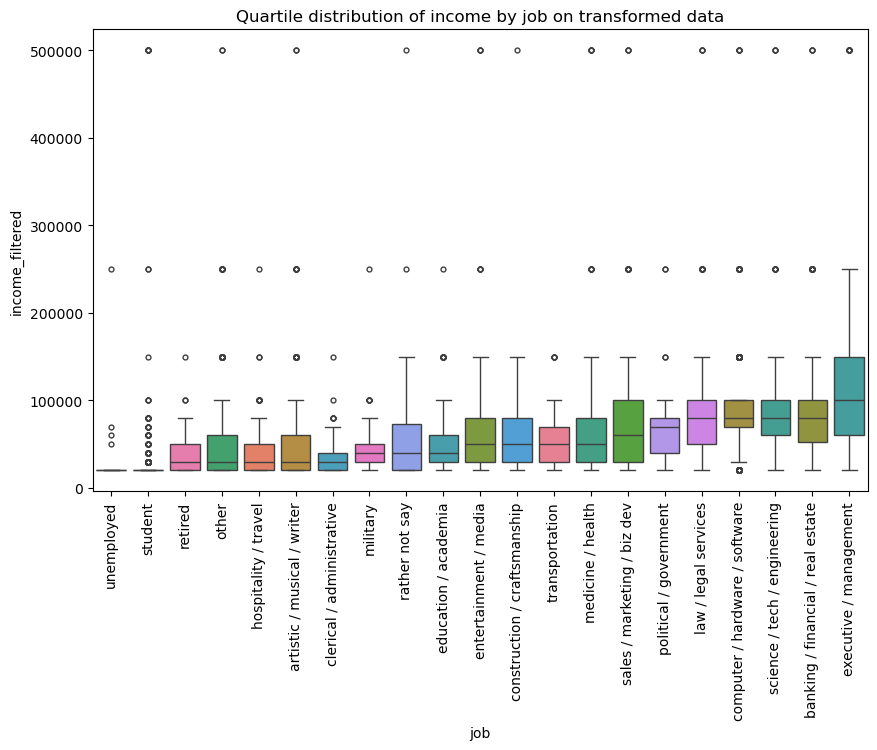

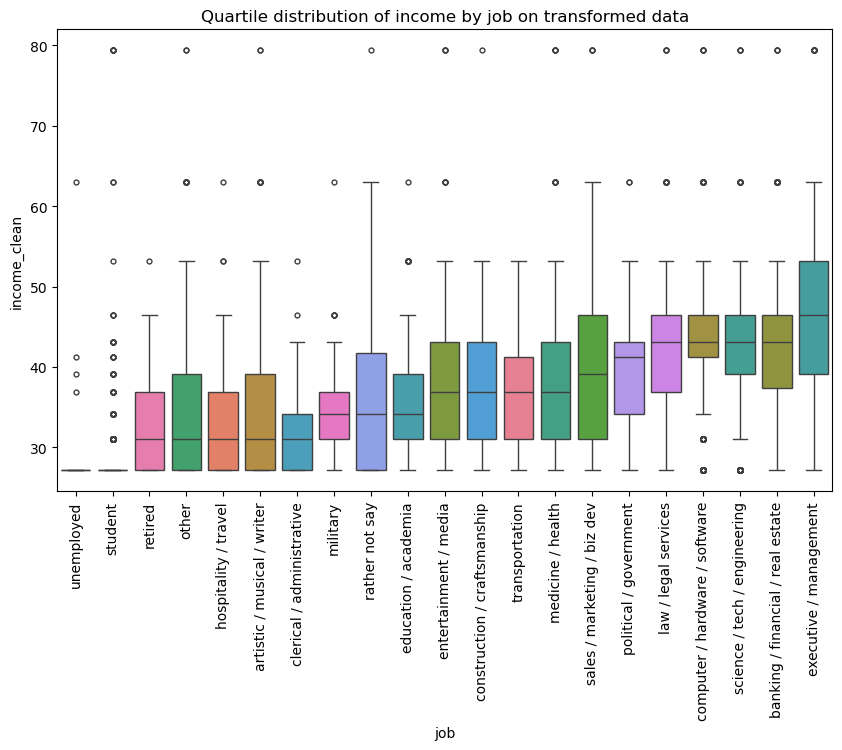

In [5]:
# plot job vs income on raw data
# Compute median income_clean per job and sort
income_by_job_medians = profiles.groupby("job")["income"].median().sort_values()
# Define job order based on sorted medians
sorted_income_by_job_medians = income_by_job_medians.index.tolist()
# Plot boxplot with sorted x-axis
plt.figure(figsize=(10, 6))
sns.boxplot(
    data=profiles,
    x="job",
    y="income",
    hue="job",
    order=sorted_income_by_job_medians, 
    orient="v",
    fliersize=3.5
)
plt.xticks(rotation=90)
plt.title("Quartile distribution of income by job on raw data")
plt.legend([],[], frameon=False)  # Remove redundant hue legend
plt.show()


## filtering outliers and checking distribution
profiles['age_filtered'] = profiles['age'].apply(lambda x: np.nan if x > 71 else x) # filtering above 71
profiles['height_filtered'] = profiles['height'].apply(lambda x: np.nan if x < 20 else x)  # filtering below 20
profiles['income_filtered'] = profiles['income'].apply(lambda x: np.nan if x in [-1, 1000000] else x) # filtering out -1 and 1000000

# plot job vs income on filtered data
# Compute median income_clean per job and sort
income_filtered_by_job_medians = profiles.groupby("job")["income_filtered"].median().sort_values()
# Define job order based on sorted medians
sorted_income_filtered_by_job_medians = income_filtered_by_job_medians.index.tolist()
# Plot boxplot with sorted x-axis
plt.figure(figsize=(10, 6))
sns.boxplot(
    data=profiles,
    x="job",
    y="income_filtered",
    hue="job",
    order=sorted_income_filtered_by_job_medians,  
    orient="v",
    fliersize=3.5
)
plt.xticks(rotation=90)
plt.title("Quartile distribution of income by job on transformed data")
plt.legend([],[], frameon=False)  # Remove redundant hue legend
plt.show()

## data cleaning (filtering and transformation)
profiles['age_clean'] = profiles['age'].apply(lambda x: np.nan if x > 71 else np.log(x) if x > 0 else np.nan) # filtering above 71 and log-transformation for right skew
profiles['height_clean'] = profiles['height'].apply(lambda x: np.nan if x < 20 else x)  # filtering below 20
profiles['income_clean'] = profiles['income'].apply(lambda x: np.nan if x in [-1, 1000000] else np.cbrt(x) if x >= 0 else -np.cbrt(abs(x))) # filtering out -1 and 1000000, and cube-root-transformation for srong right skew

# Compute median income_clean per job and sort
income_clean_by_job_medians = profiles.groupby("job")["income_clean"].median().sort_values()
# Define job order based on sorted medians
sorted_income_clean_by_job_medians = income_clean_by_job_medians.index.tolist()
# Plot boxplot with sorted x-axis
plt.figure(figsize=(10, 6))
sns.boxplot(
    data=profiles,
    x="job",
    y="income_clean",
    hue="job",
    order=sorted_income_clean_by_job_medians,  
    orient="v",
    fliersize=3.5
)
plt.xticks(rotation=90)
plt.title("Quartile distribution of income by job on transformed data")
plt.legend([],[], frameon=False)  # Remove redundant hue legend
plt.show()


#### Assessing data for cleaning:
- __age:__ data points plateau at 70 with 2 outliers at 110, these can be eliminated by filtering out age>80. Distribution is right-skewed so it must be log-transformed prior to stats.
- __height:__ most data points are > 20 inches, the 6 outliers below 20 can be filtered out. Distribution is not skewed so it doesn't need to be transformed prior to stats.
- __income:__ most datapoints are below 20,000 and are equal -1 (which is not a valid income), filter them out. The value 1000000 whilst valid as an income doesn't make sense for most of the jobs (e.g. students, unemployed), filter it out too. Distribution is very right-skewed so it must be cube-root-transformed prior to stats. Income varies by job; use the income median to encode job later on.

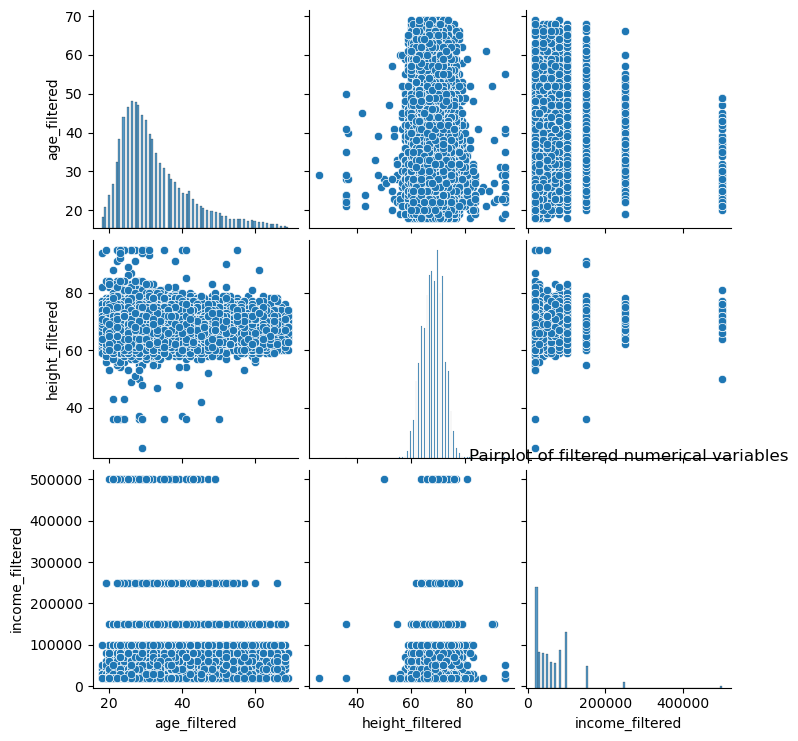

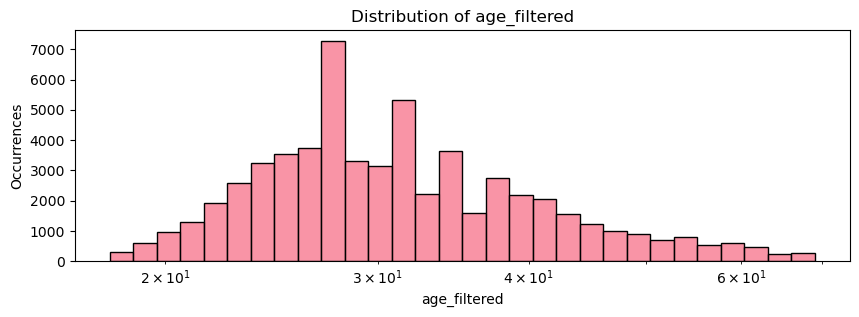

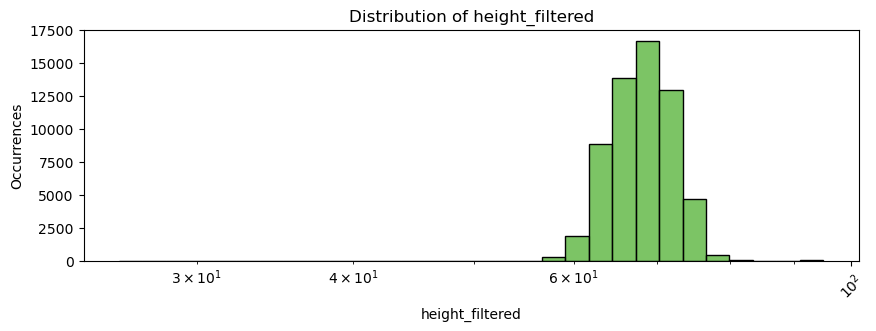

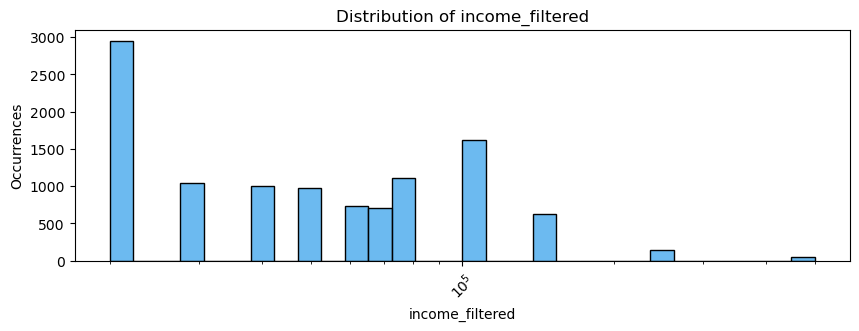

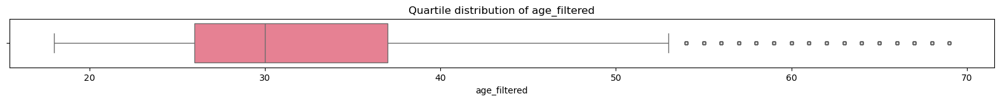

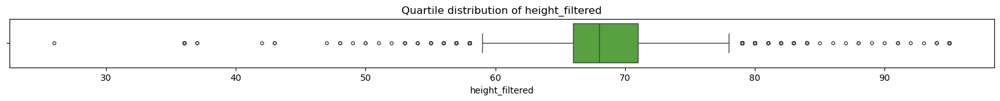

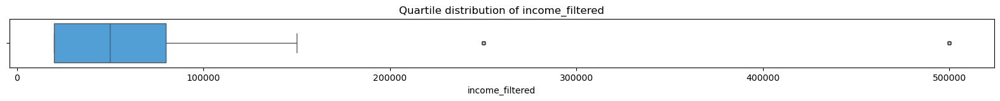

In [13]:
## Visualisation of filered numerical variables
# subsetting numerical variables only
filtered_num_variables = profiles[['age_filtered','height_filtered','income_filtered']]
# pairplots allows for a quick look at several variables in one go but do not allow for granularity
sns.pairplot(filtered_num_variables)
plt.title('Pairplot of filtered numerical variables')
plt.show()

# histograms of individual variable for better granularity and log transformation to better visualise outliers
def hist_num_variable(df):
    colors = sns.color_palette("husl", len(df.columns))      
    for i, column in enumerate(df.columns):
        n_categories = df[column].nunique()  
        plt.figure(figsize=(10, 3))
        sns.histplot(data=df, x=column, bins=30, log_scale=10, color=colors[i])  
        plt.title(f"Distribution of {column}")
        plt.xlabel(column)
        plt.ylabel("Occurrences")
        plt.xticks(rotation=45)  
        plt.show()

hist_num_variable(filtered_num_variables)

# boxplot to better visualise outliers
def box_num_variable(df):
    colors = sns.color_palette("husl", len(df.columns))      
    for i, column in enumerate(df.columns):
        n_categories = df[column].nunique() 
        plt.figure(figsize=(20, 1))
        sns.boxplot(data=df[column], orient='h', fliersize=3.5, legend='auto',color=colors[i])
        plt.title(f"Quartile distribution of {column}")
        plt.show()
        
box_num_variable(filtered_num_variables)

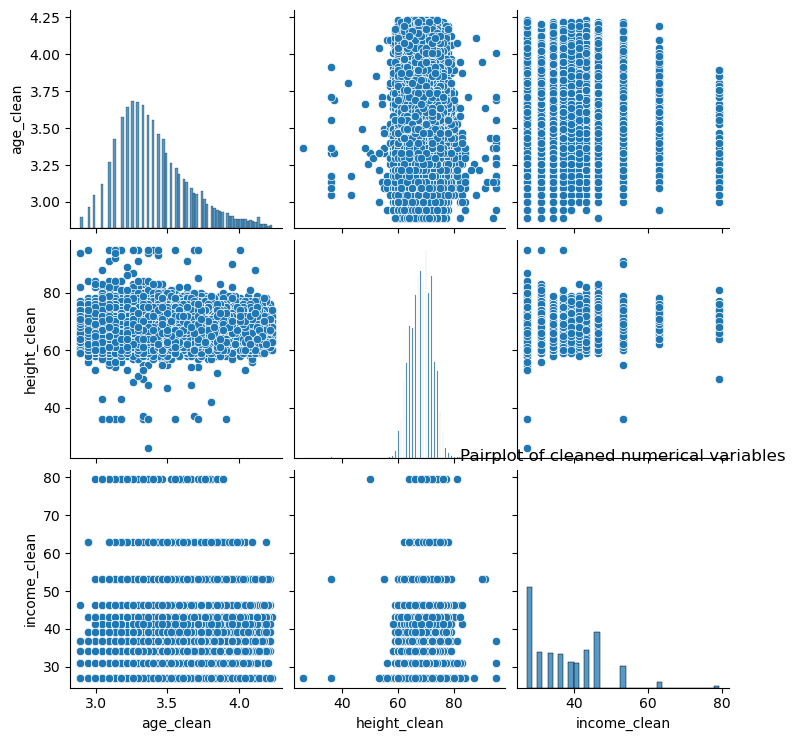

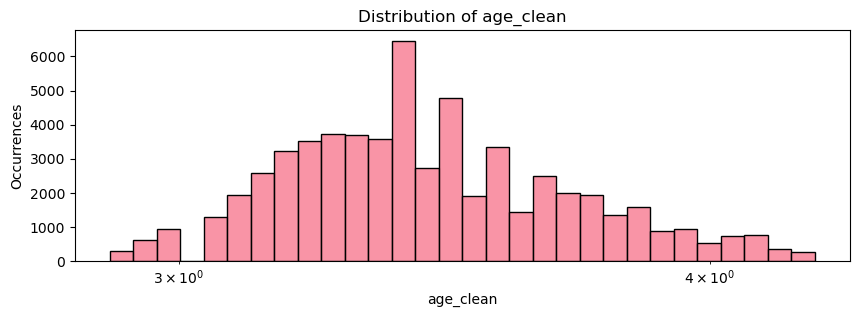

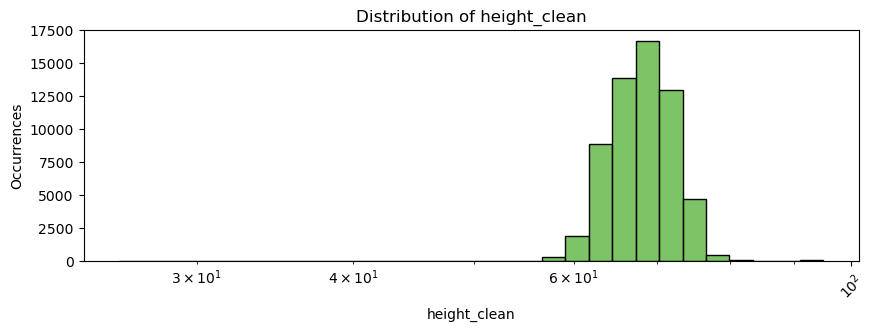

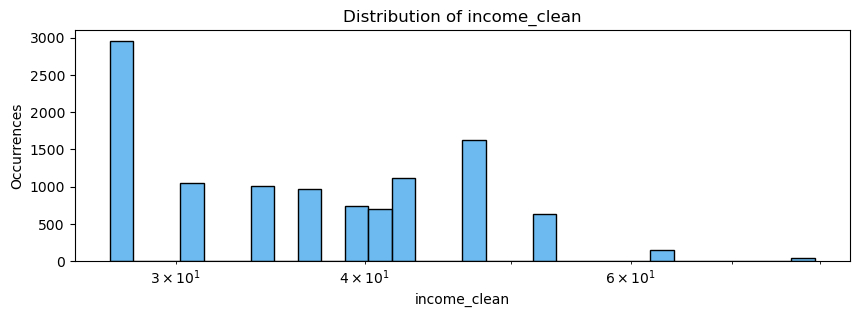

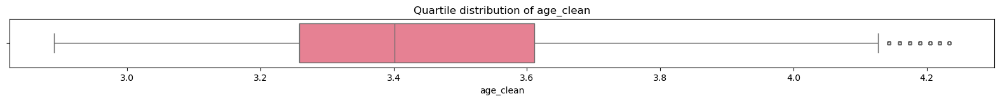

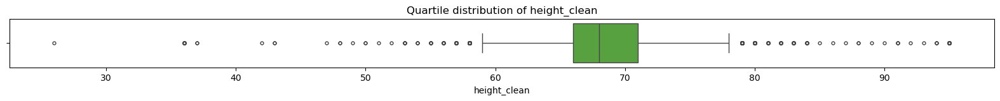

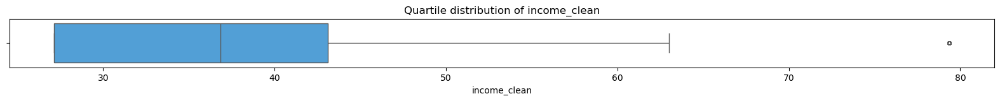

In [14]:
## Visualisation of cleaned numerical variables
# subsetting numerical variables only
clean_num_variables = profiles[['age_clean','height_clean','income_clean']]
# pairplots allows for a quick look at several variables in one go but do not allow for granularity
sns.pairplot(clean_num_variables)
plt.title('Pairplot of cleaned numerical variables')
plt.show()

# histograms of individual variable for better granularity and log transformation to better visualise outliers
def hist_num_variable(df):
    colors = sns.color_palette("husl", len(df.columns))      
    for i, column in enumerate(df.columns):
        n_categories = df[column].nunique()  
        plt.figure(figsize=(10, 3))
        sns.histplot(data=df, x=column, bins=30, log_scale=10, color=colors[i])  
        plt.title(f"Distribution of {column}")
        plt.xlabel(column)
        plt.ylabel("Occurrences")
        plt.xticks(rotation=45)  
        plt.show()

hist_num_variable(clean_num_variables)

# boxplot to better visualise outliers
def box_num_variable(df):
    colors = sns.color_palette("husl", len(df.columns))      
    for i, column in enumerate(df.columns):
        n_categories = df[column].nunique() 
        plt.figure(figsize=(20, 1))
        sns.boxplot(data=df[column], orient='h', fliersize=3.5, legend='auto',color=colors[i])
        plt.title(f"Quartile distribution of {column}")
        plt.show()
        
box_num_variable(clean_num_variables)

### Categorical variables (other than "essay")
- plot data
- wrangle/clean data
- plot clean data

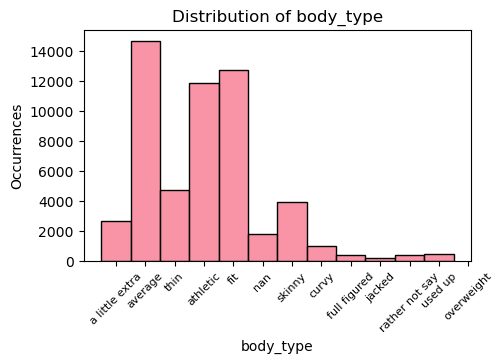

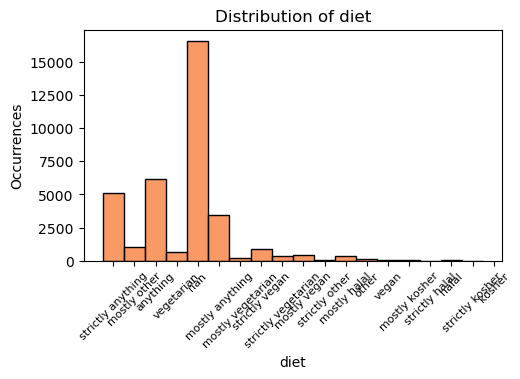

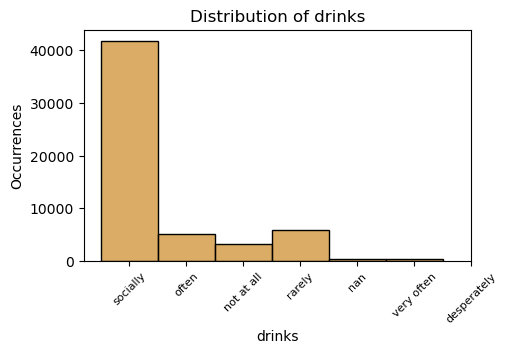

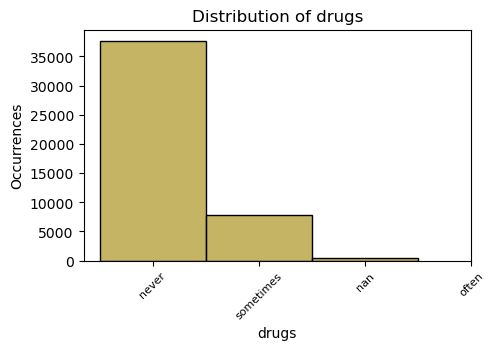

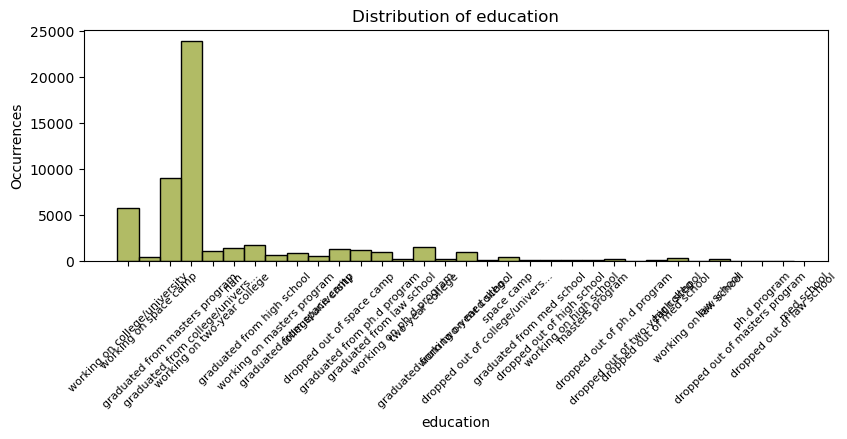

...

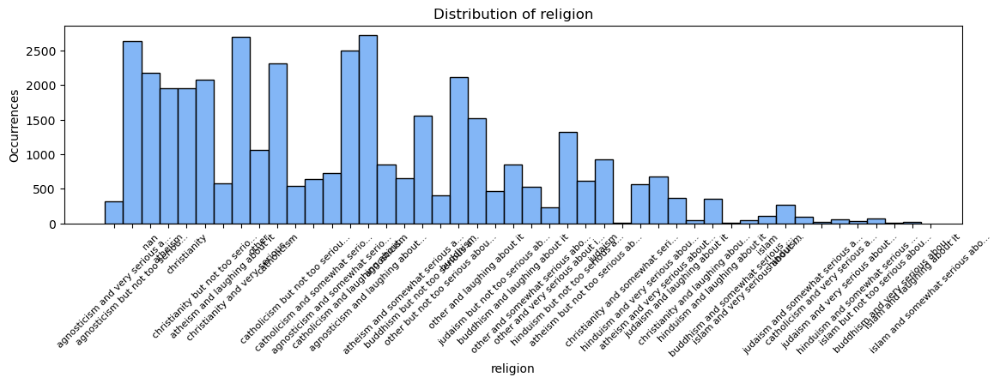

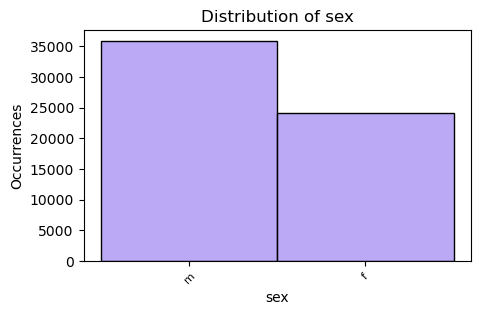

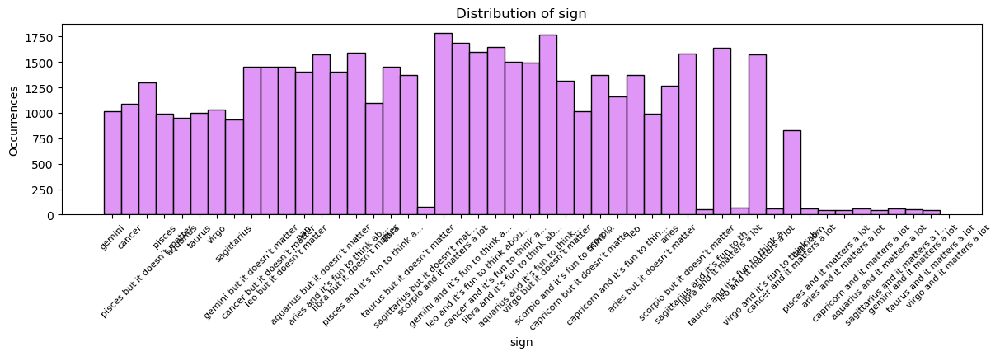

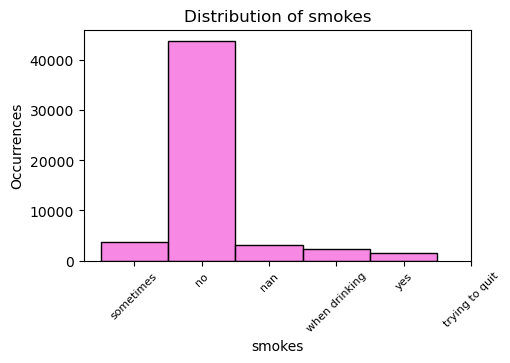

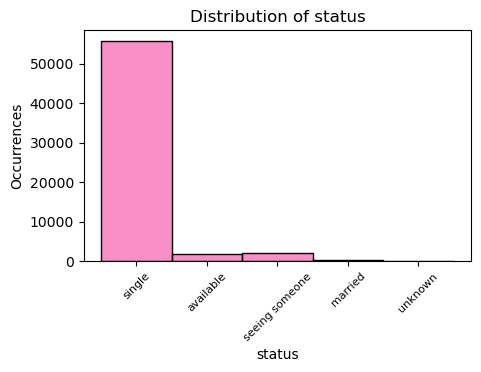

In [8]:
## Visualisation of categorical variables
# Subsetting categorical variables with < 50 categories only
cat_variables = pd.DataFrame()  
def subset_cat_variables(df):
    global cat_variables  
    cat_columns = [column for column in df.columns if df[column].dtype == 'object' and df[column].nunique() < 300]
    cat_variables = df[cat_columns]  
    return cat_variables  
cat_variables = subset_cat_variables(profiles)  
# display("Dimensions of cat_variables:", cat_variables.shape) # (59946, 14)
# display(cat_variables.head())

# Histograms of individual variables with dynamic figure size based on unique categories
def hist_cat_variable(df, xtick_fontsize=10, xtick_label_limit=30):
    colors = sns.color_palette("husl", len(df.columns))      
    for i, column in enumerate(df.columns):
        n_categories = df[column].nunique()  
        fig_width = max(5, min(n_categories * 0.3, 15))
        plt.figure(figsize=(fig_width, 3))
        sns.histplot(data=df, x=column, discrete=True, color=colors[i])  
        plt.title(f"Distribution of {column}")
        plt.xlabel(column)
        plt.ylabel("Occurrences")
        # Truncate x-tick labels if they are too long
        x_labels = [str(label)[:xtick_label_limit] + "..." if len(str(label)) > xtick_label_limit else str(label) for label in df[column].unique()]
        plt.xticks(range(len(x_labels)), x_labels, rotation=45, fontsize=xtick_fontsize)  
        plt.show()

hist_cat_variable(cat_variables, xtick_fontsize=8, xtick_label_limit=30)

,ethnicity_type,ethnicity_count,ethnicity_percentage
0,white,32831,60.5
1,asian,6134,11.3
2,hispanic / latin,2823,5.2
3,black,2008,3.7
4,other,1706,3.1
5,"hispanic / latin, white",1301,2.4
6,indian,1077,2.0
7,"asian, white",811,1.5
8,"white, other",641,1.2
9,pacific islander,432,0.8


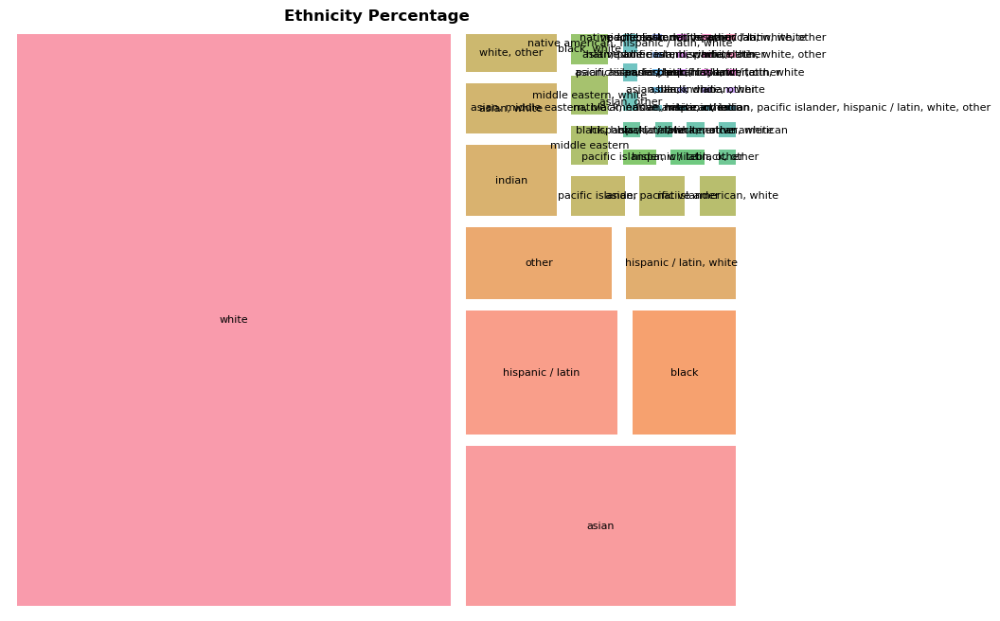

In [6]:
# Ethnicity has many labels,a treemap would be a good visualisation tool
# Compute counts and percentage and write as dfs
ethnicity_count = profiles['ethnicity'].value_counts().sort_values(ascending=False).reset_index()
ethnicity_count.columns = ['ethnicity_type', 'ethnicity_count']
ethnicity_percentage = profiles['ethnicity'].value_counts(normalize=True).mul(100).round(1).reset_index()
ethnicity_percentage.columns = ['ethnicity_type', 'ethnicity_percentage']
ethnicity_count_percentage = pd.merge(ethnicity_count, ethnicity_percentage, on='ethnicity_type')
display(ethnicity_count_percentage.head(20))

# Filter out null percentage
ethnicity_count_percentage = ethnicity_count_percentage[ethnicity_count_percentage['ethnicity_percentage'] > 0]

# Create treemap
# Define colors (make sure it matches the number of categories)
colors = sns.color_palette("husl", len(ethnicity_count_percentage))

# Create the treemap plot with the custom color palette
plt.figure(figsize=(10, 8))
squarify.plot(
    sizes=ethnicity_count_percentage['ethnicity_percentage'], 
    label=ethnicity_count_percentage['ethnicity_type'], 
    color=colors, 
    alpha=0.7,
    pad=True,
    text_kwargs={'fontsize': 8}  # Ensure fontsize is passed correctly
)

plt.axis('off')  # Remove axes
plt.title('Ethnicity Percentage', fontweight='bold', fontsize=12)  # Correct fontsize to an appropriate value
plt.show()


,location_town,location_state,location_country
0,south san francisco,california,US
1,oakland,california,US
2,san francisco,california,US
3,berkeley,california,US
4,san francisco,california,US


,location_town_type,location_town_count,location_town_percentage
0,san francisco,31064,51.8
1,oakland,7214,12.0
2,berkeley,4212,7.0
3,san mateo,1331,2.2
4,palo alto,1064,1.8
...,...,...,...
193,chico,1,0.0
194,south lake tahoe,1,0.0
195,vacaville,1,0.0
196,miami,1,0.0


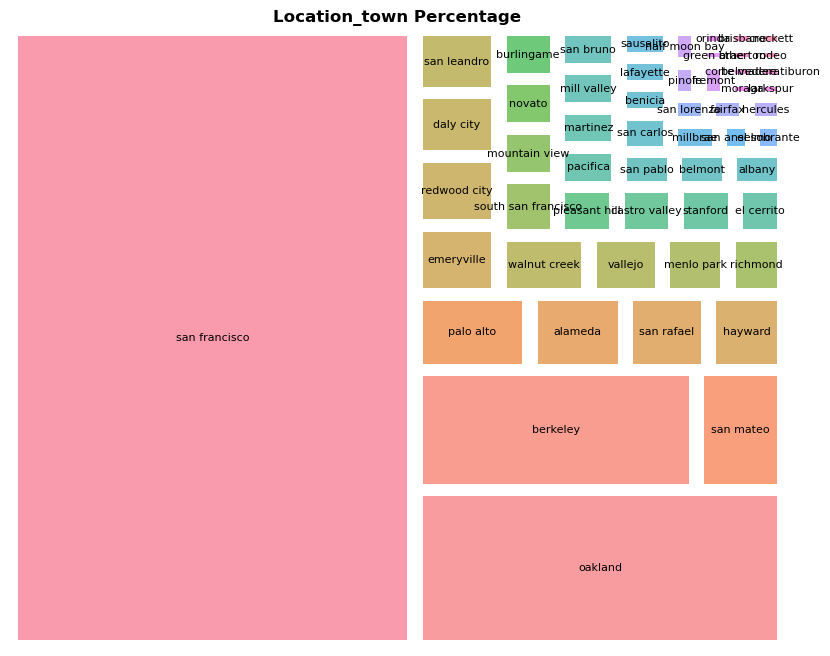

In [7]:
# Location has many labels,a treemap would be a good visualisation tool
# Create new  location_town, location_state, and location_country columns
# Ensure missing values are handled
profiles['location'] = profiles['location'].fillna('')

# Split into three parts: town, state, and country (ensuring we don't create more than 3 columns)
split_location = profiles['location'].str.split(',', n=2, expand=True)

# Assign each part to the correct column and strip whitespace
profiles['location_town'] = split_location[0].str.strip()
profiles['location_state'] = split_location[1].str.strip().fillna('')
profiles['location_country'] = split_location[2].str.strip().fillna('')

# If location_country is empty but location_state, indicate US
profiles.loc[(profiles['location_country'] == '') & (profiles['location_state'] != ''), 'location_country'] = 'US'

# Display the results
display(profiles[['location_town', 'location_state', 'location_country']].head())

# Compute counts and percentage of town and write as dfs
location_town_count = profiles['location_town'].value_counts().sort_values(ascending=False).reset_index()
location_town_count.columns = ['location_town_type', 'location_town_count']
location_town_percentage = profiles['location_town'].value_counts(normalize=True).mul(100).round(1).reset_index()
location_town_percentage.columns = ['location_town_type', 'location_town_percentage']
location_town_count_percentage = pd.merge(location_town_count, location_town_percentage, on='location_town_type')
display(location_town_count_percentage)

# Filter out null percentage
location_town_count_percentage = location_town_count_percentage[location_town_count_percentage['location_town_percentage'] > 0]

# Create treemap
# Define colors (make sure it matches the number of categories)
colors = sns.color_palette("husl", len(location_town_count_percentage))

# Create the treemap plot with the custom color palette
plt.figure(figsize=(10, 8))
squarify.plot(
    sizes=location_town_count_percentage['location_town_percentage'], 
    label=location_town_count_percentage['location_town_type'], 
    color=colors, 
    alpha=0.7,
    pad=True,
    text_kwargs={'fontsize': 8}  # Ensure fontsize is passed correctly
)

plt.axis('off')  # Remove axes
plt.title('Location_town Percentage', fontweight='bold', fontsize=12)  # Correct fontsize to an appropriate value
plt.show()

#### Assessing data for cleaning and encoding:
- __body_type:__ ignore "NAN" and scale the categories from 1-11
- __diet:__ group by main categories and add level of strictness
- __drinks:__ ignore "NAN" and scale the categories from 1-6
- __drugs:__ ignore "NAN" and scale the categories from 1-3
- __education:__ subset to highest level reached and whether graduated/dropout
- __ethnicity:__ lots of categories but only a few that are prominent, agglomerate the minor categories as others
- __job:__ compute the median income by job, and use it as a level
- __location:__ lots of categories but only a few that are prominent, agglomerating by state shows that 99% is in CA and mostly in the San Francisco area. Use location_town in ML model
- __offspring:__ ignore "NAN" and subdivide as has_kids:0/1, wants_kids:0/1, likes_kids:0/1
- __orientation:__ scale from 1-3
- __pets:__ subdivide as has_dogs: 0/1, has_cats:0/1, likes_dogs:0/1, likes_cat:0/1
- __religion:__ ignore "NAN" and aggregate faith types and add a faith_rank scaling doesn't matter to matters from 1-5 
- __sex:__ convert to binary 0/1
- __sign:__ I think that the actual signs themselves matter little; what's more relevant is how seriously they are considered ("doesn't matter' or "fun to think about" or "matters a lot"). scale those statements from 1-3
- __smokes:__ ignore "NAN" and scale the categories from 0-4
- __speaks:__ count how many languages are listed and consign this number to speaks_multiligual
- __status:__ exclude unknown and create ordinal variable


In [8]:
## cleaning data of each categorical variables (other than essays)

######################################################################################
# body_type: create ordinal variable
# list current categories
#display(profiles['body_type'].unique())
# define label mapping dictionary
body_type_mapping = {
    'rather not say': np.nan,
    'jacked': -5,
    'athletic': -4,
    'fit': -3,
    'skinny': -2,
    'thin': -1,
    'average': 0,
    'a little extra': 1,
    'curvy': 2, 
    'full figured': 3,
    'overweight': 4,
    'used up': 5 
}
# apply mappings to recode categorical variables
profiles['body_type_level'] = profiles['body_type'].replace(body_type_mapping).astype("Int64")
#display(profiles[['body_type','body_type_level']].head())

######################################################################################
# diet: create ordinal variable
# list current categories
#display(profiles['diet'].unique())
# Define label mapping dictionaries
diet_type_mapping = {
    "anything": 1,
    "other": 2,
    "vegetarian": 3,
    "vegan": 4,
    "halal": 5,
    "kosher": 6
}
diet_level_mapping = {
    "strictly": 3,
    "mostly": 2
}
# Extract diet type 
profiles['diet_code'] = profiles['diet'].str.extract(
    r'(?:strictly |mostly )?(anything|other|vegetarian|vegan|halal|kosher)', expand=False
).map(diet_type_mapping).astype("Int64")
# Extract diet level (first word: "strictly" or "mostly")
profiles['diet_level'] = profiles['diet'].str.extract(
    r'^(strictly|mostly)', expand=False
).map(diet_level_mapping).astype("Int64")
# Assign default value of 1 *only* when `diet_type` exists but `diet_level` is missing
profiles.loc[profiles['diet_code'].notna() & profiles['diet_level'].isna(), 'diet_level'] = 1
# Display results
#display(profiles[['diet', 'diet_code', 'diet_level']].head(10))

######################################################################################
# drinks: create ordinal variable
# list current categories
#display(profiles['drinks'].unique())
# define label mapping dictionary 
drinks_level_mapping = {
    'not at all': 0,
    'rarely': 1, 
    'socially': 2, 
    'often': 3,  
    'very often': 4,
    'desperately': 5
}
# apply mappings to recode categorical variables
profiles['drinks_level'] = profiles['drinks'].replace(drinks_level_mapping).astype("Int64")
#display(profiles[['drinks','drinks_level']].head())

######################################################################################
# drugs: create ordinal variable
# list current categories
#display(profiles['drugs'].unique())
# define label mapping dictionary 
drugs_level_mapping = {
    'never': 0,
    'sometimes': 1, 
    'often': 2
}
# apply mappings to recode categorical variables
profiles['drugs_level'] = profiles['drugs'].replace(drugs_level_mapping).astype("Int64")
#display(profiles[['drugs','drugs_level']].head())

######################################################################################
# education: create ordinal variable
# list current categories
#display(profiles['education'].unique())
# Define label mapping dictionary
education_level_mapping = {
    "dropped out of": 0,
    "working on": 1,
    "graduated from": 2    
}
# Extract diet level (first word: "strictly" or "mostly")
profiles['education_level'] = profiles['education'].str.extract(r'^(dropped out of|working on|graduated from)', expand=False).map(education_level_mapping).astype("Int64")
# Assign default value of 1 *only* for non-missing diet values
profiles.loc[profiles['education'].notna() & profiles['education_level'].isna(), 'education_level'] = 1
# Extract diet type (everything after "strictly"/"mostly")
profiles['education_type'] = profiles['education'].str.replace(r'^(dropped out of|working on|graduated from) ', '', regex=True)
# Ensure original NaNs remain in diet_type
profiles['education_type'] = profiles['education_type'].where(profiles['education'].notna(), np.nan)
# create a LabelEncoder object 
le = LabelEncoder() 
# fit the encoder on the job column 
le.fit(profiles['education_type']) 
# encode the job column using the fitted encoder 
#profiles['education_code'] = le.transform(profiles['education_type']).astype("Int64")
profiles['education_code'] = pd.Series(le.transform(profiles['education_type']), index=profiles.index, dtype="Int64")
# Display results
#display(profiles[['education', 'education_type', 'education_level', 'education_code']].head())

######################################################################################
# ethnicity: agglomerate in less categories: keep cat_percent>1% as they are and rename the rest as diverse
# list prominent categories using ethnicity_count_percentage create in cell above
#display(ethnicity_count_percentage[ethnicity_count_percentage['ethnicity_percentage'] > 1])
# Ensure the ethnicity counts are computed as percentages
all_ethnicities = profiles['ethnicity'].dropna()
ethnicity_counts = all_ethnicities.value_counts(normalize=True).mul(100)  # Convert to percentages
# Function to replace rare labels with 'diverse'
def clean_ethnicity(x):
    if pd.isna(x):
        return x  # Preserve NaN values    
    # Check if the full label appears in less than 1% of the dataset
    return 'diverse' if ethnicity_counts.get(x, 0) < 1 else x
# Apply the function
profiles['ethnicity_clean'] = profiles['ethnicity'].apply(clean_ethnicity)
# create a LabelEncoder object 
le = LabelEncoder() 
# fit the encoder on the job column 
le.fit(profiles['ethnicity_clean']) 
# encode the job column using the fitted encoder 
#profiles['ethnicity_code'] = le.transform(profiles['ethnicity_clean']).astype("Int64") 
profiles['ethnicity_code'] = pd.Series(le.transform(profiles['ethnicity_clean']), index=profiles.index, dtype="Int64")
# # Display results
# display(profiles[['ethnicity', 'ethnicity_clean']])
# display(profiles[profiles['ethnicity_clean'].str.contains('diverse', na=False)])
# display(profiles[profiles['ethnicity_clean'].str.contains(r'\bdiverse\b|\bwhite\b', na=False, regex=True)])
# # Compute counts and percentage and write as dfs
# ethnicity_clean_count = profiles['ethnicity_clean'].value_counts().sort_values(ascending=False).reset_index()
# ethnicity_clean_count.columns = ['ethnicity_clean_type', 'ethnicity_clean_count']
# ethnicity_clean_percentage = profiles['ethnicity_clean'].value_counts(normalize=True).mul(100).round(1).reset_index()
# ethnicity_clean_percentage.columns = ['ethnicity_clean_type', 'ethnicity_clean_percentage']
# ethnicity_clean_count_percentage = pd.merge(ethnicity_clean_count, ethnicity_clean_percentage, on='ethnicity_clean_type')
# display(ethnicity_clean_count_percentage)
# # Create treemap
# # Define colors (make sure it matches the number of categories)
# colors = sns.color_palette("husl", len(ethnicity_clean_count_percentage))
# # Create the treemap plot with the custom color palette
# plt.figure(figsize=(10, 8))
# squarify.plot(
#     sizes=ethnicity_clean_count_percentage['ethnicity_clean_percentage'], 
#     label=ethnicity_clean_count_percentage['ethnicity_clean_type'], 
#     color=colors, 
#     alpha=0.7,
#     pad=True,
#     text_kwargs={'fontsize': 8}  # Ensure fontsize is passed correctly
# )
# plt.axis('off')  # Remove axes
# plt.title('Ethnicity_clean Percentage', fontweight='bold', fontsize=12)  # Correct fontsize to an appropriate value
# plt.show()

######################################################################################
# job: use income median by job sorted by increasing median and assign levels
# Compute median income_clean per job and sort
income_clean_by_job_medians = profiles.groupby("job")["income_clean"].median().sort_values()
# Create a mapping from job labels to ordered integers (based on median income)
job_encoding = {job: code for code, job in enumerate(income_clean_by_job_medians.index)}
# Assign encoded values to a new column 'job_code'
profiles['job_code'] = profiles['job'].map(job_encoding).astype("Int64")
#diplay(profiles[['job', 'job_code']].head())

######################################################################################
# location: assign a random number
# create a LabelEncoder object 
le = LabelEncoder() 
# fit the encoder on the job column 
le.fit(profiles['location_town']) 
# encode the job column using the fitted encoder 
#profiles['location_town_code'] = le.transform(profiles['location_town']).astype("Int64") 
profiles['location_town_code'] = pd.Series(le.transform(profiles['location_town']), index=profiles.index, dtype="Int64")
#display(profiles[['location_town','location_town_code']].head())

######################################################################################
# offspring: create ordinal variable
# list current categories
#display(profiles['offspring'].unique())
# Offspring: Create ordinal variables
# Define label mapping dictionary
has_offspring = {
    'no': 0,
    'doesn’t have kids': 0,
    'has a kid': 1,
    'has kids': 2
}
wants_offspring = {
    'doesn’t want': 0,
    'might want': 1,
    'wants more': 2
}
# Extract the relevant part for 'offspring_has'
profiles['offspring_has'] = profiles['offspring'].str.extract(r'^(no|doesn’t have kids|has a kid|has kids)', expand=False).map(has_offspring).astype("Int64")
# Extract the relevant part for 'offspring_wants'
profiles['offspring_wants'] = profiles['offspring'].str.extract(r'(doesn’t want|might want|wants more)', expand=False).map(wants_offspring).astype("Int64")
# Display results
#display(profiles[['offspring', 'offspring_has', 'offspring_wants']].head())

######################################################################################
# orientation: create ordinal variable
# list current categories
#display(profiles['orientation'].unique())
# Define label mapping dictionary
orientation_level_mapping = {
    'straight': 0,
    'gay': 1,
    'bisexual': 2
}
# apply mappings to recode categorical variables
profiles['orientation_code'] = profiles['orientation'].str.extract(r'(straight|gay|bisexual)', expand=False).map(orientation_level_mapping).astype("Int64")
# display result
#display(profiles[['orientation', 'orientation_code']])

######################################################################################
# pets: create ordinal variable
# list current categories
#display(profiles['pets'].unique())
# Offspring: Create ordinal variables
# Define label mapping dictionaries
dog_mapping = {
    'dislikes dogs': 0,
    'likes dogs': 1,
    'has dogs': 2
}
cat_mapping = {
    'dislikes cats': 0,
    'likes cats': 1,
    'has cats': 2
}
# Extract the relevant part for 'pets_dog'
profiles['pets_dog'] = profiles['pets'].str.extract(r'^(dislikes dogs|likes dogs|has dogs)', expand=False).map(dog_mapping).astype("Int64")
# Extract the relevant part for 'pets_cat'
profiles['pets_cat'] = profiles['pets'].str.extract(r'(dislikes cats|likes cats|has cats)', expand=False).map(cat_mapping).astype("Int64")
# Display results
#display(profiles[['pets', 'pets_dog', 'pets_cat']].head())

######################################################################################
# religion: create ordinal variables
# list current categories
#display(profiles['religion'].unique())
# Define label mapping dictionaries
religion_type_mapping = {
    'agnosticism': 0,
    'atheism': 1,
    'buddhism': 2,
    'catholicism': 3,
    'christianity': 4,
    'hinduism': 5,
    'islam': 6,
    'judaism': 7,
    'other': 8
}
religion_level_mapping = {
    'laughing': 1,
    'not too serious': 2,
    'somewhat serious': 3,
    'very serious': 4
}
# Extract the relevant part for 'religion_code'
profiles['religion_code'] = profiles['religion'].str.extract(r'^(agnosticism|atheism|buddhism|catholicism|christianity|hinduism|islam|judaism|other)', expand=False).map(religion_type_mapping).astype("Int64")
# Extract the relevant part for 'religion_level'
profiles['religion_level'] = profiles['religion'].str.extract(r'(laughing|not too serious|somewhat serious|very serious)', expand=False).map(religion_level_mapping).astype("Int64")
# Set 0 **only** if a religion exists, otherwise keep NaN
profiles.loc[profiles['religion'].notna() & profiles['religion_level'].isna(), 'religion_level'] = 0
# Display results
#display(profiles[['religion', 'religion_code', 'religion_level']].head(20))

######################################################################################
# sex: create binary variables
# list current categories
#display(profiles['sex'].unique())
# Define label mapping dictionaries
sex_mapping = {
    'm': 0,
    'f': 1
}
# Extract the relevant part for 'sex_code'
profiles['sex_code'] = profiles['sex'].str.extract(r'^(m|f)', expand=False).map(sex_mapping).astype("Int64")
# Display results
#display(profiles[['sex', 'sex_code']].head(20))

######################################################################################
# sign: create binary variables
# list current categories
#display(profiles['sign'].unique())
# Define label mapping dictionaries
sign_type_mapping = {
    'aquarius': 1,
    'aries': 2,
    'cancer': 3,
    'capricorn': 4,
    'gemini': 5,
    'leo': 6,
    'libra': 7,
    'pisces': 8,
    'sagittarius': 9,
    'scorpio': 10,
    'taurus': 11,
    'virgo': 12
}
sign_level_mapping = {
    'doesn’t matter': 1,
    'fun': 2,
    'matters a lot': 3
}
# Extract the relevant part for 'sign_code'
profiles['sign_code'] = profiles['sign'].str.extract(r'^(aquarius|aries|cancer|capricorn|gemini|leo|libra|pisces|sagittarius|scorpio|taurus|virgo)', expand=False).map(sign_type_mapping).astype("Int64")
# Extract the relevant part for 'religion_level'
profiles['sign_level'] = profiles['sign'].str.extract(r'(doesn’t matter|fun|matters a lot)', expand=False).map(sign_level_mapping).astype("Int64")
# Set 0 **only** if a religion exists, otherwise keep NaN
profiles.loc[profiles['sign'].notna() & profiles['sign_level'].isna(), 'sign_level'] = 0
# Display results
#display(profiles[['sign', 'sign_code', 'sign_level']].head(20))

######################################################################################
# smokes: create ordinal variables
# list current categories
#display(profiles['smokes'].unique())
# Define label mapping dictionaries
smokes_mapping = {
    'no': 0,
    'trying to quit': 1,
    'sometimes': 2,
    'when drinking': 3,
    'yes': 4
    
}
# Extract the relevant part for 'smokes_code'
profiles['smokes_code'] = profiles['smokes'].str.extract(r'^(no|trying to quit|sometimes|when drinking|yes)', expand=False).map(smokes_mapping).astype("Int64")
# Display results
#display(profiles[['smokes', 'smokes_code']].head(20))

######################################################################################
# speaks: create numerical variables
# list current categories
#display(profiles['speaks'].unique())
# Count occurrences of "fluently", "okay", and "poorly" in each row
profiles['speaks_fluently'] = profiles['speaks'].fillna('').str.count(r'\bfluently\b', flags=re.IGNORECASE)
profiles['speaks_okay'] = profiles['speaks'].fillna('').str.count(r'\bokay\b', flags=re.IGNORECASE)
profiles['speaks_poorly'] = profiles['speaks'].fillna('').str.count(r'\bpoorly\b', flags=re.IGNORECASE)
# Count languages without brackets for speaks_fine
profiles['speaks_fine'] = profiles['speaks'].fillna('').str.count(r'\b[a-zA-Z]+\b(?!\s*\()', flags=re.IGNORECASE)
# Count occurrences of "c++" for speaks_program
profiles['speaks_program'] = profiles['speaks'].fillna('').str.count(r'c\+\+', flags=re.IGNORECASE)
# Display results
#display(profiles[['speaks', 'speaks_fluently', 'speaks_fine', 'speaks_okay', 'speaks_poorly', 'speaks_program']].head(20))
#display(profiles.loc[profiles['speaks'].str.contains(r'c\+\+', na=False, regex=True, case=False), ['speaks']])

######################################################################################
# status: create ordinal variables
# list current categories
#display(profiles['status'].unique())
# Define label mapping dictionaries
status_mapping = {
    'unknown': 0,
    'married': 1,
    'seeing someone': 2,
    'single': 3,
    'available': 4
    
}
# Extract the relevant part for 'status_code'
profiles['status_code'] = profiles['status'].str.extract(r'^(unknown|married|seeing someone|single|available)', expand=False).map(status_mapping).astype("Int64")
# Display results
#display(profiles[['status', 'status_code']].head(20))

######################################################################################
# display all dataset with new columns
display(profiles.head(3))

,profile_id,age,body_type,diet,drinks,drugs,education,essay0,essay1,essay2,essay3,essay4,essay5,essay6,essay7,essay8,essay9,ethnicity,height,income,job,last_online,location,offspring,orientation,pets,religion,sex,sign,smokes,speaks,status,age_filtered,height_filtered,income_filtered,age_clean,height_clean,income_clean,location_town,location_state,location_country,body_type_level,diet_code,diet_level,drinks_level,drugs_level,education_level,education_type,education_code,ethnicity_clean,ethnicity_code,job_code,location_town_code,offspring_has,offspring_wants,orientation_code,pets_dog,pets_cat,religion_code,religion_level,sex_code,sign_code,sign_level,smokes_code,speaks_fluently,speaks_okay,speaks_poorly,speaks_fine,speaks_program,status_code
0,1,22,a little extra,strictly anything,socially,never,working on college/university,about me:<br />\n<br />\ni would love to think...,currently working as an international agent fo...,making people laugh.<br />\nranting about a go...,"the way i look. i am a six foot half asian, ha...","books:<br />\nabsurdistan, the republic, of mi...",food.<br />\nwater.<br />\ncell phone.<br />\n...,duality and humorous things,trying to find someone to hang out with. i am ...,i am new to california and looking for someone...,you want to be swept off your feet!<br />\nyou...,"asian, white",75.0,-1,transportation,2012-06-28-20-30,"south san francisco, california","doesn’t have kids, but might want them",straight,likes dogs and likes cats,agnosticism and very serious about it,m,gemini,sometimes,english,single,22.0,75.0,NaN,3.091042,75.0,NaN,south san francisco,california,US,1,1,3,2,0,1,college/university,0,"asian, white",1,12,174,0,1,0,1,1,0,4,0,5,0,2,0,0,0,1,0,3
1,2,35,average,mostly other,often,sometimes,working on space camp,i am a chef: this is what that means.<br />\n1...,dedicating everyday to being an unbelievable b...,being silly. having ridiculous amonts of fun w...,NaN,i am die hard christopher moore fan. i don't r...,delicious porkness in all of its glories.<br /...,NaN,NaN,i am very open and will share just about anyth...,NaN,white,70.0,80000,hospitality / travel,2012-06-29-21-41,"oakland, california","doesn’t have kids, but might want them",straight,likes dogs and likes cats,agnosticism but not too serious about it,m,cancer,no,"english (fluently), spanish (poorly), french (...",single,35.0,70.0,80000.0,3.555348,70.0,43.088694,oakland,california,US,0,2,2,3,1,1,space camp,6,white,8,4,117,0,1,0,1,1,0,2,0,3,0,0,1,0,2,3,0,3
2,3,38,thin,anything,socially,NaN,graduated from masters program,"i'm not ashamed of much, but writing public te...","i make nerdy software for musicians, artists, ...",improvising in different contexts. alternating...,my large jaw and large glasses are the physica...,okay this is where the cultural matrix gets so...,movement<br />\nconversation<br />\ncreation<b...,NaN,viewing. listening. dancing. talking. drinking...,"when i was five years old, i was known as ""the...","you are bright, open, intense, silly, ironic, ...",NaN,68.0,-1,NaN,2012-06-27-09-10,"san francisco, california",NaN,straight,has cats,NaN,m,pisces but it doesn’t matter,no,"english, french, c++",available,38.0,68.0,NaN,3.637586,68.0,NaN,san francisco,california,US,-1,1,1,2,<NA>,2,masters program,3,NaN,10,<NA>,154,<NA>,<NA>,0,<NA>,2,<NA>,<NA>,0,8,1,0,0,0,0,3,1,4


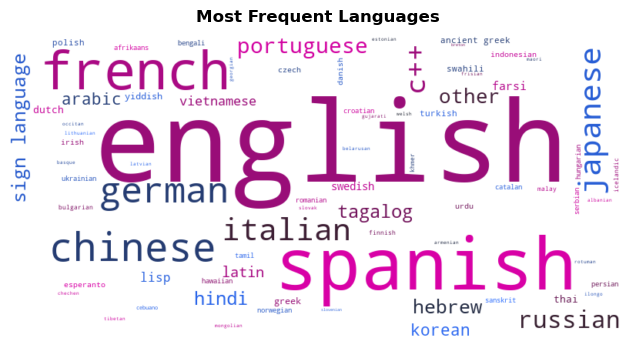

Counter({'english': 60350,
         'spanish': 16315,
         'french': 7852,
         'chinese': 3663,
         'german': 3083,
         'japanese': 2188,
         'italian': 2181,
         'c++': 1773,
         'russian': 1283,
         'portuguese': 1074,
         'other': 929,
         'sign language': 829,
         'hebrew': 805,
         'tagalog': 768,
         'hindi': 751,
         'arabic': 589,
         'korean': 567,
         'latin': 478,
         'vietnamese': 400,
         'lisp': 355,
         'farsi': 316,
         'swedish': 267,
         'thai': 239,
         'dutch': 238,
         'yiddish': 209,
         'greek': 207,
         'ancient greek': 183,
         'swahili': 172,
         'polish': 157,
         'turkish': 155,
         'indonesian': 138,
         'urdu': 132,
         'irish': 129,
         'czech': 125,
         'danish': 124,
         'esperanto': 117,
         'tamil': 103,
         'sanskrit': 102,
         'norwegian': 95,
         'hawaiian': 93,


In [19]:
# # visualise languages as wordcloud
# Function to extract language names from each row
def extract_languages(text):
    if pd.isna(text):
        return []  # Return empty list if NaN
    return [re.sub(r'\s*\(.*?\)', '', lang.strip()) for lang in text.split(',')]  # Remove proficiency levels

# Flatten the list of all languages while keeping frequency
all_languages = []
for speaks in profiles['speaks'].dropna():
    all_languages.extend(extract_languages(speaks))  # Collect all occurrences of each language

# Count frequency of each language
language_counts = Counter(all_languages)

# Define stopwords to exclude
custom_stopwords = {"fluently", "okay", "poorly"}  # Just in case

# Create a custom color palette for WordCloud
colors = sns.diverging_palette(330, 260, s=100, l=50, n=2000, center="dark", as_cmap=False)

# Custom color function
def custom_color_func(word=None, font_size=None, position=None, orientation=None, font_path=None, random_state=None):
    return tuple(int(x * 255) for x in colors[random_state.randint(0, len(colors) - 1)])

# Generate the word cloud from the frequency dictionary
wordcloud = WordCloud(width=800, height=400, background_color='white', color_func=custom_color_func, 
                      stopwords=STOPWORDS.union(custom_stopwords)).generate_from_frequencies(language_counts)

# Plot the word cloud
plt.figure(figsize=(8, 4))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Most Frequent Languages', fontweight='bold', fontsize='large')

# Display figure
plt.show()

# Print list of languages frequencies
display(language_counts)

In [9]:
# Function to extract language names from each row
def extract_languages(text):
    if pd.isna(text):
        return []  # Return empty list if NaN
    return [re.sub(r'\s*\(.*?\)', '', lang.strip()) for lang in text.split(',')]  # Remove proficiency levels

# Flatten the list of all languages while keeping frequency
all_languages = []
for speaks in profiles['speaks'].dropna():
    all_languages.extend(extract_languages(speaks))  # Collect all occurrences of each language

# Count frequency of each language
language_counts = Counter(all_languages)

# Function to compute the total frequency score for each individual and create this number to encode "speaks" to capture the relative importance of languages spoken by any individual
def encode_speaks(text):
    if pd.isna(text):
        return 0  # Assign 0 if NaN
    languages = [re.sub(r'\s*\(.*?\)', '', lang.strip()) for lang in text.split(',')]  # Extract language names
    return sum(language_counts.get(lang, 0) for lang in languages)  # Sum the frequencies

# Apply encoding function to create "speaks_clean" column
profiles["speaks_counter"] = profiles["speaks"].apply(encode_speaks)

# Display the first few rows to verify
profiles[["speaks", "speaks_counter"]].head()

,speaks,speaks_counter
0,english,60350
1,"english (fluently), spanish (poorly), french (...",84517
2,"english, french, c++",69975
3,"english, german (poorly)",63433
4,english,60350


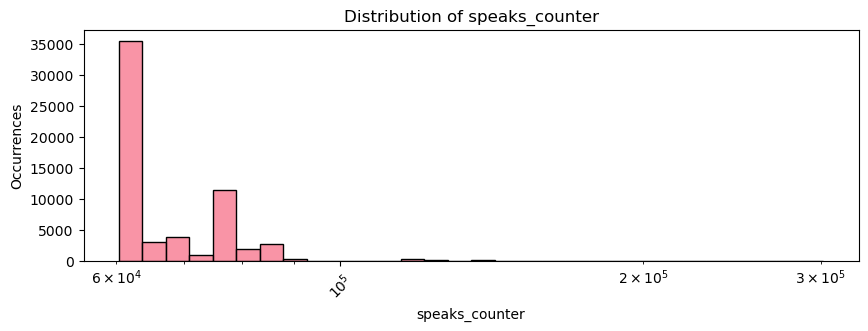

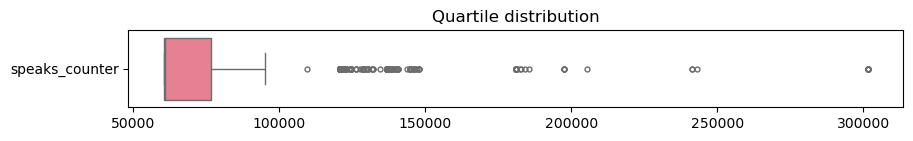

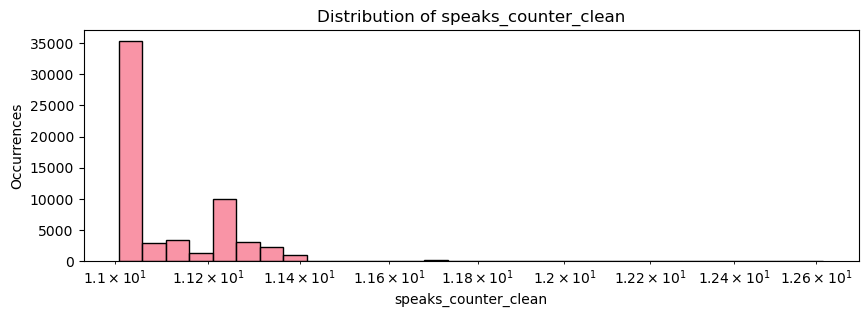

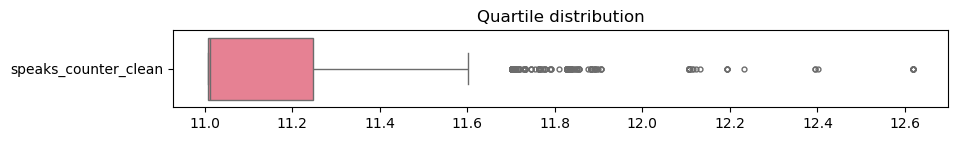

In [11]:
# speaks_counter has a right skew so log-transformation is required for stats
# Filter out zero values from speaks_counter before transformation
profiles = profiles[profiles['speaks_counter'] > 0].copy()
# Apply log transformation again on the filtered data
profiles['speaks_counter_clean'] = profiles['speaks_counter'].apply(lambda x: np.log1p(x))

# Select the correct variables for plotting
variable_to_plot = profiles[['speaks_counter']]
variable_to_plot2 = profiles[['speaks_counter_clean']]

# Function to plot histograms
def hist_num_variable(df):
    colors = sns.color_palette("husl", len(df.columns))      
    for i, column in enumerate(df.columns):
        plt.figure(figsize=(10, 3))
        sns.histplot(data=df, x=column, bins=30, log_scale=True, color=colors[i])  # Fix log_scale
        plt.title(f"Distribution of {column}")
        plt.xlabel(column)
        plt.ylabel("Occurrences")
        plt.xticks(rotation=45)  
        plt.show()

# Function to plot boxplots
def box_num_variable(df):
    colors = sns.color_palette("husl", len(df.columns))      
    fig, ax = plt.subplots(figsize=(10, 1))  # Use single figure for all boxplots
    sns.boxplot(data=df, orient='h', fliersize=3.5, ax=ax, palette=colors[:len(df.columns)])  # Fix color indexing
    plt.title("Quartile distribution")
    plt.show()

# Plot original distribution
hist_num_variable(variable_to_plot)
box_num_variable(variable_to_plot)

# Plot transformed distribution
hist_num_variable(variable_to_plot2)
box_num_variable(variable_to_plot2)

In [14]:
# check df
display(profiles.head(2))
# check column names
display(profiles.columns)
# check variable types
display(profiles.info())
# print numerical variables
display(profiles.select_dtypes(exclude=['object']).columns)

,profile_id,age,body_type,diet,drinks,drugs,education,essay0,essay1,essay2,essay3,essay4,essay5,essay6,essay7,essay8,essay9,ethnicity,height,income,job,last_online,location,offspring,orientation,pets,religion,sex,sign,smokes,speaks,status,age_filtered,height_filtered,income_filtered,age_clean,height_clean,income_clean,location_town,location_state,location_country,body_type_level,diet_code,diet_level,drinks_level,drugs_level,education_level,education_type,education_code,ethnicity_clean,ethnicity_code,job_code,location_town_code,offspring_has,offspring_wants,orientation_code,pets_dog,pets_cat,religion_code,religion_level,sex_code,sign_code,sign_level,smokes_code,speaks_fluently,speaks_okay,speaks_poorly,speaks_fine,speaks_program,status_code,speaks_counter,speaks_counter_clean
0,1,22,a little extra,strictly anything,socially,never,working on college/university,about me:<br />\n<br />\ni would love to think...,currently working as an international agent fo...,making people laugh.<br />\nranting about a go...,"the way i look. i am a six foot half asian, ha...","books:<br />\nabsurdistan, the republic, of mi...",food.<br />\nwater.<br />\ncell phone.<br />\n...,duality and humorous things,trying to find someone to hang out with. i am ...,i am new to california and looking for someone...,you want to be swept off your feet!<br />\nyou...,"asian, white",75.0,-1,transportation,2012-06-28-20-30,"south san francisco, california","doesn’t have kids, but might want them",straight,likes dogs and likes cats,agnosticism and very serious about it,m,gemini,sometimes,english,single,22.0,75.0,NaN,3.091042,75.0,NaN,south san francisco,california,US,1,1,3,2,0,1,college/university,0,"asian, white",1,12,174,0,1,0,1,1,0,4,0,5,0,2,0,0,0,1,0,3,60350,11.007933
1,2,35,average,mostly other,often,sometimes,working on space camp,i am a chef: this is what that means.<br />\n1...,dedicating everyday to being an unbelievable b...,being silly. having ridiculous amonts of fun w...,NaN,i am die hard christopher moore fan. i don't r...,delicious porkness in all of its glories.<br /...,NaN,NaN,i am very open and will share just about anyth...,NaN,white,70.0,80000,hospitality / travel,2012-06-29-21-41,"oakland, california","doesn’t have kids, but might want them",straight,likes dogs and likes cats,agnosticism but not too serious about it,m,cancer,no,"english (fluently), spanish (poorly), french (...",single,35.0,70.0,80000.0,3.555348,70.0,43.088694,oakland,california,US,0,2,2,3,1,1,space camp,6,white,8,4,117,0,1,0,1,1,0,2,0,3,0,0,1,0,2,3,0,3,84517,11.344720


Index(['profile_id', 'age', 'body_type', 'diet', 'drinks', 'drugs',
       'education', 'essay0', 'essay1', 'essay2', 'essay3', 'essay4', 'essay5',
       'essay6', 'essay7', 'essay8', 'essay9', 'ethnicity', 'height', 'income',
       'job', 'last_online', 'location', 'offspring', 'orientation', 'pets',
       'religion', 'sex', 'sign', 'smokes', 'speaks', 'status', 'age_filtered',
       'height_filtered', 'income_filtered', 'age_clean', 'height_clean',
       'income_clean', 'location_town', 'location_state', 'location_country',
       'body_type_level', 'diet_code', 'diet_level', 'drinks_level',
       'drugs_level', 'education_level', 'education_type', 'education_code',
       'ethnicity_clean', 'ethnicity_code', 'job_code', 'location_town_code',
       'offspring_has', 'offspring_wants', 'orientation_code', 'pets_dog',
       'pets_cat', 'religion_code', 'religion_level', 'sex_code', 'sign_code',
       'sign_level', 'smokes_code', 'speaks_fluently', 'speaks_okay',
       'speaks_

<class 'pandas.core.frame.DataFrame'>
Index: 59896 entries, 0 to 59945
Data columns (total 72 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   profile_id            59896 non-null  object 
 1   age                   59896 non-null  int64  
 2   body_type             54606 non-null  object 
 3   diet                  35530 non-null  object 
 4   drinks                56923 non-null  object 
 5   drugs                 45841 non-null  object 
 6   education             53281 non-null  object 
 7   essay0                54419 non-null  object 
 8   essay1                52343 non-null  object 
 9   essay2                50274 non-null  object 
 10  essay3                48442 non-null  object 
 11  essay4                49377 non-null  object 
 12  essay5                49067 non-null  object 
 13  essay6                46147 non-null  object 
 14  essay7                47465 non-null  object 
 15  essay8                40

None

Index(['age', 'height', 'income', 'age_filtered', 'height_filtered',
       'income_filtered', 'age_clean', 'height_clean', 'income_clean',
       'body_type_level', 'diet_code', 'diet_level', 'drinks_level',
       'drugs_level', 'education_level', 'education_code', 'ethnicity_code',
       'job_code', 'location_town_code', 'offspring_has', 'offspring_wants',
       'orientation_code', 'pets_dog', 'pets_cat', 'religion_code',
       'religion_level', 'sex_code', 'sign_code', 'sign_level', 'smokes_code',
       'speaks_fluently', 'speaks_okay', 'speaks_poorly', 'speaks_fine',
       'speaks_program', 'status_code', 'speaks_counter',
       'speaks_counter_clean'],
      dtype='object')

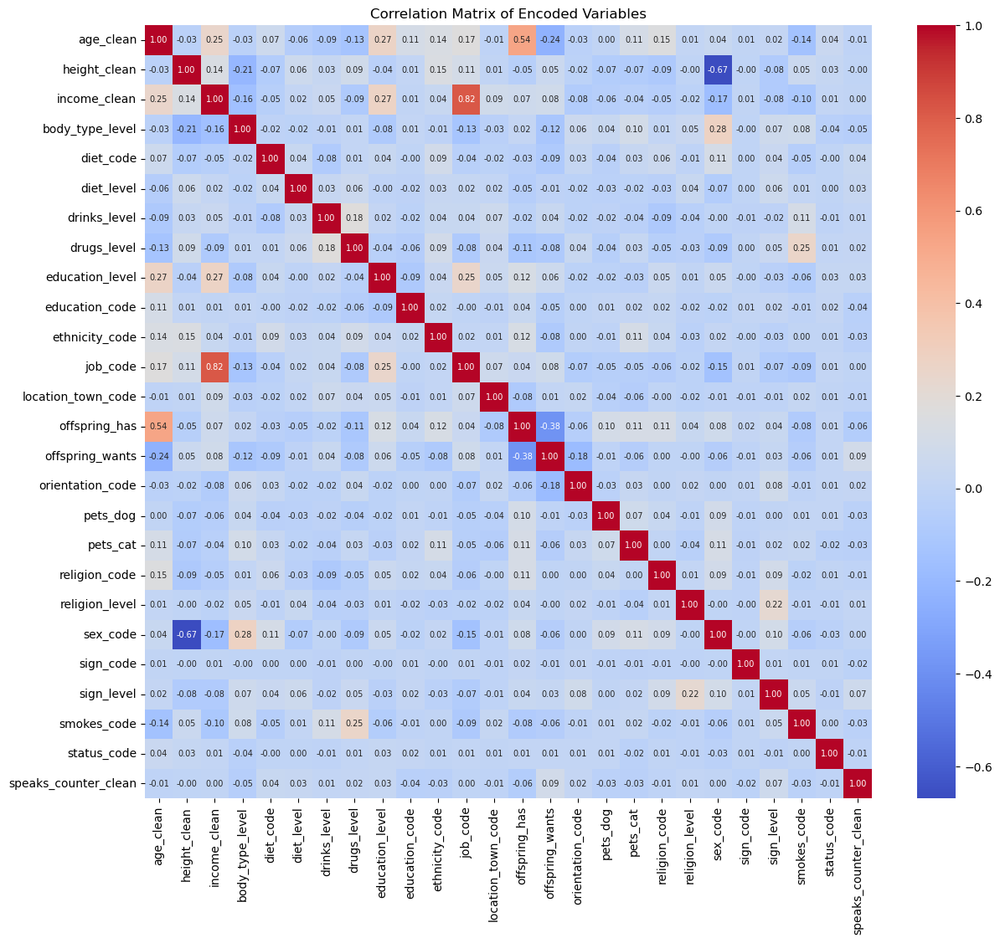

In [19]:
# load data (if running this analysis on its own)
profiles = pd.read_csv('profiles_filtered_hdbscan.csv', encoding='utf-8', dtype={"profile_id": str}, index_col="profile_id", low_memory=False)

## correlation matrix on recoded data
# isolate variables of interest
columns_to_plot = ['age_clean', 'height_clean', 'income_clean', 
       'body_type_level', 'diet_code', 'diet_level', 'drinks_level',
       'drugs_level', 'education_level', 'education_code',
       'ethnicity_code', 'job_code', 'location_town_code',
       'offspring_has', 'offspring_wants', 'orientation_code', 'pets_dog',
       'pets_cat', 'religion_code', 'religion_level', 'sex_code', 'sign_code',
       'sign_level', 'smokes_code', 'status_code', 'speaks_counter_clean']

# # isolate variables of interest (including dominant topics defined further down)
# columns_to_plot = ['age_clean', 'height_clean', 'income_clean', 
#        'body_type_level', 'diet_code', 'diet_level', 'drinks_level',
#        'drugs_level', 'education_level', 'education_code',
#        'ethnicity_code', 'job_code', 'location_town_code',
#        'offspring_has', 'offspring_wants', 'orientation_code', 'pets_dog',
#        'pets_cat', 'religion_code', 'religion_level', 'sex_code', 'sign_code',
#        'sign_level', 'smokes_code', 'status_code', 'speaks_counter_clean', "Dominant_Topic", "Topic_Prevalence"]

# Create correlation matrix
corr_matrix_1 = profiles[columns_to_plot].corr()
# Plot the heatmap
plt.figure(figsize=(14, 12))  # Adjust figure size for better readability
sns.heatmap(corr_matrix_1, annot=True, cmap='coolwarm', annot_kws={"size": 7}, fmt='.2f')
plt.title("Correlation Matrix of Encoded Variables")
# Export figure
plt.savefig('correlation_matrix.png', dpi=300, bbox_inches='tight')
plt.show()


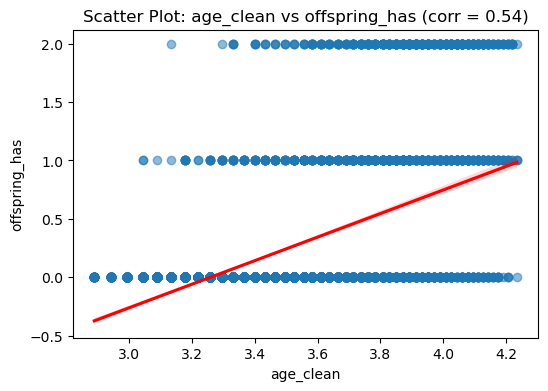

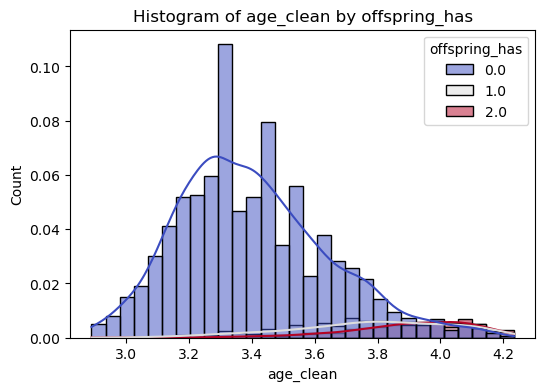

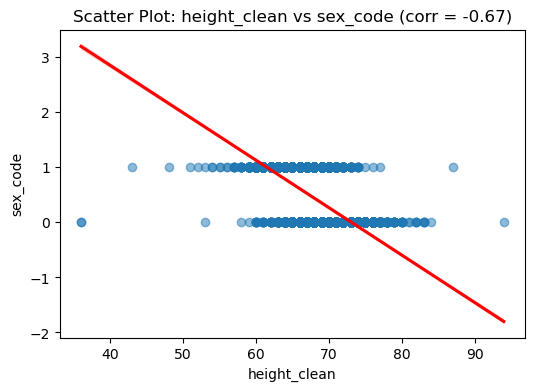

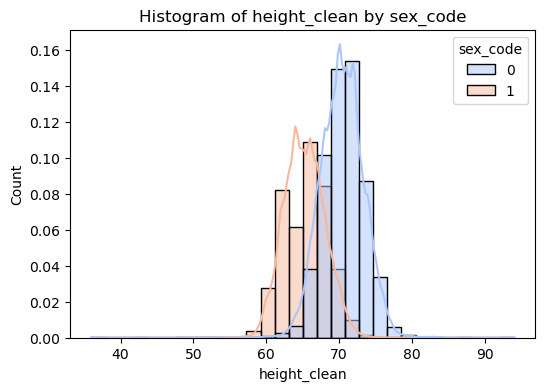

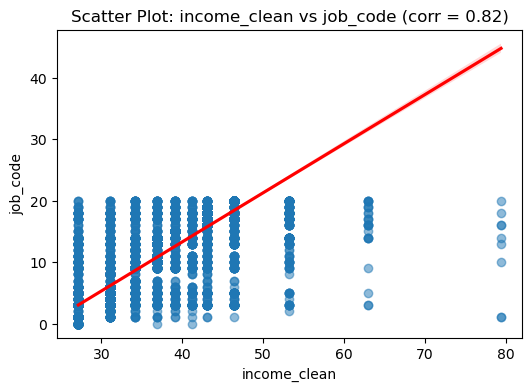

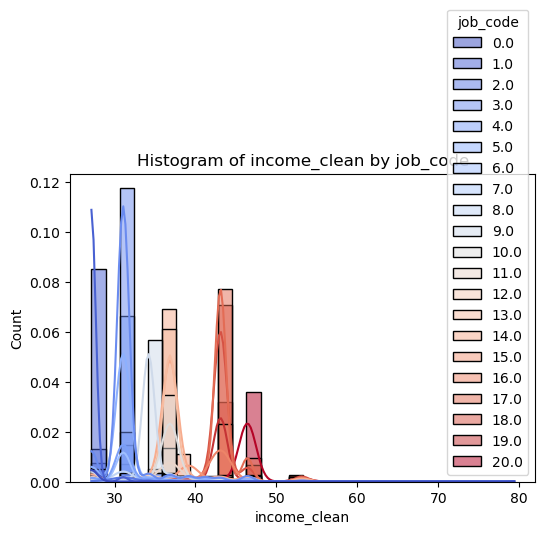

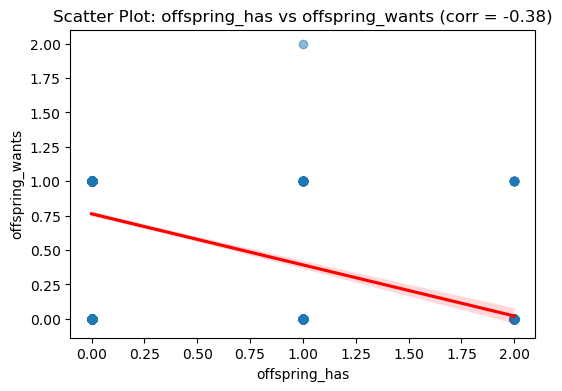

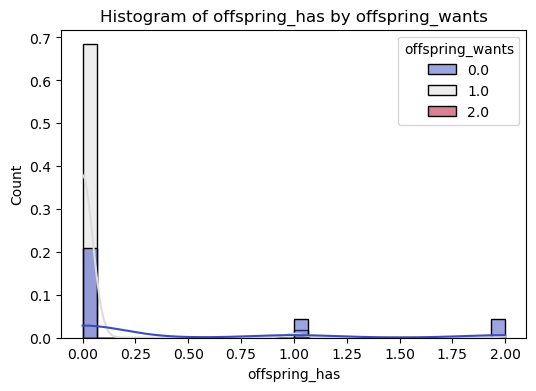

In [20]:
# isolate variables of interest
columns_to_plot = ['age_clean', 'height_clean', 'income_clean', 
       'body_type_level', 'diet_code', 'diet_level', 'drinks_level',
       'drugs_level', 'education_level', 'education_code',
       'ethnicity_code', 'job_code', 'location_town_code',
       'offspring_has', 'offspring_wants', 'orientation_code', 'pets_dog',
       'pets_cat', 'religion_code', 'religion_level', 'sex_code', 'sign_code',
       'sign_level', 'smokes_code', 'status_code', 'speaks_counter_clean']

# compute correlation, isolate correlated pairs and plot their scatterplots and histograms
def plot_top_correlations(df, columns, threshold=0.5, bins=30):
    """
    Identifies and plots scatter plots with regression lines 
    and histograms for the most correlated variable pairs in a DataFrame.

    Parameters:
    - df: DataFrame containing the data.
    - columns: List of column names to compute correlations.
    - threshold: Minimum absolute correlation value to consider for plotting.
    - bins: Number of bins for the histogram plot.

    Returns:
    - None (displays scatter plots with regression lines and histograms).
    """

    # Compute correlation matrix
    corr_matrix = df[columns].corr()

    # Extract the upper triangle of the correlation matrix (to avoid duplicate pairs)
    corr_pairs = (
        corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(bool))
        .stack()
        .reset_index()
    )
    corr_pairs.columns = ['Variable 1', 'Variable 2', 'Correlation']

    # Filter for high correlations
    high_corr_pairs = corr_pairs[abs(corr_pairs['Correlation']) >= threshold]

    # Plot scatter plots with regression lines and histograms
    for idx, row in high_corr_pairs.iterrows():
        var1, var2 = row['Variable 1'], row['Variable 2']

        # Scatter plot with regression line
        plt.figure(figsize=(6, 4))
        sns.regplot(data=df, x=var1, y=var2, scatter_kws={'alpha': 0.5}, line_kws={'color': 'red'})
        plt.title(f"Scatter Plot: {var1} vs {var2} (corr = {row['Correlation']:.2f})")
        plt.xlabel(var1)
        plt.ylabel(var2)
        plt.show()

        # Histogram with hue
        plt.figure(figsize=(6, 4))
        sns.histplot(data=df, x=var1, hue=var2, bins=bins, kde=True, palette="coolwarm", alpha=0.5, stat='probability')
        plt.title(f"Histogram of {var1} by {var2}")
        plt.xlabel(var1)
        plt.ylabel("Count")
        plt.show()

# Example usage
plot_top_correlations(profiles, columns_to_plot, threshold=0.3, bins=30)

__Conclusions on correlations:__  
height_clean and sex_clean are somewhat strongly correlated (|0.66|): that's expected as men are on avergae taller than women.    
age_clean and offspring_has are correlated (|0.56|): that's expected as older individuals are more like to have kids than younger ones    
smokes_clean and drugs_clean are slightly correlated(|0.35|): smokers are more prone to suing drugs.     
all the speaks encoded variables are positively correlated, which only means that the more languages listed, the more languages spoken (whether fluently, fine, okay or poorly) so it's not good way to encode the data. I will not be using this variable in my ML model later on unless I can recode it.    

### Essay categorical variables
__steps:__  
- process data
- wrangle/clean data
- plot clean data

__list of variables:__
- **essay0:** categorical variable representing the individual's summary; 5488 NAs; 54350 categories
- **essay1:** categorical variable representing the individual's life; 7572 NAs; 51516 categories
- **essay2:** categorical variable representing the individual's qualities; 9638 NAs; 48635 categories
- **essay3:** categorical variable representing the individual's obvious traits; 11476 NAs; 43533 categories
- **essay4:** categorical variable representing the individual's favorite books, movies, show, music, and food; 10537 NAs; 49260 categories
- **essay5:** categorical variable representing the individual's six most important things; 10850 NAs; 48963 categories
- **essay6:** categorical variable representing the individual's main thoughts: 13771 NAs; 43603 categories
- **essay7:** categorical variable representing the individual's Friday night habits; 12451 NAs; 45554 categories
- **essay8:** categorical variable representing the individual's most private admissions; 19225 NAs; 39324 categories
- **essay9:** categorical variable representing the individual's expectations from others; 12603 NAs; 45443 categories

Lemmatizing Text: 100%|██████████| 59896/59896 [44:59<00:00, 22.19it/s]   


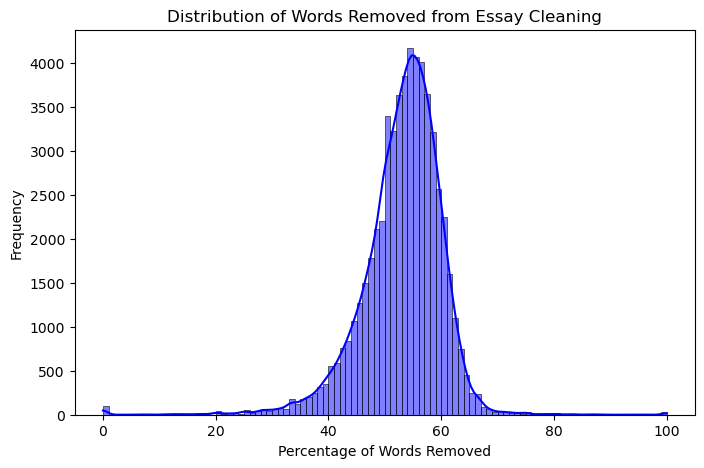

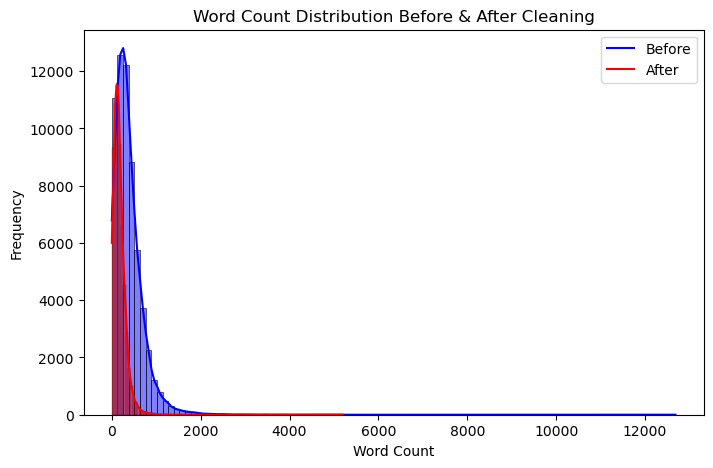

,profile_id,essay_combined,essay_clean
0,1,about me:<br />\n<br />\ni would love to think...,love think kind intellectual dumb smart guy sm...
1,2,i am a chef: this is what that means.<br />\n1...,chef mean workaholic love cook regardless work...
2,3,"i'm not ashamed of much, but writing public te...",ashamed write public text online date site mak...
3,4,i work in a library and go to school. . . read...,work library school reading thing write old de...
4,5,hey how's it going? currently vague on the pro...,hey currently vague profile know come soon loo...


📊 Total words before cleaning: 22,808,851
📊 Total words after cleaning: 10,360,533
✅ 45.42% words retained after cleaning.


In [17]:
# faster code on whole dataset with parallel processing (takes 50 min)
from tqdm import tqdm  # Progress bar

# Load SpaCy model with disabled components for speed
nlp = spacy.load("en_core_web_sm", disable=["parser", "ner"])  # Disable parser & NER for efficiency

# Pre-compiled regex patterns
html_tags = re.compile(r'<[^>]+>')  # Remove HTML tags
special_chars = re.compile(r'[^\w\s]')  # Remove punctuation
extra_spaces = re.compile(r'\s+')  # Remove extra spaces
line_breaks = re.compile(r'<br\s*/?>')  # Remove line breaks
numbers = re.compile(r'\d+')  # Remove numbers

# Optimized Text Preprocessing Function (No Lemmatization)
def preprocess_text(text):
    text = text.lower()
    text = line_breaks.sub(' ', text)
    text = html_tags.sub(' ', text)
    text = numbers.sub('', text)
    text = special_chars.sub('', text)
    text = extra_spaces.sub(' ', text).strip()
    text = html.unescape(text).replace("&amp", "")
    return text  # Return cleaned text (no lemmatization yet)

# Concatenate essay columns into one
profiles["essay_combined"] = profiles[['essay0', 'essay1', 'essay2', 'essay3', 'essay4', 
                                       'essay5', 'essay6', 'essay7', 'essay8', 'essay9']].fillna('').agg(' '.join, axis=1)

# Convert to a list before processing
essay_list = profiles["essay_combined"].tolist()

# Process Preprocessing in Batches (No Parallel Processing)
cleaned_essays = [preprocess_text(text) for text in tqdm(essay_list, desc="Cleaning Text")]

# Assign cleaned essays back to DataFrame
profiles["essay_clean"] = cleaned_essays

# Batch Process Lemmatization with SpaCy (Fix Read-Only Issue)**
def lemmatize_texts(text_list):
    """
    Processes text in batches using nlp.pipe().
    Handles memory efficiently and avoids missing values.
    """
    results = []
    for doc in tqdm(nlp.pipe(text_list, batch_size=1000), total=len(text_list), desc="Lemmatizing Text"):
        lemmatized_text = ' '.join([token.lemma_ for token in doc if not token.is_stop and len(token.lemma_) > 2])
        results.append(lemmatized_text)
    return results

# Apply Lemmatization Without Joblib (Avoid Read-Only Errors)
lemmatized_essays = lemmatize_texts(cleaned_essays)

# Assign lemmatized essays back to DataFrame
profiles["essay_clean"] = lemmatized_essays

# Word Count Computation
profiles["word_count_combined"] = profiles["essay_combined"].str.split().str.len()
profiles["word_count_clean"] = profiles["essay_clean"].str.split().str.len()
profiles["percent_words_removed"] = ((profiles["word_count_combined"] - profiles["word_count_clean"]) / profiles["word_count_combined"]) * 100

# Histogram of Word Removal
plt.figure(figsize=(8, 5))
sns.histplot(profiles["percent_words_removed"].dropna(), bins=100, kde=True, color="blue")
plt.xlabel("Percentage of Words Removed")
plt.ylabel("Frequency")
plt.title("Distribution of Words Removed from Essay Cleaning")
plt.show()

# Histogram of Word Counts Before & After
plt.figure(figsize=(8, 5))
sns.histplot(profiles["word_count_combined"].dropna(), bins=100, kde=True, color="blue", alpha=0.5)
sns.histplot(profiles["word_count_clean"].dropna(), bins=100, kde=True, color="red", alpha=0.5)
plt.xlabel("Word Count")
plt.ylabel("Frequency")
plt.title("Word Count Distribution Before & After Cleaning")
plt.legend(['Before', 'After'])
plt.show()

# Display first few rows
display(profiles[["profile_id", "essay_combined", "essay_clean"]].head())

# Summarize Word Counts
total_words_before = profiles["word_count_combined"].sum()
total_words_after = profiles["word_count_clean"].sum()
percentage_kept = (total_words_after / total_words_before) * 100

print(f"Total words before cleaning: {total_words_before:,}")
print(f"Total words after cleaning: {total_words_after:,}")
print(f"{percentage_kept:.2f}% words retained after cleaning.")


In [21]:
# display full df
display(profiles.head(1))
# list of columns
display(profiles.columns)

# export cleaned dataset
# isolate variables of interest
columns_to_export = ['profile_id', 'body_type', 'diet', 'drinks', 'drugs',
       'education',  'ethnicity', 'height', 'income',
       'job',  'offspring', 'orientation', 'pets',
       'religion', 'sex', 'sign', 'smokes', 'speaks', 'status', 'age_filtered',
       'height_filtered', 'income_filtered', 'age_clean', 'height_clean',
       'income_clean', 'location_town', 'location_state', 'location_country',
       'body_type_level', 'diet_code', 'diet_level', 'drinks_level',
       'drugs_level', 'education_level', 'education_type', 'education_code',
       'ethnicity_clean', 'ethnicity_code', 'job_code', 'location_town_code',
       'offspring_has', 'offspring_wants', 'orientation_code', 'pets_dog',
       'pets_cat', 'religion_code', 'religion_level', 'sex_code', 'sign_code',
       'sign_level', 'smokes_code', 'speaks_fluently', 'speaks_okay',
       'speaks_poorly', 'speaks_fine', 'speaks_program', 'status_code',
       'speaks_counter', 'speaks_counter_clean', 'essay_combined',
       'essay_clean', 'word_count_combined', 'word_count_clean',
       'percent_words_removed']
# Subset columns to export
profiles_to_export = profiles[columns_to_export]
# export file
profiles_to_export.to_csv('profiles_clean.csv', sep=',', index=True)

,profile_id,age,body_type,diet,drinks,drugs,education,essay0,essay1,essay2,essay3,essay4,essay5,essay6,essay7,essay8,essay9,ethnicity,height,income,job,last_online,location,offspring,orientation,pets,religion,sex,sign,smokes,speaks,status,age_filtered,height_filtered,income_filtered,age_clean,height_clean,income_clean,location_town,location_state,location_country,body_type_level,diet_code,diet_level,drinks_level,drugs_level,education_level,education_type,education_code,ethnicity_clean,ethnicity_code,job_code,location_town_code,offspring_has,offspring_wants,orientation_code,pets_dog,pets_cat,religion_code,religion_level,sex_code,sign_code,sign_level,smokes_code,speaks_fluently,speaks_okay,speaks_poorly,speaks_fine,speaks_program,status_code,speaks_counter,speaks_counter_clean,essay_combined,essay_clean,word_count_combined,word_count_clean,percent_words_removed
0,1,22,a little extra,strictly anything,socially,never,working on college/university,about me:<br />\n<br />\ni would love to think...,currently working as an international agent fo...,making people laugh.<br />\nranting about a go...,"the way i look. i am a six foot half asian, ha...","books:<br />\nabsurdistan, the republic, of mi...",food.<br />\nwater.<br />\ncell phone.<br />\n...,duality and humorous things,trying to find someone to hang out with. i am ...,i am new to california and looking for someone...,you want to be swept off your feet!<br />\nyou...,"asian, white",75.0,-1,transportation,2012-06-28-20-30,"south san francisco, california","doesn’t have kids, but might want them",straight,likes dogs and likes cats,agnosticism and very serious about it,m,gemini,sometimes,english,single,22.0,75.0,NaN,3.091042,75.0,NaN,south san francisco,california,US,1,1,3,2,0,1,college/university,0,"asian, white",1,12,174,0,1,0,1,1,0,4,0,5,0,2,0,0,0,1,0,3,60350,11.007933,about me:<br />\n<br />\ni would love to think...,love think kind intellectual dumb smart guy sm...,485,221,54.43299


Index(['profile_id', 'age', 'body_type', 'diet', 'drinks', 'drugs',
       'education', 'essay0', 'essay1', 'essay2', 'essay3', 'essay4', 'essay5',
       'essay6', 'essay7', 'essay8', 'essay9', 'ethnicity', 'height', 'income',
       'job', 'last_online', 'location', 'offspring', 'orientation', 'pets',
       'religion', 'sex', 'sign', 'smokes', 'speaks', 'status', 'age_filtered',
       'height_filtered', 'income_filtered', 'age_clean', 'height_clean',
       'income_clean', 'location_town', 'location_state', 'location_country',
       'body_type_level', 'diet_code', 'diet_level', 'drinks_level',
       'drugs_level', 'education_level', 'education_type', 'education_code',
       'ethnicity_clean', 'ethnicity_code', 'job_code', 'location_town_code',
       'offspring_has', 'offspring_wants', 'orientation_code', 'pets_dog',
       'pets_cat', 'religion_code', 'religion_level', 'sex_code', 'sign_code',
       'sign_level', 'smokes_code', 'speaks_fluently', 'speaks_okay',
       'speaks_

# LDA (Latent Dirichlet Allocation) for Topic Modeling from essay_clean
Now that the text is preprocessed, let's apply LDA using Gensim and Scikit-Learn's CountVectorizer.  

## Optimisation of k

Evaluating LDA Topics:  10%|█         | 1/10 [08:46<1:18:54, 526.09s/it]

Topics: 10, Coherence Score: 0.3359


Evaluating LDA Topics:  20%|██        | 2/10 [18:07<1:12:55, 546.98s/it]

Topics: 20, Coherence Score: 0.3277


Evaluating LDA Topics:  30%|███       | 3/10 [28:43<1:08:32, 587.52s/it]

Topics: 30, Coherence Score: 0.3195


Evaluating LDA Topics:  40%|████      | 4/10 [41:40<1:06:13, 662.27s/it]

Topics: 40, Coherence Score: 0.3393


Evaluating LDA Topics:  50%|█████     | 5/10 [55:30<1:00:14, 722.89s/it]

Topics: 50, Coherence Score: 0.3307


Evaluating LDA Topics:  60%|██████    | 6/10 [1:10:38<52:23, 785.83s/it]

Topics: 60, Coherence Score: 0.3328


Evaluating LDA Topics:  70%|███████   | 7/10 [1:27:50<43:18, 866.10s/it]

Topics: 70, Coherence Score: 0.3277


Evaluating LDA Topics:  80%|████████  | 8/10 [1:53:19<35:54, 1077.16s/it]

Topics: 80, Coherence Score: 0.3324


Evaluating LDA Topics:  90%|█████████ | 9/10 [2:22:02<21:19, 1279.11s/it]

Topics: 90, Coherence Score: 0.3341


Evaluating LDA Topics: 100%|██████████| 10/10 [2:44:41<00:00, 988.16s/it] 

Topics: 100, Coherence Score: 0.3327


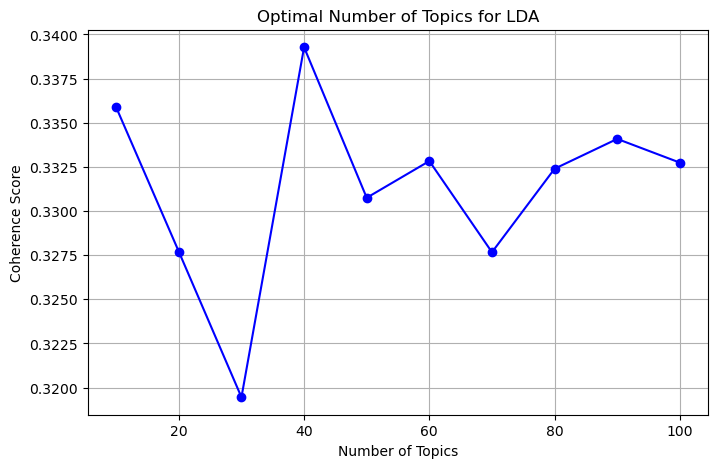

✅ Finished evaluating LDA models. Results saved to 'lda_coherence_scores.csv'
🔥 Optimal Number of Topics: 30


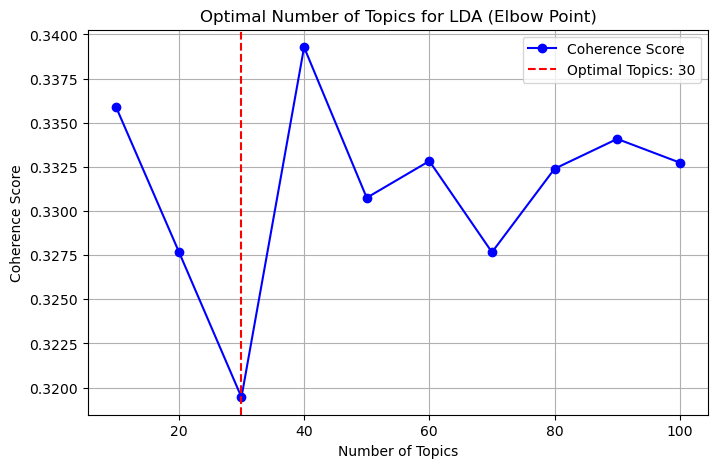

In [30]:
# optimise number of topics (takes 2h 40min min to run)
# Optimized Topic Testing
topic_range = list(range(10, 110, 10))  # [10, 20, ..., 100]
coherence_scores = []

# Use tqdm progress bar
for num_topics in tqdm(topic_range, desc="Evaluating LDA Topics"):
    # 🚀 **Use LdaMulticore for faster processing**
    lda_model = gensim.models.LdaMulticore(
        corpus=corpus,
        id2word=id2word,
        num_topics=num_topics,
        random_state=42,
        passes=5,  # Reduced from 10 to 5 for speed
        chunksize=5000,  # Increased batch size
        workers=max(1, multiprocessing.cpu_count() - 1)  # Use all available CPU cores
    )

    # Compute Coherence Score (Quality of Topics)
    coherence_model = CoherenceModel(model=lda_model, texts=profiles["essay_tokens"], dictionary=id2word, coherence='c_v')
    coherence_score = coherence_model.get_coherence()
    coherence_scores.append(coherence_score)

    # Print progress
    print(f"Topics: {num_topics}, Coherence Score: {coherence_score:.4f}")

# Store results in a DataFrame for analysis
coherence_df = pd.DataFrame({"num_topics": topic_range, "coherence_score": coherence_scores})
coherence_df.to_csv("lda_coherence_scores.csv", index=False)  # Save results

# Plot Coherence Score vs. Number of Topics
plt.figure(figsize=(8, 5))
plt.plot(topic_range, coherence_scores, marker="o", linestyle="-", color="blue")
plt.xlabel("Number of Topics")
plt.ylabel("Coherence Score")
plt.title("Optimal Number of Topics for LDA")
plt.grid()
plt.show()

print("Finished evaluating LDA models. Results saved to 'lda_coherence_scores.csv'")

from kneed import KneeLocator

# Find the "Elbow Point" (Best Number of Topics)
knee = KneeLocator(topic_range, coherence_scores, curve="convex", direction="decreasing")

# Print Optimal Number of Topics
best_num_topics = knee.knee
print(f"Optimal Number of Topics: {best_num_topics}")

# Plot with Elbow Point
plt.figure(figsize=(8, 5))
plt.plot(topic_range, coherence_scores, marker="o", linestyle="-", color="blue", label="Coherence Score")
plt.axvline(x=best_num_topics, color="red", linestyle="--", label=f"Optimal Topics: {best_num_topics}")
plt.xlabel("Number of Topics")
plt.ylabel("Coherence Score")
plt.title("Optimal Number of Topics for LDA (Elbow Point)")
plt.legend()
plt.grid()
plt.show()


## Applying LDA using optimal k

Tokenizing Essays: 100%|██████████| 59896/59896 [00:02<00:00, 24612.92it/s]


✅ Dictionary created with 26534 unique words.


Converting to BoW: 100%|██████████| 59896/59896 [00:14<00:00, 4223.55it/s]


✅ LDA Model Training Complete!
(19, '0.010*"david" + 0.007*"read" + 0.007*"film" + 0.005*"vonnegut" + 0.005*"anderson" + 0.005*"author" + 0.005*"john" + 0.005*"watch" + 0.005*"favorite" + 0.004*"man"')
(16, '0.013*"think" + 0.011*"want" + 0.011*"know" + 0.007*"try" + 0.007*"eat" + 0.007*"lot" + 0.006*"read" + 0.005*"talk" + 0.005*"make" + 0.005*"pretty"')
(22, '0.019*"enjoy" + 0.014*"new" + 0.011*"look" + 0.011*"travel" + 0.011*"family" + 0.010*"great" + 0.009*"live" + 0.009*"fun" + 0.007*"find" + 0.007*"try"')
(10, '0.012*"want" + 0.007*"dance" + 0.007*"look" + 0.006*"girl" + 0.006*"guy" + 0.006*"school" + 0.006*"mom" + 0.005*"know" + 0.005*"kind" + 0.005*"boy"')
(1, '0.011*"try" + 0.010*"new" + 0.009*"think" + 0.008*"pretty" + 0.007*"game" + 0.007*"lot" + 0.007*"know" + 0.006*"want" + 0.006*"read" + 0.006*"play"')
(9, '0.014*"film" + 0.007*"know" + 0.005*"favorite" + 0.005*"family" + 0.005*"travel" + 0.005*"chocolate" + 0.005*"get" + 0.005*"year" + 0.005*"cook" + 0.005*"enjoy"')
(21,

Assigning Topics to Documents: 100%|██████████| 59896/59896 [02:13<00:00, 447.83it/s]


✅ Dominant topics assigned to each profile!


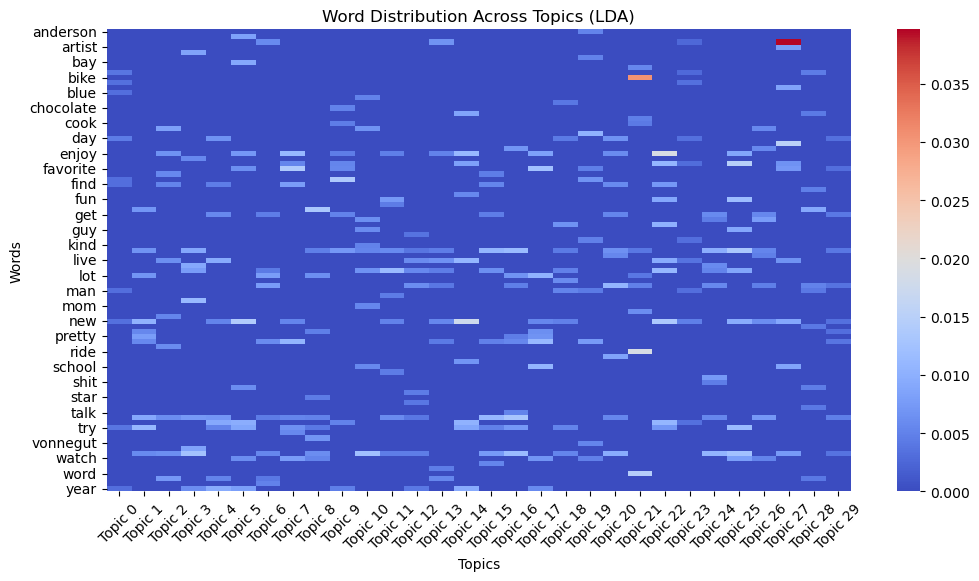

<Figure size 1200x600 with 0 Axes>

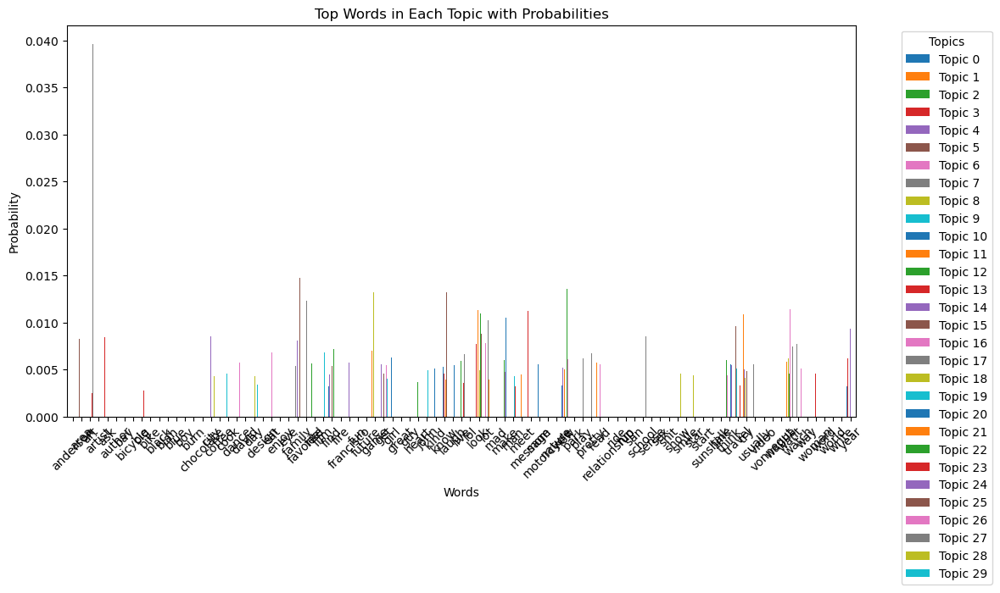

✅ Exported LDA results to 'lda_profiles_topics.csv'
✅ LDA model, dictionary, and corpus saved!


In [22]:
# apply LDA model on whole dataset using 30 topics with progress bar (takes 20 min to run)
# Tokenize Essays into Lists of Words
tqdm.pandas(desc="Tokenizing Essays")  # Add tqdm progress tracking
profiles["essay_tokens"] = profiles["essay_clean"].progress_apply(lambda x: x.split())

# Create a Dictionary and Corpus for LDA
id2word = corpora.Dictionary(profiles["essay_tokens"])

# Remove rare & common words to reduce noise
id2word.filter_extremes(no_below=10, no_above=0.5, keep_n=50000)
print(f"Dictionary created with {len(id2word)} unique words.")

# Convert to Bag-of-Words (BoW) format with progress tracking
corpus = [id2word.doc2bow(text) for text in tqdm(profiles["essay_tokens"], desc="Converting to BoW")]

# Use safe number of CPU cores
num_cores = max(1, multiprocessing.cpu_count() - 1)  # Use max available cores, but at least 1

# Train Optimized LDA Model (Much Faster)
num_topics = 30  # Adjust based on optimisation run above
lda_model = gensim.models.LdaMulticore(
    corpus=corpus,
    id2word=id2word,
    num_topics=num_topics,
    random_state=42,
    passes=5,  # Reduced from 10 → 5 (for speed)
    chunksize=5000,  # Increased from 100 → 5000 (faster per-pass)
    iterations=100,  # Adjusted for better topic coherence
    per_word_topics=True,
    workers=num_cores  # Uses all available cores safely
)
print("LDA Model Training Complete!")

# Display Topics
topics = lda_model.print_topics(num_words=10)
for topic in topics:
    print(topic)

print(f"Number of unique words in LDA model: {len(id2word)}")

# Map Each Document to Its Most Relevant Topics
tqdm.pandas(desc="Assigning Topics to Documents")
profiles["Dominant_Topic"] = profiles["essay_tokens"].progress_apply(
    lambda doc: sorted(lda_model.get_document_topics(id2word.doc2bow(doc)), key=lambda x: -x[1])[0][0]
)
print("Dominant topics assigned to each profile!")

# Heatmap Visualization
def plot_top_words_heatmap(lda_model, num_words=10):
    """
    Creates a heatmap of word probabilities across topics.
    """
    topics_dict = {}

    # Extract words and their probabilities for each topic
    for i in range(num_topics):
        words_probs = lda_model.show_topic(i, topn=num_words)
        words, probs = zip(*words_probs)
        topics_dict[f"Topic {i}"] = pd.Series(probs, index=words)

    # Convert to DataFrame
    topics_df = pd.DataFrame(topics_dict).fillna(0)

    # Plot heatmap
    plt.figure(figsize=(12, 6))
    sns.heatmap(topics_df, cmap="coolwarm", annot=False, fmt=".3f")
    plt.title("Word Distribution Across Topics (LDA)")
    plt.xlabel("Topics")
    plt.ylabel("Words")
    plt.xticks(rotation=45)
    plt.yticks(rotation=0)
    plt.show()

plot_top_words_heatmap(lda_model)

# Bar Plot for Top Words
def plot_top_words_fixed(lda_model, num_words=10):
    """
    Plots the top words per topic with probabilities.
    """
    topics_dict = {}

    # Extract words and their probabilities for each topic
    for i in range(num_topics):
        words_probs = lda_model.show_topic(i, topn=num_words)
        words, probs = zip(*words_probs)
        topics_dict[f"Topic {i}"] = pd.Series(probs, index=words)

    # Convert to DataFrame
    topics_df = pd.DataFrame(topics_dict)

    # Plot the topics
    plt.figure(figsize=(12, 6))
    topics_df.plot(kind="bar", figsize=(12, 6), width=0.8)
    plt.title("Top Words in Each Topic with Probabilities")
    plt.xlabel("Words")
    plt.ylabel("Probability")
    plt.xticks(rotation=45)
    plt.legend(title="Topics", bbox_to_anchor=(1.05, 1), loc="upper left")
    plt.show()

plot_top_words_fixed(lda_model)

# Save LDA Outputs (Ensuring profile_id is Retained)
profiles[["profile_id", "Dominant_Topic"]].to_csv("lda_profiles_topics.csv", index=False)
print("Exported LDA results to 'lda_profiles_topics.csv'")

# Save LDA Model & Corpus
lda_model.save("lda_model.gensim")
id2word.save("lda_dictionary.gensim")
with open("lda_corpus.pkl", "wb") as f:
    pickle.dump(corpus, f)
print("LDA model, dictionary, and corpus saved!")


In [23]:
# export LDA results
# Ensure profile_id is stored as a string (avoid integer conversion issues)
profiles["profile_id"] = profiles["profile_id"].astype(str)

# Export Topic-Word Distribution (Top words per topic)
topics_df = pd.DataFrame()
for i in range(num_topics):
    words_probs = lda_model.show_topic(i, topn=10)  # Get top 10 words
    words, probs = zip(*words_probs)
    topics_df[f"Topic {i} Words"] = words
    topics_df[f"Topic {i} Probabilities"] = probs

# Save topics
topics_df.to_csv("lda_topics.csv", index=False)
print("Exported topic-word distributions to 'lda_topics.csv'")

# Export Document-Topic Distribution with Profile ID**
doc_topics = []

# Use tqdm to track progress
for idx, doc in tqdm(enumerate(corpus), total=len(corpus), desc="Processing Documents"):
    topic_probs = lda_model.get_document_topics(doc, minimum_probability=0.01)  # Get topic distribution
    topic_dict = {f"Topic {topic}": prob for topic, prob in topic_probs}

    # Safely fetch `profile_id` to avoid out-of-bounds errors
    if idx < len(profiles):
        topic_dict["profile_id"] = profiles.iloc[idx]["profile_id"]
    else:
        topic_dict["profile_id"] = f"unknown_{idx}"  # Prevent index mismatch errors

    doc_topics.append(topic_dict)

# Convert to DataFrame
doc_topics_df = pd.DataFrame(doc_topics).fillna(0)  # Fill NaN with 0 (some docs may not have certain topics)

# Ensure `profile_id` is always first column
doc_topics_df = doc_topics_df[["profile_id"] + [col for col in doc_topics_df.columns if col != "profile_id"]]

# Save document-topic distribution
doc_topics_df.to_csv("lda_document_topics.csv", index=False)
print("Exported document-topic distributions with profile_id to 'lda_document_topics.csv'")

# Save LDA Model (For Future Use)
lda_model.save("lda_model.gensim")
print("Saved LDA model as 'lda_model.gensim'")

# Save Dictionary & Corpus
id2word.save("lda_dictionary.gensim")
with open("lda_corpus.pkl", "wb") as f:
    pickle.dump(corpus, f)
print("Saved dictionary & corpus successfully!")


✅ Exported topic-word distributions to 'lda_topics.csv'


Processing Documents: 100%|██████████| 59896/59896 [03:37<00:00, 275.47it/s]


✅ Exported document-topic distributions with profile_id to 'lda_document_topics.csv'
✅ Saved LDA model as 'lda_model.gensim'
✅ Saved dictionary & corpus successfully!


### Reload exported data here to avoid rerunning all the previous steps

In [11]:
# import profile_clean here to avoid rerunning the text preprocessing function
profiles = pd.read_csv('profiles_clean.csv', encoding='utf-8', dtype={"profile_id": str}, index_col="profile_id")
display(profiles.head(1))
# if necessary drop some columns
# Define columns to drop as they are irrelevant for the ML model
columns_to_drop = [
    "Unnamed: 0",
]
# Drop the specified columns
profiles = profiles.drop(columns=columns_to_drop)
display(profiles.head(1))

# import LDA results to avoid rerunning model
from gensim.models import LdaModel
# Load the trained LDA model
lda_model = LdaModel.load("lda_model.gensim")
print("LDA model loaded successfully!")

# Load dictionary
id2word = corpora.Dictionary.load("lda_dictionary.gensim")
# Load corpus
with open("lda_corpus.pkl", "rb") as f:
    corpus = pickle.load(f)
print("Dictionary & Corpus loaded!")

# Load the topic-word probabilities
topics_df = pd.read_csv("lda_topics.csv")
display(topics_df.head())

# Load document-topic probabilities
doc_topics_df = pd.read_csv("lda_document_topics.csv")
display(doc_topics_df.head())

# Load topic labels
topic_labels_df = pd.read_csv("lda_topic_labels.csv")
topic_suggestions = dict(zip(topic_labels_df["Topic"], topic_labels_df["Label"]))
doc_topics_labeled_df = pd.read_csv("lda_document_topics_labeled.csv")
display(doc_topics_labeled_df.head())

,Unnamed: 0,body_type,diet,drinks,drugs,education,ethnicity,height,income,job,offspring,orientation,pets,religion,sex,sign,smokes,speaks,status,age_filtered,height_filtered,income_filtered,age_clean,height_clean,income_clean,location_town,location_state,location_country,body_type_level,diet_code,diet_level,drinks_level,drugs_level,education_level,education_type,education_code,ethnicity_clean,ethnicity_code,job_code,location_town_code,offspring_has,offspring_wants,orientation_code,pets_dog,pets_cat,religion_code,religion_level,sex_code,sign_code,sign_level,smokes_code,speaks_fluently,speaks_okay,speaks_poorly,speaks_fine,speaks_program,status_code,speaks_counter,speaks_counter_clean,essay_combined,essay_clean,word_count_combined,word_count_clean,percent_words_removed
profile_id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1,0,a little extra,strictly anything,socially,never,working on college/university,"asian, white",75.0,-1,transportation,"doesn’t have kids, but might want them",straight,likes dogs and likes cats,agnosticism and very serious about it,m,gemini,sometimes,english,single,22.0,75.0,NaN,3.091042,75.0,NaN,south san francisco,california,US,1.0,1.0,3.0,2.0,0.0,1.0,college/university,0,"asian, white",1,12.0,174,0.0,1.0,0,1.0,1.0,0.0,4.0,0,5.0,0.0,2.0,0,0,0,1,0,3,60350,11.007933,about me:<br />\n<br />\ni would love to think...,love think kind intellectual dumb smart guy sm...,485,221,54.43299


,body_type,diet,drinks,drugs,education,ethnicity,height,income,job,offspring,orientation,pets,religion,sex,sign,smokes,speaks,status,age_filtered,height_filtered,income_filtered,age_clean,height_clean,income_clean,location_town,location_state,location_country,body_type_level,diet_code,diet_level,drinks_level,drugs_level,education_level,education_type,education_code,ethnicity_clean,ethnicity_code,job_code,location_town_code,offspring_has,offspring_wants,orientation_code,pets_dog,pets_cat,religion_code,religion_level,sex_code,sign_code,sign_level,smokes_code,speaks_fluently,speaks_okay,speaks_poorly,speaks_fine,speaks_program,status_code,speaks_counter,speaks_counter_clean,essay_combined,essay_clean,word_count_combined,word_count_clean,percent_words_removed
profile_id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1,a little extra,strictly anything,socially,never,working on college/university,"asian, white",75.0,-1,transportation,"doesn’t have kids, but might want them",straight,likes dogs and likes cats,agnosticism and very serious about it,m,gemini,sometimes,english,single,22.0,75.0,NaN,3.091042,75.0,NaN,south san francisco,california,US,1.0,1.0,3.0,2.0,0.0,1.0,college/university,0,"asian, white",1,12.0,174,0.0,1.0,0,1.0,1.0,0.0,4.0,0,5.0,0.0,2.0,0,0,0,1,0,3,60350,11.007933,about me:<br />\n<br />\ni would love to think...,love think kind intellectual dumb smart guy sm...,485,221,54.43299


✅ LDA model loaded successfully!
✅ Dictionary & Corpus loaded!


,Topic 0 Words,Topic 0 Probabilities,Topic 1 Words,Topic 1 Probabilities,Topic 2 Words,Topic 2 Probabilities,Topic 3 Words,Topic 3 Probabilities,Topic 4 Words,Topic 4 Probabilities,Topic 5 Words,Topic 5 Probabilities,Topic 6 Words,Topic 6 Probabilities,Topic 7 Words,Topic 7 Probabilities,Topic 8 Words,Topic 8 Probabilities,Topic 9 Words,Topic 9 Probabilities,Topic 10 Words,Topic 10 Probabilities,Topic 11 Words,Topic 11 Probabilities,Topic 12 Words,Topic 12 Probabilities,Topic 13 Words,Topic 13 Probabilities,Topic 14 Words,Topic 14 Probabilities,Topic 15 Words,Topic 15 Probabilities,Topic 16 Words,Topic 16 Probabilities,Topic 17 Words,Topic 17 Probabilities,Topic 18 Words,Topic 18 Probabilities,Topic 19 Words,Topic 19 Probabilities,Topic 20 Words,Topic 20 Probabilities,Topic 21 Words,Topic 21 Probabilities,Topic 22 Words,Topic 22 Probabilities,Topic 23 Words,Topic 23 Probabilities,Topic 24 Words,Topic 24 Probabilities,Topic 25 Words,Topic 25 Probabilities,Topic 26 Words,Topic 26 Probabilities,Topic 27 Words,Topic 27 Probabilities,Topic 28 Words,Topic 28 Probabilities,Topic 29 Words,Topic 29 Probabilities
0,day,0.004341,try,0.010867,dance,0.008183,want,0.012442,year,0.009450,new,0.013954,lot,0.007796,favorite,0.013884,game,0.013241,film,0.013656,want,0.012140,look,0.011308,make,0.006042,art,0.006793,new,0.017522,think,0.010900,think,0.013047,favorite,0.012321,great,0.006516,david,0.010279,make,0.010540,bike,0.030433,enjoy,0.018990,new,0.004748,want,0.010391,family,0.014726,girl,0.007734,art,0.039654,game,0.009105,think,0.004719
1,try,0.003826,new,0.010241,world,0.007148,message,0.011244,live,0.009371,travel,0.009652,make,0.007591,enjoy,0.011077,video,0.006889,know,0.007280,dance,0.006759,fun,0.007321,live,0.005956,live,0.006552,enjoy,0.011271,know,0.010553,want,0.011400,read,0.011117,mad,0.005931,read,0.007489,want,0.009474,ride,0.018894,new,0.013574,live,0.003591,know,0.009683,know,0.013249,think,0.007239,design,0.015085,make,0.005003,get,0.004028
2,big,0.003825,think,0.009053,enjoy,0.006562,lol,0.009131,travel,0.009131,bay,0.009113,read,0.005898,read,0.010580,lot,0.006280,favorite,0.005464,look,0.006514,think,0.005949,look,0.005609,new,0.005454,live,0.010802,want,0.007550,know,0.011356,school,0.010580,want,0.005314,film,0.006809,run,0.008369,word,0.014695,look,0.010947,black,0.003389,sex,0.007373,want,0.012340,new,0.006093,new,0.008970,fire,0.004701,know,0.003960
3,new,0.003330,pretty,0.007628,live,0.006340,know,0.008965,think,0.007099,try,0.008772,art,0.005877,find,0.007779,want,0.006163,family,0.005267,girl,0.006311,know,0.005779,want,0.004578,world,0.005448,travel,0.010340,look,0.006216,try,0.007264,lot,0.010245,try,0.005229,vonnegut,0.005294,day,0.006515,motorcycle,0.006131,travel,0.010729,day,0.003319,lol,0.005853,fun,0.011624,dance,0.005703,school,0.008553,show,0.004521,read,0.003723
4,black,0.003312,game,0.006974,want,0.006333,wanna,0.008436,day,0.006648,area,0.008244,want,0.005449,watch,0.007713,watch,0.005204,travel,0.005086,guy,0.005887,new,0.005023,smile,0.004441,enjoy,0.005101,year,0.009343,way,0.005338,eat,0.006820,enjoy,0.008253,man,0.005212,anderson,0.005154,know,0.006451,bicycle,0.005481,family,0.010724,travel,0.003311,get,0.005809,try,0.011458,eat,0.005658,blah,0.008429,big,0.004409,make,0.003615


,profile_id,Topic 15,Topic 24,Topic 25,Topic 28,Topic 29,Topic 6,Topic 22,Topic 13,Topic 19,Topic 27,Topic 0,Topic 1,Topic 23,Topic 26,Topic 2,Topic 9,Topic 14,Topic 20,Topic 21,Topic 8,Topic 17,Topic 3,Topic 4,Topic 5,Topic 7,Topic 10,Topic 11,Topic 12,Topic 16,Topic 18
0,1,0.502426,0.029598,0.181806,0.09329,0.188429,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,2,0.000000,0.135566,0.000000,0.00000,0.000000,0.334986,0.519315,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,3,0.000000,0.000000,0.000000,0.00000,0.248823,0.301382,0.000000,0.295639,0.146112,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,4,0.000000,0.000000,0.000000,0.00000,0.366705,0.000000,0.000000,0.000000,0.609884,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,5,0.406853,0.000000,0.000000,0.00000,0.347920,0.000000,0.000000,0.000000,0.000000,0.229113,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


,profile_id,Topic 15,Topic 24,Topic 25,Topic 28,Topic 29,Topic 6,Topic 22,Topic 13,Topic 19,Topic 27,Topic 0,Topic 1,Topic 23,Topic 26,Topic 2,Topic 9,Topic 14,Topic 20,Topic 21,Topic 8,Topic 17,Topic 3,Topic 4,Topic 5,Topic 7,Topic 10,Topic 11,Topic 12,Topic 16,Topic 18,Dominant_Topic,Topic_Label
0,1,0.502426,0.029598,0.181806,0.09329,0.188429,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,15,Think / Know / Want
1,2,0.000000,0.135566,0.000000,0.00000,0.000000,0.334986,0.519315,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,22,Enjoy / New / Look
2,3,0.000000,0.000000,0.000000,0.00000,0.248823,0.301382,0.000000,0.295639,0.146112,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,6,Lot / Make / Read
3,4,0.000000,0.000000,0.000000,0.00000,0.366705,0.000000,0.000000,0.000000,0.609884,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,19,David / Read / Film
4,5,0.406853,0.000000,0.000000,0.00000,0.347920,0.000000,0.000000,0.000000,0.000000,0.229113,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,15,Think / Know / Want


## Optimising word relevance and eliminating meaningless words

In [12]:
### Computing word frequency in essay_clean to determine prominent and rare terms (<1 min)
# Compute Word Frequency in essay_clean
all_words = [word for text in profiles["essay_clean"].dropna() for word in text.split()]
word_counts = Counter(all_words)
# Convert to DataFrame
word_freq_df = pd.DataFrame(word_counts.items(), columns=["Word", "Count"])
# Calculate percentages
total_words = sum(word_counts.values())
word_freq_df["Percentage"] = (word_freq_df["Count"] / total_words) * 100
# Sort by frequency (descending)
word_freq_df = word_freq_df.sort_values(by="Percentage", ascending=False)
# Export results
#word_freq_df.to_csv("essay_clean_words_frequency.csv", index=False)

### word filtering, TF-IDF scoring, and POS tagging to eliminate meaningless words per Dominant_Topic (1 min)
# Ensure `profile_id` is a string in both DataFrames
doc_topics_labeled_df["profile_id"] = doc_topics_labeled_df["profile_id"].astype(str)
profiles.index = profiles.index.astype(str)  # Ensure index matches

# Merge `doc_topics_labeled_df` with `profiles` using `profile_id`
merged_df = doc_topics_labeled_df.merge(profiles[["essay_clean"]], on="profile_id", how="inner")

# Load the unique topics
unique_topics = sorted(merged_df["Dominant_Topic"].unique())  # Ensure topics are sorted

# Compute Word Frequency in essay_clean BEFORE Filtering**
word_counts_per_topic = {}

# Loop through each topic and count words before filtering
for topic in unique_topics:
    print(f"Counting Words for Topic {topic} (Before Filtering)")

    # Extract text for the current topic
    topic_essays = merged_df.loc[merged_df["Dominant_Topic"] == topic, "essay_clean"].dropna()

    if topic_essays.empty:
        print(f"No essays found for Topic {topic}, skipping...")
        continue

    # Tokenize words & count occurrences
    all_words_topic = [word for text in topic_essays for word in text.split()]
    word_counts_topic = Counter(all_words_topic)

    # Convert to DataFrame & store
    word_counts_df = pd.DataFrame(word_counts_topic.items(), columns=["Word", "Count"])
    word_counts_df["Dominant_Topic"] = topic  # Track topic association
    word_counts_per_topic[topic] = word_counts_df

    print(f"Word Count for Topic {topic}: {len(word_counts_topic)} unique words")

# Merge all topic word counts into a single DataFrame
word_counts_topic_df = pd.concat(word_counts_per_topic.values(), ignore_index=True)

# Export results
word_counts_topic_df.to_csv("essay_clean_words_retained_without_tfidf_filtering_per_topic.csv", index=False)
print("Word counts per topic (before TF-IDF filtering) saved as 'word_counts_per_topic_before_tfidf.csv'")

# Load SpaCy model for POS tagging
nlp = spacy.load("en_core_web_sm", disable=["parser", "ner"])  # Optimize for efficiency

# Filtering words
def filter_nouns_adjectives_verbs(word_list):
    """Filters words to keep only nouns, adjectives, and meaningful verbs while removing inappropriate and colloquial words."""    
    banned_words = {"fuck", "shit", "wanna", "gonna", "lol", "lmao", "lmfao", "omg", "btw", "idk", "tho", "bruh", "yolo", "lit", "dope", "nah", "yeet", 
                    "fam", "aint", "cuz", "smh", "thx", "rofl", "fml", "tbh", "ikr", "ppl", "bae", "hmu", "wyd", "gg", "stfu", "wtf", "lil", "bro", "sis", "nah", "hella", "fr", "cap", "noob"}
    filtered_words = set()
    for doc in nlp.pipe(word_list, batch_size=25):
        filtered_words.update([token.text.lower() for token in doc if token.pos_ in {"NOUN", "ADJ", "VERB"} and token.text.lower() not in banned_words])
    return filtered_words

# Loop through each topic and apply filtering separately
filtered_words_per_topic = {}

for topic in unique_topics:
    print(f"Processing Topic {topic}")

    # Extract text for the current topic
    topic_essays = merged_df.loc[merged_df["Dominant_Topic"] == topic, "essay_clean"].dropna()

    if topic_essays.empty:
        print(f"No essays found for Topic {topic}, skipping...")
        continue

    # Compute TF-IDF for each topic separately
    text_documents = topic_essays.sample(frac=0.2, random_state=42).tolist()
    vectorizer = TfidfVectorizer(stop_words="english", max_features=1000)
    tfidf_matrix = vectorizer.fit_transform(text_documents)

    # Extract words and their TF-IDF scores
    tfidf_words = vectorizer.get_feature_names_out()
    tfidf_scores = tfidf_matrix.mean(axis=0).A1

    # Create DataFrame with words and their TF-IDF scores
    tfidf_df = pd.DataFrame({"Word": tfidf_words, "TF-IDF": tfidf_scores})
    tfidf_df = tfidf_df.sort_values(by="TF-IDF", ascending=False)  # Sort by TF-IDF score

    # Debugging: Show top words before filtering
    print(f"TF-IDF Computation for Topic {topic} Complete. Top words BEFORE filtering:")
    #display(tfidf_df.head(30))

    # Apply POS Filtering
    valid_words = filter_nouns_adjectives_verbs(tfidf_df["Word"].tolist())

    # Debugging: Show words kept after POS filtering
    print(f"POS Filtering for Topic {topic} retained {len(valid_words)} words. Sample words:")
    #display(list(valid_words)[:30])

    if len(valid_words) == 0:
        print(f"POS filtering removed all words for Topic {topic}! Skipping...")
        continue

    tfidf_df = tfidf_df[tfidf_df["Word"].isin(valid_words)]

    # High-Frequency Word Filtering (Remove only top 0.1%)
    top_0_1_percent_threshold = word_freq_df["Count"].quantile(0.999)
    high_freq_words = set(word_freq_df[word_freq_df["Count"] >= top_0_1_percent_threshold]["Word"])

    # Debugging: Show high-frequency words being removed
    print(f"High-Frequency Word Filtering for Topic {topic}: Removing:")
    #display(list(high_freq_words)[:30])

    tfidf_df = tfidf_df[~tfidf_df["Word"].isin(high_freq_words)]

    # Store final filtered words for this topic
    filtered_words_per_topic[topic] = tfidf_df

    # Debugging: Show words AFTER all filtering steps
    print(f"Final filtered words for Topic {topic}:")
    #display(tfidf_df.head(30))

# Merge results into a single DataFrame with correct indexing
filtered_words_df = pd.concat(filtered_words_per_topic.values(), keys=filtered_words_per_topic.keys(), names=["Dominant_Topic"])

# Ensure topics remain indexed properly when saving
filtered_words_df.to_csv("essay_clean_words_retained_with_tfidf_filtering_per_topic.csv", index=True)

print("Filtering completed for all topics. Results saved to 'essay_clean_words_retained_after_tfidf_filtering_per_topic.csv'")


🚀 Counting Words for Topic 0 (Before Filtering)
✅ Word Count for Topic 0: 5564 unique words
🚀 Counting Words for Topic 1 (Before Filtering)
✅ Word Count for Topic 1: 33631 unique words
🚀 Counting Words for Topic 2 (Before Filtering)
✅ Word Count for Topic 2: 35165 unique words
🚀 Counting Words for Topic 3 (Before Filtering)
✅ Word Count for Topic 3: 7831 unique words
🚀 Counting Words for Topic 4 (Before Filtering)
✅ Word Count for Topic 4: 32256 unique words
🚀 Counting Words for Topic 5 (Before Filtering)
✅ Word Count for Topic 5: 14694 unique words
🚀 Counting Words for Topic 6 (Before Filtering)
✅ Word Count for Topic 6: 27515 unique words
🚀 Counting Words for Topic 7 (Before Filtering)
✅ Word Count for Topic 7: 7659 unique words
🚀 Counting Words for Topic 8 (Before Filtering)
✅ Word Count for Topic 8: 30411 unique words
🚀 Counting Words for Topic 9 (Before Filtering)
✅ Word Count for Topic 9: 2853 unique words
🚀 Counting Words for Topic 10 (Before Filtering)
✅ Word Count for Topic 10

## Visualisation of LDA topics with and without pfiltering to relevant word

Pre TF-IDF filtering:


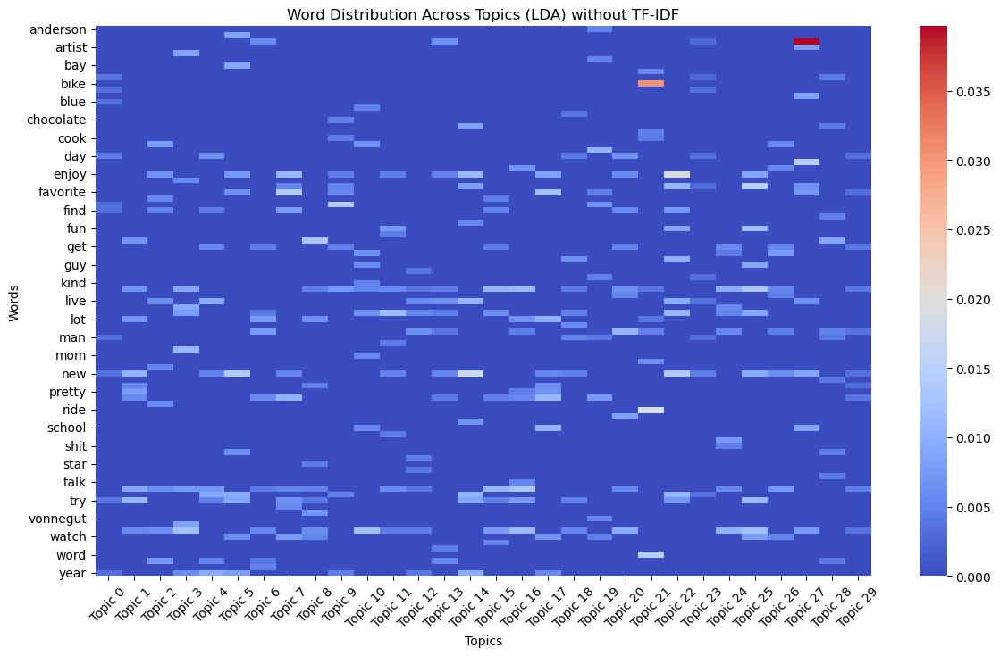

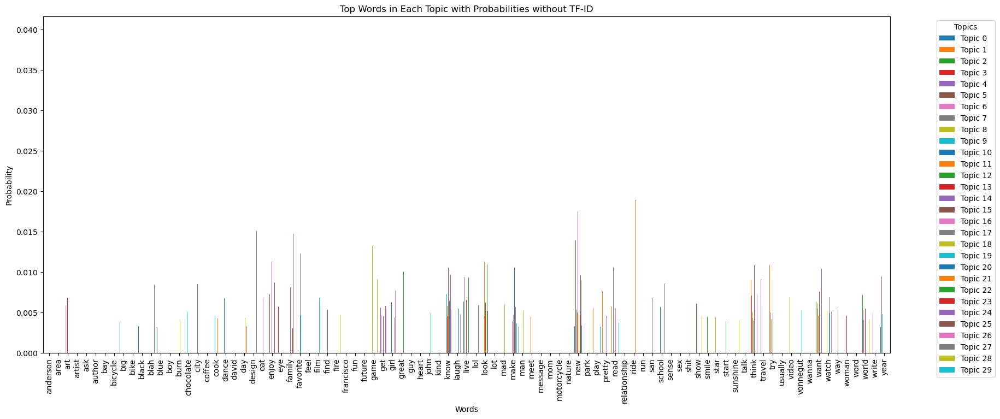

Post TF-IDF filtering:


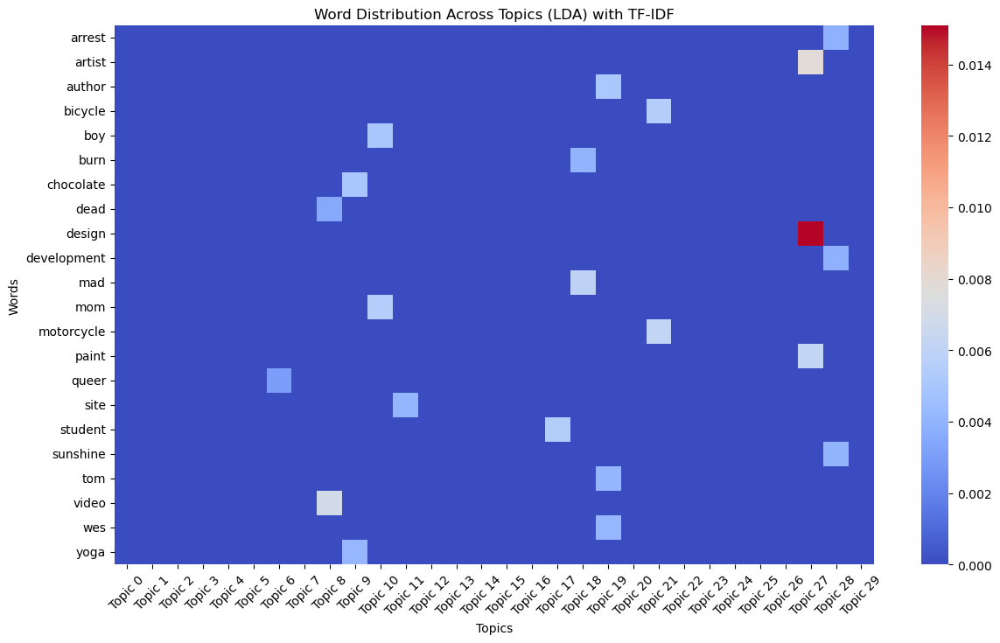

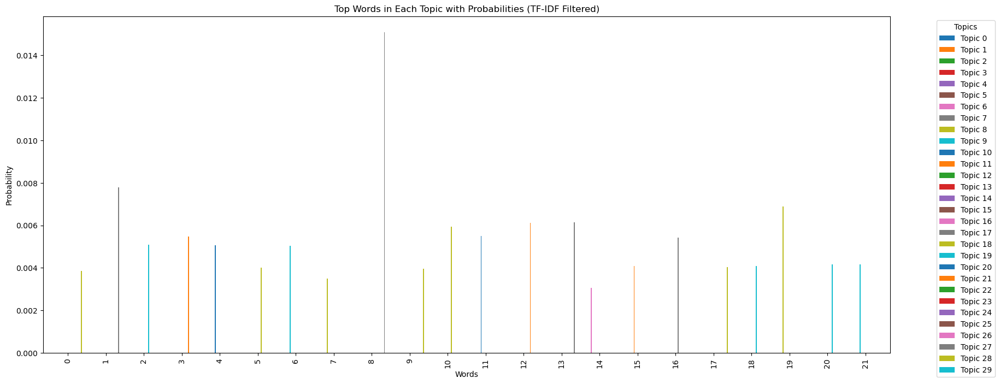

In [13]:
# Takes 5 min
### 1/ Using data prior to TF-IDF filtering
print("Pre TF-IDF filtering:")
# Visualize Word Distributions for Topics
# Define number of topics
num_topics = len(lda_model.get_topics())

# heatmap
def plot_top_words_heatmap(lda_model, num_words=10):
    """
    Creates a heatmap of word probabilities across topics.
    """
    topics_dict = {}

    # Extract words and their probabilities for each topic
    for i in range(num_topics):
        words_probs = lda_model.show_topic(i, topn=num_words)
        words, probs = zip(*words_probs)
        topics_dict[f"Topic {i}"] = pd.Series(probs, index=words)

    # Convert to DataFrame
    topics_df = pd.DataFrame(topics_dict).fillna(0)

    # Plot heatmap
    plt.figure(figsize=(14, 8))
    sns.heatmap(topics_df, cmap="coolwarm", annot=False, fmt=".3f")
    plt.title("Word Distribution Across Topics (LDA) without TF-IDF")
    plt.xlabel("Topics")
    plt.ylabel("Words")
    plt.xticks(rotation=45)
    plt.yticks(rotation=0)
    plt.show()

plot_top_words_heatmap(lda_model)

# barplot
def plot_top_words_barplot(lda_model, num_words=10):
    """
    Plots the top words per topic with probabilities.
    """
    topics_dict = {}

    # Extract words and their probabilities for each topic
    for i in range(num_topics):
        words_probs = lda_model.show_topic(i, topn=num_words)
        words, probs = zip(*words_probs)
        topics_dict[f"Topic {i}"] = pd.Series(probs, index=words)

    # Convert to DataFrame
    topics_df = pd.DataFrame(topics_dict)

    # Plot the topics
    topics_df.plot(kind="bar", figsize=(20, 8), width=0.8)
    plt.title("Top Words in Each Topic with Probabilities without TF-ID")
    plt.xlabel("Words")
    plt.ylabel("Probability")
    plt.xticks(rotation=90)
    plt.legend(title="Topics", bbox_to_anchor=(1.05, 1), loc="upper left")
    plt.show()

plot_top_words_barplot(lda_model)

# # pyLDAvis chart - NOTE: issue with topic number which doesn't match wordclouds below. TRied to fix it to no avail. Very cool visualitation otherwise
# lda_vis = gensimvis.prepare(lda_model, corpus, id2word, sort_topics=False)
# # Save visualization
# pyLDAvis.save_html(lda_vis, "lda_visualization_without_TF-IDF.html")
# print("LDA visualization saved as lda_visualization.html")

################################################################################################################################################
### 2/ Using data post TF-IDF filtering
print("Post TF-IDF filtering:")
# Get number of topics
num_topics = lda_model.num_topics  # Updated to use `num_topics` attribute

# Heatmap: Filtered Words Only
def plot_top_words_heatmap(lda_model, filtered_words_df, max_words=10):
    """
    Creates a heatmap of word probabilities across topics using only words from filtered_words_df.
    """
    topics_dict = {}

    # Ensure all topics from LDA model are included, even if they have no words
    all_topics = list(range(lda_model.num_topics))

    for topic in all_topics:
        words_probs = lda_model.show_topic(topic, topn=max_words)

        # Separate words and probabilities
        words, probs = zip(*words_probs)

        # Keep only words that exist in `filtered_words_df` for this topic
        if topic in filtered_words_df.index.get_level_values("Dominant_Topic").unique():
            topic_filtered_words = filtered_words_df.loc[topic, "Word"].values
            filtered_words_probs = [(word, prob) for word, prob in zip(words, probs) if word in topic_filtered_words]

            if filtered_words_probs:  # Ensure there are words to plot
                words, probs = zip(*filtered_words_probs)
                topics_dict[f"Topic {topic}"] = pd.Series(probs, index=words)
            else:
                topics_dict[f"Topic {topic}"] = pd.Series(dtype=float)  # Ensure topics with no words appear
        else:
            topics_dict[f"Topic {topic}"] = pd.Series(dtype=float)  # Ensure topics with no words appear

    # Convert to DataFrame
    topics_df = pd.DataFrame(topics_dict).fillna(0)

    # Plot heatmap
    plt.figure(figsize=(14, 8))
    sns.heatmap(topics_df, cmap="coolwarm", annot=False, fmt=".3f")
    plt.title("Word Distribution Across Topics (LDA) with TF-IDF")
    plt.xlabel("Topics")
    plt.ylabel("Words")
    plt.xticks(rotation=45)
    plt.yticks(rotation=0)
    plt.show()

plot_top_words_heatmap(lda_model, filtered_words_df, max_words=15)  # Increased max words


# Barplot: Filtered Words Only
def plot_top_words_barplot(lda_model, filtered_words_df, max_words=10):
    """
    Plots the top words per topic with probabilities using only words from filtered_words_df.
    """
    topics_dict = {}

    # Ensure all topics from LDA model are included
    all_topics = list(range(lda_model.num_topics))

    for topic in all_topics:
        words_probs = lda_model.show_topic(topic, topn=max_words)

        # Separate words and probabilities
        words, probs = zip(*words_probs)

        # Keep only words that exist in `filtered_words_df` for this topic
        if topic in filtered_words_df.index.get_level_values("Dominant_Topic").unique():
            topic_filtered_words = filtered_words_df.loc[topic, "Word"].values
            filtered_words_probs = [(word, prob) for word, prob in zip(words, probs) if word in topic_filtered_words]

            if filtered_words_probs:  # Ensure there are words to plot
                words, probs = zip(*filtered_words_probs)
                topics_dict[f"Topic {topic}"] = pd.Series(probs, index=words)
            else:
                topics_dict[f"Topic {topic}"] = pd.Series(dtype=float)  # Ensure topics with no words appear
        else:
            topics_dict[f"Topic {topic}"] = pd.Series(dtype=float)  # Ensure topics with no words appear

    # Convert to DataFrame
    topics_df = pd.DataFrame(topics_dict)

    # Reset index to ensure words appear on x-axis
    topics_df = topics_df.reset_index()

    # Plot the topics
    topics_df.plot(kind="bar", figsize=(20, 8), width=0.8)
    plt.title("Top Words in Each Topic with Probabilities (TF-IDF Filtered)")
    plt.xlabel("Words")
    plt.ylabel("Probability")
    plt.xticks(rotation=90)
    plt.legend(title="Topics", bbox_to_anchor=(1.05, 1), loc="upper left")
    plt.show()

plot_top_words_barplot(lda_model, filtered_words_df, max_words=15)  # Increased max words



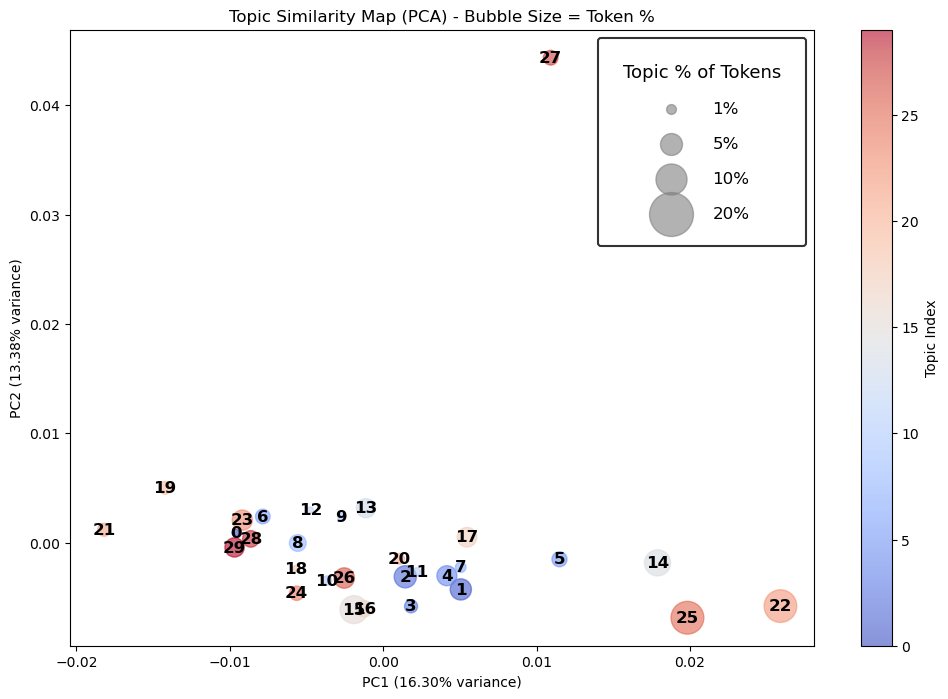

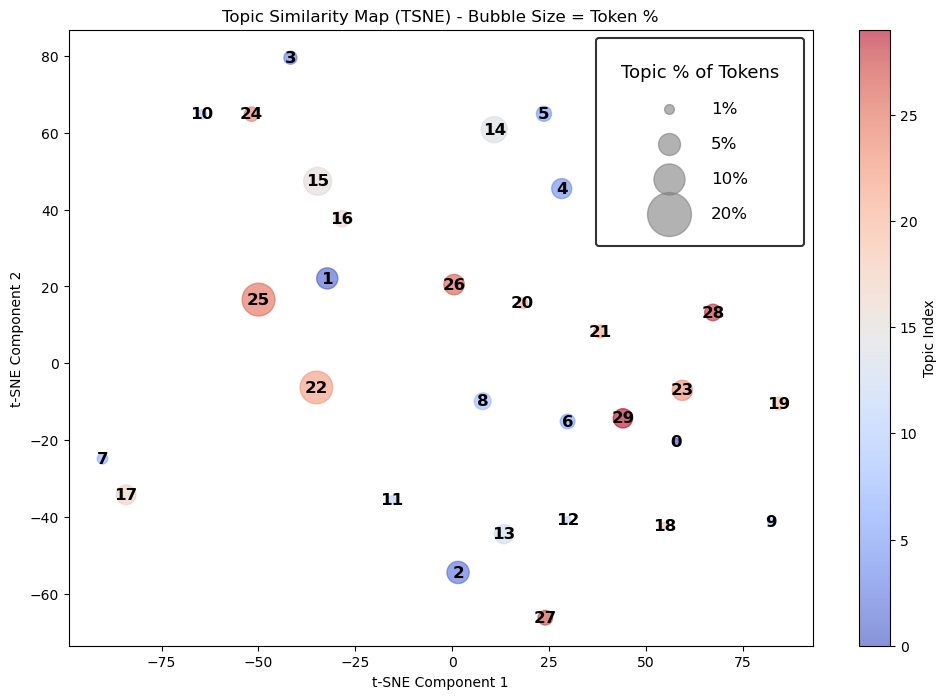

In [36]:
# visualise topic distribution
def plot_topic_scatterplot(lda_model, corpus, method='tsne'):
    """
    Creates a scatterplot of topics based on word distributions using t-SNE or PCA.
    The size of each point represents the topic prominence as a percentage of total tokens.
    """
    num_topics = lda_model.num_topics
    topic_word_matrix = lda_model.get_topics()  # Get topic-word distributions

    # Compute token percentage per topic
    topic_token_counts = np.zeros(num_topics)

    for doc in corpus:
        doc_topics = lda_model.get_document_topics(doc, minimum_probability=0)
        for topic_id, prob in doc_topics:
            topic_token_counts[topic_id] += prob  # Accumulate topic proportions

    topic_token_percentage = (topic_token_counts / topic_token_counts.sum()) * 100  # Convert to percentage

    # Reduce dimensions (t-SNE or PCA)
    if method == 'tsne':
        tsne = TSNE(n_components=2, perplexity=5, random_state=42)
        reduced = tsne.fit_transform(topic_word_matrix)
        x_label, y_label = "t-SNE Component 1", "t-SNE Component 2"

    elif method == 'pca':
        pca = PCA(n_components=2)
        reduced = pca.fit_transform(topic_word_matrix)
        explained_var = pca.explained_variance_ratio_ * 100  # Convert to percentage
        x_label = f"PC1 ({explained_var[0]:.2f}% variance)"
        y_label = f"PC2 ({explained_var[1]:.2f}% variance)"
    
    else:
        raise ValueError("Method must be 'tsne' or 'pca'.")

    # Create scatter plot
    plt.figure(figsize=(12, 8))
    scatter = plt.scatter(reduced[:, 0], reduced[:, 1], 
                          s=topic_token_percentage * 50,  # Scale bubble sizes
                          alpha=0.6, cmap="coolwarm", c=range(num_topics))

    # Annotate topics with numbers
    for i, (x, y) in enumerate(reduced):
        plt.text(x, y, str(i), fontsize=12, fontweight='bold', ha='center', va='center', color='black')

    # Add colorbar
    cbar = plt.colorbar(scatter, label="Topic Index")

    # Add bubble size legend with larger frame and better spacing
    size_legend_values = [1, 5, 10, 20]  # Example token percentage values
    size_legend = [plt.scatter([], [], s=value * 50, color='gray', alpha=0.6) for value in size_legend_values]
    
    # Create legend with larger frame and padding
    legend = plt.legend(size_legend, [f"{v}%" for v in size_legend_values], 
                        title="Topic % of Tokens", 
                        loc="upper right", 
                        frameon=True,  # Enable frame
                        fontsize=12,   # Increase font size
                        title_fontsize=13,  # Increase title font size
                        borderpad=1.5,  # Add padding inside the box
                        labelspacing=1.2,  # Increase spacing between labels
                        handletextpad=1.5)  # Increase space between marker and text
    
    # Make frame larger and more visible
    legend.get_frame().set_linewidth(1.5)  # Thicker border
    legend.get_frame().set_edgecolor("black")  # Set border color to black
    legend.get_frame().set_facecolor("white")  # Set background to white

    # Set axis labels with variance explained for PCA
    plt.xlabel(x_label)
    plt.ylabel(y_label)

    plt.title(f"Topic Similarity Map ({method.upper()}) - Bubble Size = Token %")
    plt.show()

# Plot topic scatterplot with variance explained for PCA
plot_topic_scatterplot(lda_model, corpus, method='pca')

# Run with t-SNE for better topic clustering
plot_topic_scatterplot(lda_model, corpus, method='tsne')

without TF-IDF filtering:


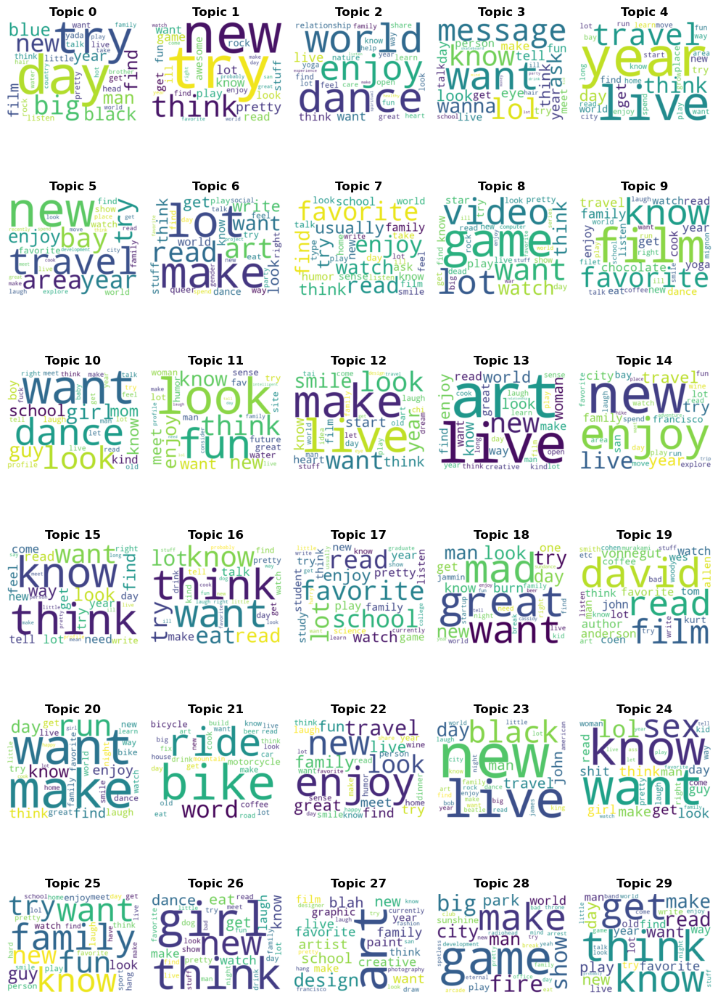

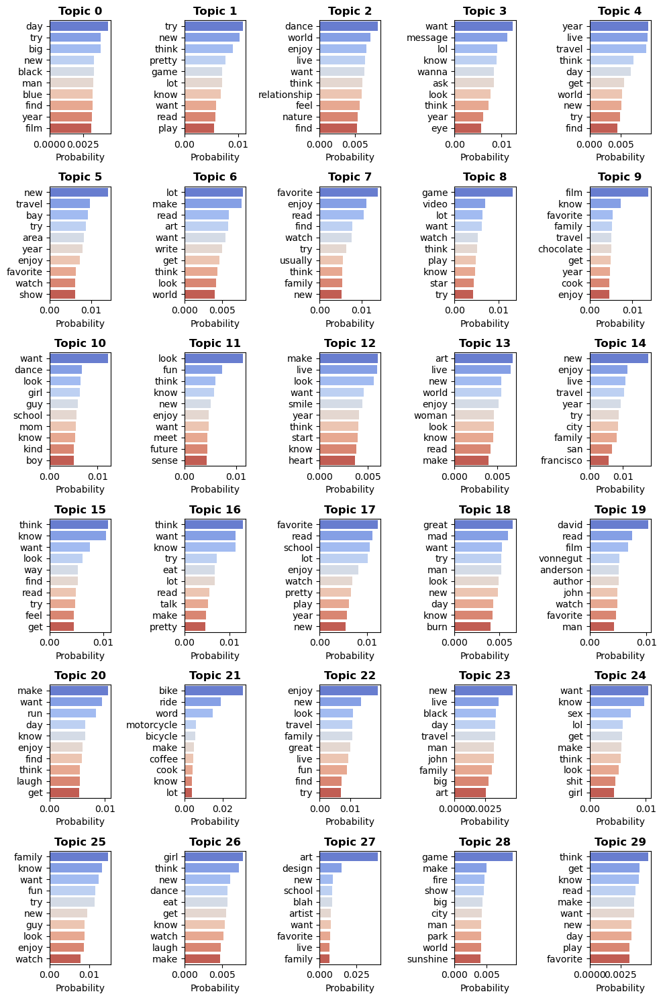

with TF-IDF filtering:


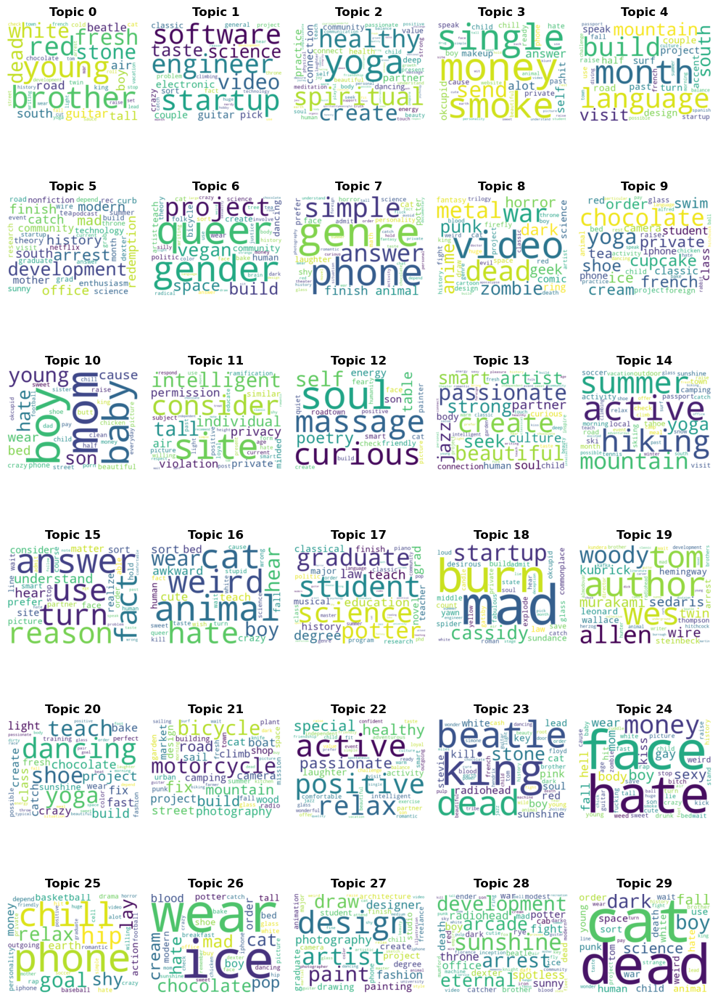

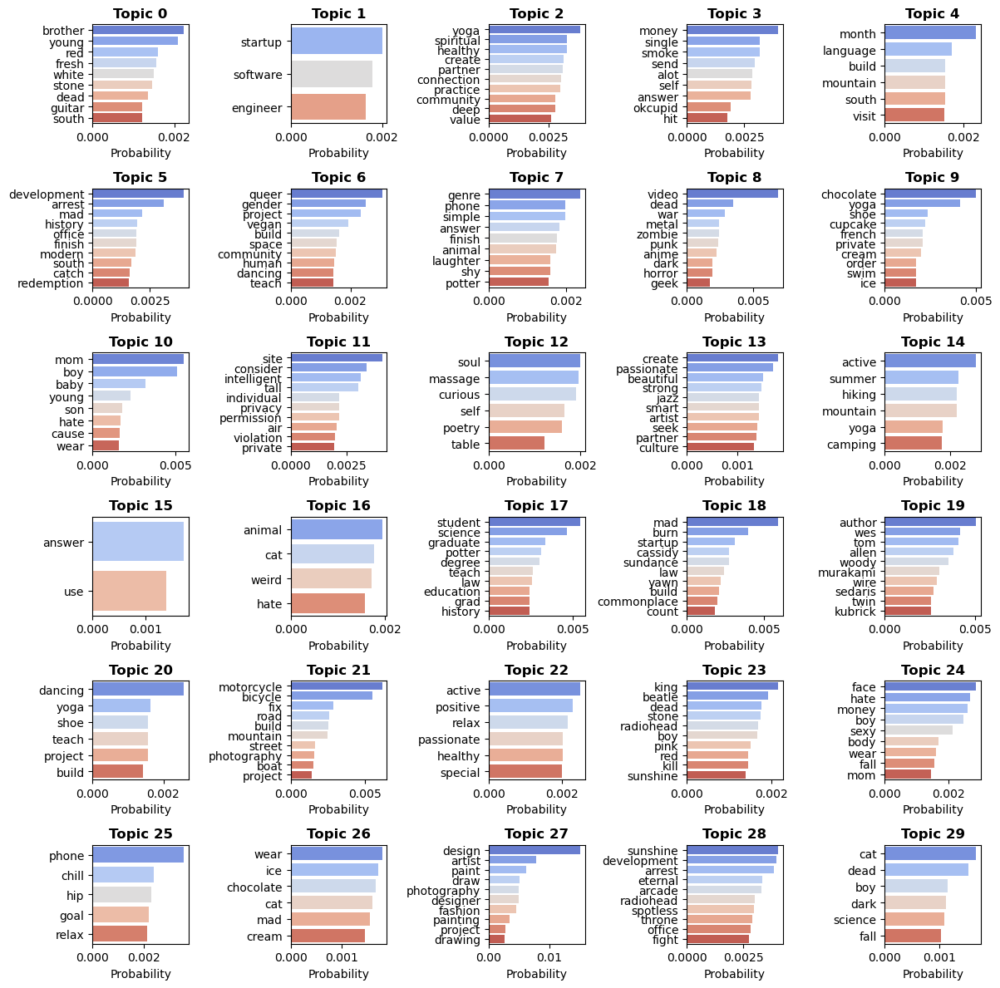

In [14]:
### without TF-IDF filtering
print("without TF-IDF filtering:")
# visualise topics as wordclouds and barcharts
def plot_all_topics_wordclouds(lda_model, num_topics=30, num_words=30):
    """Generates word clouds for all LDA topics in subplots (6 rows x 5 columns)."""
    fig, axes = plt.subplots(nrows=6, ncols=5, figsize=(10, 15))  # 6 rows × 5 columns
    axes = axes.flatten()  # Flatten for easier indexing
    
    for topic_num in range(num_topics):
        words_probs = lda_model.show_topic(topic_num, topn=num_words)
        words_dict = {word: prob for word, prob in words_probs}
        
        wordcloud = WordCloud(width=400, height=300, background_color='white').generate_from_frequencies(words_dict)
        
        ax = axes[topic_num]
        ax.imshow(wordcloud, interpolation='bilinear')
        ax.set_title(f"Topic {topic_num}", fontsize=12, fontweight="bold")
        ax.axis("off")

    plt.tight_layout()
    # Export figure
    plt.savefig('Dominant_Topic_wordclouds_without_TF-IDF.png', dpi=300, bbox_inches='tight')
    plt.show()

# Plot all 50 topics as word clouds
plot_all_topics_wordclouds(lda_model)

def plot_all_topics_barcharts(lda_model, num_topics=30, num_words=10):
    """Generates bar charts for all LDA topics in subplots (6 rows x 5 columns)."""
    fig, axes = plt.subplots(nrows=6, ncols=5, figsize=(10, 15))  # 6 rows × 5 columns
    axes = axes.flatten()  # Flatten for easier indexing
    
    for topic_num in range(num_topics):
        words_probs = lda_model.show_topic(topic_num, topn=num_words)
        words, probs = zip(*words_probs)
        
        topic_df = pd.DataFrame({'Word': words, 'Probability': probs})

        ax = axes[topic_num]
        sns.barplot(y="Word", x="Probability", hue="Word", data=topic_df, palette="coolwarm", dodge=False, legend=False, ax=ax)
        
        ax.set_title(f"Topic {topic_num}", fontsize=12, fontweight="bold")
        ax.set_xlabel("Probability")
        ax.set_ylabel("")
    
    plt.tight_layout()
    plt.show()

# Plot all 50 topics as bar charts
plot_all_topics_barcharts(lda_model)

########################################
### with TF-IDF filtering
print("with TF-IDF filtering:")
# Word Clouds: Fixed 100 Words Per Topic
def plot_all_topics_wordclouds(lda_model, filtered_words_df, num_words=100):
    """Generates word clouds for all LDA topics using exactly 100 words per topic."""

    unique_topics = filtered_words_df.index.get_level_values("Dominant_Topic").unique()
    num_topics = len(unique_topics)

    nrows, ncols = (6, 5)  # Define grid layout
    fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(10, 15))
    axes = axes.flatten()  # Flatten for easier indexing

    for i, topic in enumerate(unique_topics):
        words_probs = lda_model.show_topic(topic, topn=num_words * 2)  # Extract more words than needed

        # Extract words and probabilities
        words, probs = zip(*words_probs)

        # Keep only words that exist in `filtered_words_df`
        topic_filtered_words = filtered_words_df.loc[topic, "Word"].values
        filtered_words_probs = {word: prob for word, prob in zip(words, probs) if word in topic_filtered_words}

        # Ensure each topic has exactly 100 words
        sorted_words_probs = dict(sorted(filtered_words_probs.items(), key=lambda item: item[1], reverse=True))
        top_words_probs = dict(list(sorted_words_probs.items())[:num_words])  # Limit to 100 words

        if top_words_probs:  # Ensure at least one word
            wordcloud = WordCloud(width=400, height=300, background_color='white', max_words=num_words)\
                .generate_from_frequencies(top_words_probs)
            axes[i].imshow(wordcloud, interpolation='bilinear')
            axes[i].set_title(f"Topic {topic}", fontsize=12, fontweight="bold")
            axes[i].axis("off")
        else:
            axes[i].axis("off")  # Hide subplot if no words left

    # Hide unused subplots
    for j in range(i + 1, len(axes)):
        axes[j].axis("off")

    plt.tight_layout()
    # Export figure
    plt.savefig('Dominant_Topic_wordclouds_with_TF-IDF.png', dpi=300, bbox_inches='tight')
    plt.show()

plot_all_topics_wordclouds(lda_model, filtered_words_df, num_words=100)

def plot_all_topics_barcharts(lda_model, filtered_words_df, num_words=10):
    """Generates bar charts for all LDA topics with a fixed top `num_words` limit."""
    
    unique_topics = filtered_words_df.index.get_level_values("Dominant_Topic").unique()
    num_topics = len(unique_topics)

    # Dynamically set rows/columns for better spacing
    ncols = 5  # Fix number of columns
    nrows = math.ceil(num_topics / ncols)  # Auto-adjust rows
    fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(12, 2 * nrows))  
    axes = axes.flatten()  

    for i, topic in enumerate(unique_topics):
        words_probs = lda_model.show_topic(topic, topn=num_words * 10)  # Extract more words

        # Extract words and probabilities
        words, probs = zip(*words_probs)

        # Keep only words that exist in `filtered_words_df`
        topic_filtered_words = filtered_words_df.loc[topic, "Word"].values
        filtered_words_probs = [(word, prob) for word, prob in zip(words, probs) if word in topic_filtered_words]

        # Limit to the **top 10 words** by probability
        sorted_words_probs = sorted(filtered_words_probs, key=lambda x: x[1], reverse=True)[:num_words]

        if sorted_words_probs:  # Ensure at least one word
            words, probs = zip(*sorted_words_probs)
            topic_df = pd.DataFrame({"Word": words, "Probability": probs})

            sns.barplot(
                y="Word",
                x="Probability",
                hue="Word",
                data=topic_df,
                palette="coolwarm",
                dodge=False,
                legend=False,
                ax=axes[i]
            )

            axes[i].set_title(f"Topic {topic}", fontsize=12, fontweight="bold")
            axes[i].set_xlabel("Probability")
            axes[i].set_ylabel("")
        else:
            axes[i].axis("off")  # Hide subplot if no words left

    # Hide unused subplots
    for j in range(i + 1, len(axes)):
        axes[j].axis("off")

    plt.tight_layout()
    plt.show()

plot_all_topics_barcharts(lda_model, filtered_words_df, num_words=10)




## Assign label names to LDA Dominant_Topic

In [15]:
### without TF-IDF filtering
print("without TF-IDF filtering:")
#**Assign Topic Names Based on Prominent Words**
def suggest_topic_names(lda_model, num_topics=30, num_words=5):
    """Automatically suggests names for topics based on their top words."""
    topic_names = {}

    for topic_num in range(num_topics):
        words_probs = lda_model.show_topic(topic_num, topn=num_words)
        top_words = [word for word, prob in words_probs]  # Extract top words
        
        # Create a meaningful label (combine top words with title case)
        topic_label = " / ".join(top_words[:3]).title()
        topic_names[topic_num] = topic_label

    return topic_names

# Generate topic name suggestions
topic_suggestions = suggest_topic_names(lda_model)

# Export topic labels
topic_labels_df = pd.DataFrame(list(topic_suggestions.items()), columns=["Topic", "Label"])
topic_labels_df.to_csv("lda_topic_labels_without_TF-IDF.csv", index=False)
print("Topic labels saved as lda_topic_labels.csv")

# **Ensure Numeric Format & Find Dominant Topic**
# Exclude "profile_id" column and ensure numeric conversion
topic_columns = [col for col in doc_topics_df.columns if col.startswith("Topic ")]
doc_topics_df[topic_columns] = doc_topics_df[topic_columns].apply(pd.to_numeric, errors='coerce')

# Find the dominant topic (highest probability topic for each profile)
doc_topics_df["Dominant_Topic"] = doc_topics_df[topic_columns].idxmax(axis=1)

# Extract topic number correctly and convert it to integer
doc_topics_df["Dominant_Topic"] = (
    doc_topics_df["Dominant_Topic"]
    .str.extract(r"(\d+)")[0]  # Extract numeric part only
    .astype(float)  # Convert to float to handle NaN before int
    .fillna(-1)  # Replace NaNs with -1 (indicating no dominant topic)
    .astype(int)  # Convert to integer
)

# Map topic numbers to readable labels
doc_topics_df["Topic_Label"] = doc_topics_df["Dominant_Topic"].map(topic_suggestions)

# Verify if Dominant_Topic is correctly assigned
display(doc_topics_df[["profile_id", "Dominant_Topic", "Topic_Label"]].head())

# Save updated document-topic assignments
doc_topics_df.to_csv("lda_document_topics_labeled_without_TF-IDF.csv", index=False)
print("Document-topic assignments updated and saved!")

### **Compute Topic Prevalence (Percentage of Tokens per Topic)**
# Ensure we only sum numeric topic columns (exclude metadata)
topic_columns = [col for col in doc_topics_df.columns if col.startswith("Topic ")]
topic_probs_only = doc_topics_df[topic_columns].apply(pd.to_numeric, errors="coerce")

# Sum across all documents (total probability for each topic)
topic_prevalence = topic_probs_only.sum()

# Normalize to percentage (relative prevalence)
topic_prevalence = (topic_prevalence / topic_prevalence.sum()) * 100  # Convert to percentage

# Convert to DataFrame
topic_prevalence_df = pd.DataFrame(topic_prevalence, columns=["Topic_Prevalence"])

# xtract numeric topic number from index correctly
topic_prevalence_df = topic_prevalence_df.reset_index()
topic_prevalence_df["Dominant_Topic"] = topic_prevalence_df["index"].str.extract(r"(\d+)").astype(int)
topic_prevalence_df = topic_prevalence_df.drop(columns=["index"])  # Drop old index column

# Ensure proper topic mapping
topic_prevalence_df["Topic_Label"] = topic_prevalence_df["Dominant_Topic"].map(topic_suggestions)

# Save topic prevalence
topic_prevalence_df.to_csv("lda_topic_prevalence_without_TF-IDF.csv", index=False)
print("Topic prevalence saved as 'lda_topic_prevalence.csv'")

### **Merge Only Required LDA Features into Profiles**
# Merge ['Dominant_Topic', 'Topic_Label'] into profiles using 'profile_id'
doc_topics_df["profile_id"] = doc_topics_df["profile_id"].astype(str)
#profiles["profile_id"] = profiles["profile_id"].astype(str)

profiles = profiles.merge(
    doc_topics_df[["profile_id", "Dominant_Topic", "Topic_Label"]],
    on="profile_id", how="left"
)

# Ensure both 'Dominant_Topic' columns are integers before merging
profiles["Dominant_Topic"] = profiles["Dominant_Topic"].fillna(-1).astype(int)  # Convert float64 -> int
topic_prevalence_df["Dominant_Topic"] = topic_prevalence_df["Dominant_Topic"].astype(int)  # Ensure int type

# Now merge ['Topic_Prevalence'] using 'Dominant_Topic' (Matching Format!)
profiles = profiles.merge(
    topic_prevalence_df[["Dominant_Topic", "Topic_Prevalence"]],
    on="Dominant_Topic", how="left"
)

# Save updated profiles with ML-ready features
profiles.to_csv("profiles_ML_without_TF-IDF.csv", index=False)
print("Updated profiles saved as 'profiles_ML_without_TF' with Dominant Topic, Label & Prevalence")

####################################################################################################
### with TF-IDF filtering
print("with TF-IDF filtering:")
print("Assigning Topic Names with TF-IDF Filtering")

# **Assign Topic Names Based on Filtered Words**
def suggest_filtered_topic_names(lda_model, filtered_words_df, num_words=5):
    """Automatically suggests names for topics using TF-IDF filtered words."""
    topic_names = {}

    # Get unique topics from filtered dataset
    unique_topics = filtered_words_df.index.get_level_values("Dominant_Topic").unique()

    for topic in unique_topics:
        words_probs = lda_model.show_topic(topic, topn=num_words * 100)  # Extract more words

        # Keep only words present in `filtered_words_df` for this topic
        topic_filtered_words = filtered_words_df.loc[topic, "Word"].values
        filtered_words_probs = [word for word, _ in words_probs if word in topic_filtered_words]

        # Limit to `num_words` (Top 3 words for readability)
        topic_label = " / ".join(filtered_words_probs[:3]).title() if filtered_words_probs else f"Topic {topic}"
        topic_names[topic] = topic_label

    return topic_names

# Generate filtered topic name suggestions
topic_suggestions = suggest_filtered_topic_names(lda_model, filtered_words_df)

# Export updated topic labels
topic_labels_df = pd.DataFrame(list(topic_suggestions.items()), columns=["Dominant_Topic", "Topic_Label"])
topic_labels_df.to_csv("lda_topic_labels_with_TF-IDF.csv", index=False)
print("Topic labels (filtered) saved as 'lda_topic_labels_filtered.csv'")

# **Ensure Numeric Format & Find Dominant Topic**
# Exclude "profile_id" column and ensure numeric conversion
topic_columns = [col for col in doc_topics_df.columns if col.startswith("Topic ")]
doc_topics_df[topic_columns] = doc_topics_df[topic_columns].apply(pd.to_numeric, errors='coerce')

# Find the dominant topic (highest probability topic for each profile)
doc_topics_df["Dominant_Topic"] = doc_topics_df[topic_columns].idxmax(axis=1)

# Extract topic number correctly and convert it to integer
doc_topics_df["Dominant_Topic"] = (
    doc_topics_df["Dominant_Topic"]
    .str.extract(r"(\d+)")[0]  # Extract numeric part only
    .astype(float)  # Convert to float to handle NaN before int
    .fillna(-1)  # Replace NaNs with -1 (indicating no dominant topic)
    .astype(int)  # Convert to integer
)

# Map topic numbers to filtered readable labels
doc_topics_df["Topic_Label"] = doc_topics_df["Dominant_Topic"].map(topic_suggestions)

# Verify Topic Assignment
display(doc_topics_df[["profile_id", "Dominant_Topic", "Topic_Label"]].head())

# Save updated document-topic assignments
doc_topics_df.to_csv("lda_document_topics_with_TF-IDF.csv", index=False)
print("Document-topic assignments (filtered) updated and saved!")

# **Compute Topic Prevalence (Percentage of Tokens per Topic)**
# Ensure we only sum numeric topic columns (exclude metadata)
topic_columns = [col for col in doc_topics_df.columns if col.startswith("Topic ")]
topic_probs_only = doc_topics_df[topic_columns].apply(pd.to_numeric, errors="coerce")

# Sum across all documents (total probability for each topic)
topic_prevalence = topic_probs_only.sum()

# Normalize to percentage (relative prevalence)
topic_prevalence = (topic_prevalence / topic_prevalence.sum()) * 100  # Convert to percentage

# Convert to DataFrame
topic_prevalence_df = pd.DataFrame(topic_prevalence, columns=["Topic_Prevalence"])

# Extract numeric topic number from index correctly
topic_prevalence_df = topic_prevalence_df.reset_index()
topic_prevalence_df["Dominant_Topic"] = topic_prevalence_df["index"].str.extract(r"(\d+)").astype(int)
topic_prevalence_df = topic_prevalence_df.drop(columns=["index"])  # Drop old index column

# Ensure proper topic mapping
topic_prevalence_df["Topic_Label"] = topic_prevalence_df["Dominant_Topic"].map(topic_suggestions)

# Save topic prevalence
topic_prevalence_df.to_csv("lda_topic_prevalence_with_TF-IDF.csv", index=False)
print("Topic prevalence (filtered) saved as 'lda_topic_prevalence_filtered.csv'")

# **Merge Only Required LDA Features into Profiles**
# Merge ['Dominant_Topic', 'Topic_Label'] into profiles using 'profile_id'
doc_topics_df["profile_id"] = doc_topics_df["profile_id"].astype(str)

profiles = profiles.merge(
    doc_topics_df[["profile_id", "Dominant_Topic", "Topic_Label"]],
    on="profile_id", how="left"
)

# Ensure `Dominant_Topic` is integer before merging
profiles["Dominant_Topic"] = profiles["Dominant_Topic"].fillna(-1).astype(int)
topic_prevalence_df["Dominant_Topic"] = topic_prevalence_df["Dominant_Topic"].astype(int)

# Merge ['Topic_Prevalence'] using 'Dominant_Topic'
profiles = profiles.merge(
    topic_prevalence_df[["Dominant_Topic", "Topic_Prevalence"]],
    on="Dominant_Topic", how="left"
)

# Save updated profiles with ML-ready features
profiles.to_csv("profiles_ML_with_TF-IDF.csv", index=False)
print("Updated profiles saved as 'profiles_ML_with_TF-IDF.csv' with Dominant Topic, Label & Prevalence")


with TF-IDF filtering:
✅ Assigning Topic Names with TF-IDF Filtering
✅ Topic labels (filtered) saved as 'lda_topic_labels_filtered.csv'


,profile_id,Dominant_Topic,Topic_Label
0,1,15,Answer / Use / Turn
1,2,22,Active / Positive / Relax
2,3,6,Queer / Gender / Project
3,4,19,Author / Wes / Tom
4,5,15,Answer / Use / Turn


✅ Document-topic assignments (filtered) updated and saved!
✅ Topic prevalence (filtered) saved as 'lda_topic_prevalence_filtered.csv'
✅ Updated profiles saved as 'profiles_ML_with_TF-IDF.csv' with Dominant Topic, Label & Prevalence


# Machine Learning model to associated individuals based on their features - Unsupervised learning
Goal: find individuals with similar tastes rather than to predict a specific outcome, as there is no target variable (y) for a supervised predictive task; it's an unsupervised learning problem.
__Steps:__
- Detect outliers to eliminate them.
- Use DBSCAN to cluster individuals into similar groups.
- Within each cluster, apply Cosine Similarity to find best matches.
- Evaluate similarity metrics (Euclidean vs. Cosine) to optimize pairing quality.

No y Variable Needed:  
For unsupervised approaches, you work solely with your feature set (x). You can use your Random Forest to generate a proximity matrix by analyzing how often pairs of samples land in the same leaf node across trees. This matrix can then serve as the basis for similarity-based tasks like nearest neighbors or clustering.  

Train-Test Split Relevance:  
The concept of splitting data into training and testing sets is mainly relevant for supervised learning, where you have a target variable and need to evaluate the model’s predictive performance. In your case, since there's no target (y), you wouldn't typically perform this split.  

In [3]:
# Laod data file with clean features to avoid rerunning tall the previous steps
profiles_ML = pd.read_csv('profiles_ML.csv', encoding='utf-8', dtype={"profile_id": str}, index_col="profile_id", low_memory=False)

# Define columns to drop as they are irrelevant for the ML model
columns_to_drop = [
    "Unnamed: 0", 'speaks_fluently', 'speaks_okay', 'speaks_poorly', 'speaks_fine',
    'speaks_counter', 'essay_combined', 'word_count_combined', 'word_count_clean', 'percent_words_removed',
]
# Drop the specified columns
profiles_ML = profiles_ML.drop(columns=columns_to_drop)

# Display the updated dataframe structure
display("profiles_ML df:", profiles_ML.head(2))
# display(profiles_ML.columns)
# display(profiles_ML.info())

# Count missing values
display("Total missing values:", profiles_ML.isna().value_counts().sum())
#display("Missing value counts per variable:", profiles_ML.isna().sum().sort_values(ascending=False))
display("Missing value percentage per variable:")
display(round((profiles_ML.isna().sum() / profiles_ML.shape[0] * 100),1).sort_values(ascending=False))

'profiles_ML df:'

,body_type,diet,drinks,drugs,education,ethnicity,height,income,job,offspring,orientation,pets,religion,sex,sign,smokes,speaks,status,age_filtered,height_filtered,income_filtered,age_clean,height_clean,income_clean,location_town,location_state,location_country,body_type_level,diet_code,diet_level,drinks_level,drugs_level,education_level,education_type,education_code,ethnicity_clean,ethnicity_code,job_code,location_town_code,offspring_has,offspring_wants,orientation_code,pets_dog,pets_cat,religion_code,religion_level,sex_code,sign_code,sign_level,smokes_code,speaks_program,status_code,speaks_counter_clean,essay_clean,Dominant_Topic,Topic_Label,Topic_Prevalence
profile_id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1,a little extra,strictly anything,socially,never,working on college/university,"asian, white",75.0,-1,transportation,"doesn’t have kids, but might want them",straight,likes dogs and likes cats,agnosticism and very serious about it,m,gemini,sometimes,english,single,22.0,75.0,NaN,3.091042,75.0,NaN,south san francisco,california,US,1.0,1.0,3.0,2.0,0.0,1.0,college/university,0,"asian, white",1,12.0,174,0.0,1.0,0,1.0,1.0,0.0,4.0,0,5.0,0.0,2.0,0,3,11.007933,love think kind intellectual dumb smart guy sm...,15,Think / Know / Want,8.128912
2,average,mostly other,often,sometimes,working on space camp,white,70.0,80000,hospitality / travel,"doesn’t have kids, but might want them",straight,likes dogs and likes cats,agnosticism but not too serious about it,m,cancer,no,"english (fluently), spanish (poorly), french (...",single,35.0,70.0,80000.0,3.555348,70.0,43.088694,oakland,california,US,0.0,2.0,2.0,3.0,1.0,1.0,space camp,6,white,8,4.0,117,0.0,1.0,0,1.0,1.0,0.0,2.0,0,3.0,0.0,0.0,0,3,11.344720,chef mean workaholic love cook regardless work...,22,Enjoy / New / Look,11.156420


'Total missing values:'

59896

'Missing value percentage per variable:'

offspring_wants         84.5
income_clean            81.7
income_filtered         81.7
offspring_has           64.9
offspring               59.3
pets_cat                52.2
diet_code               40.7
diet_level              40.7
diet                    40.7
pets_dog                37.5
religion                33.8
religion_code           33.8
religion_level          33.8
pets                    33.2
drugs                   23.5
drugs_level             23.5
sign                    18.4
sign_code               18.4
sign_level              18.4
job_code                13.7
job                     13.7
education_type          11.0
education_level         11.0
education               11.0
ethnicity                9.5
ethnicity_clean          9.5
smokes_code              9.2
smokes                   9.2
body_type_level          9.2
body_type                8.8
drinks_level             5.0
drinks                   5.0
essay_clean              3.6
sex                      0.0
Topic_Label   

In [4]:
# filter rows with too many missing values particularly for relevant features
# Define feature weights
feature_weights = {
    "orientation_code": 3.0, "location_town_code": 3.0, "Dominant_Topic": 3.0, "status_code": 3.0,
    "smokes_code": 2.0, "drinks_level": 2.0, "drugs_level": 2.0,
    "diet_code": 2.0, "pets_cat": 2.0, "pets_dog": 2.0,
    "sign_level": 2.0, "religion_level": 2.0, "religion_code": 2.0
}

# Compute completeness score per row and add it as a new column
profiles_ML["completeness_score"] = profiles_ML[feature_weights.keys()].notna().mul(feature_weights).sum(axis=1)
display(profiles_ML["completeness_score"].describe())

# Define threshold (90% of max possible score)
threshold = 0.9 * sum(feature_weights.values())

# Filter rows where completeness score is at least the threshold
profiles_ML_90_percent = profiles_ML[profiles_ML["completeness_score"] >= threshold]

# Show dataset shape before and after filtering
print(f"Original shape: {profiles_ML.shape}")
print(f"Filtered shape: {profiles_ML_90_percent.shape}")

# # Count missing values
# display("Total missing values for profiles_ML_90_percent df:", profiles_ML_90_percent.isna().value_counts().sum())
# #display("Missing value counts per variable:", profiles_ML_70_percent.isna().sum().sort_values(ascending=False))
# display("Missing value percentage per variable for profiles_ML_90_percent df:")
# display(round((profiles_ML_90_percent.isna().sum() / profiles_ML_90_percent.shape[0] * 100),1).sort_values(ascending=False))

count    59896.000000
mean        24.919894
std          3.957567
min         12.000000
25%         22.000000
50%         26.000000
75%         28.000000
max         30.000000
Name: completeness_score, dtype: float64

Original shape: (59896, 58)
Filtered shape: (21442, 58)


'Histograms for profiles_ML:'

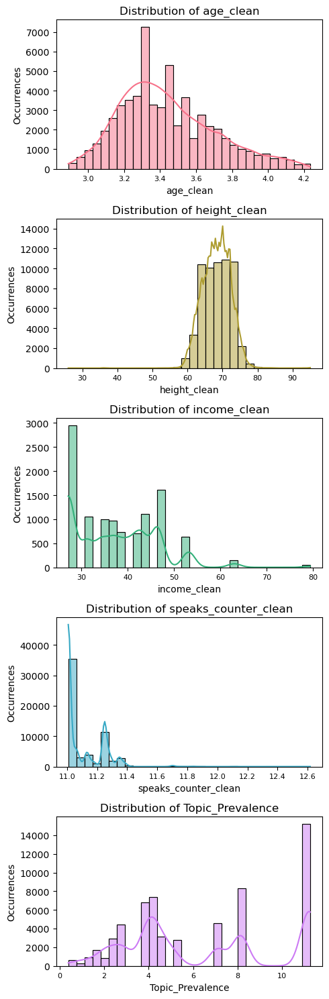

'Histograms for profiles_ML_90_percent:'

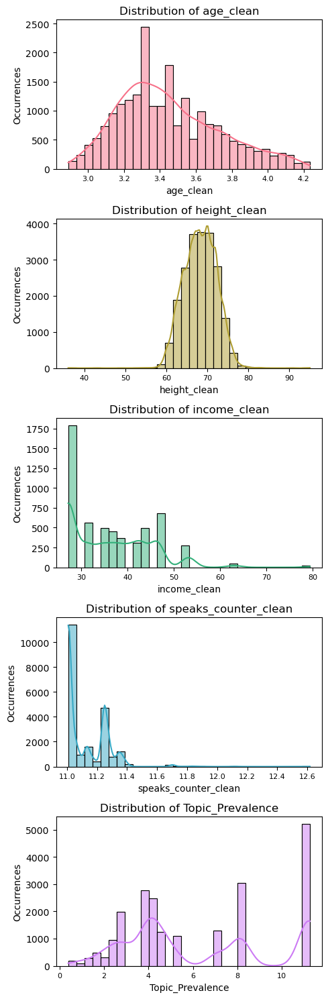

In [20]:
# Histograms of individual variables with dynamic figure size based on unique categories
def hist_ML_variable(df, bins=30, figsize=(5, 3), xtick_fontsize=8):
    num_features = df.select_dtypes(include=["number"]).columns
    colors = sns.color_palette("husl", len(num_features))  # Assign distinct colors

    # Set up subplots dynamically
    fig, axes = plt.subplots(nrows=len(num_features), ncols=1, figsize=(figsize[0], figsize[1] * len(num_features)))

    if len(num_features) == 1:
        axes = [axes]  # Ensure axes is iterable when there's only one feature

    # Plot histograms
    for i, column in enumerate(num_features):
        sns.histplot(df[column], bins=bins, kde=True, color=colors[i], ax=axes[i])
        axes[i].set_title(f"Distribution of {column}")
        axes[i].set_xlabel(column)
        axes[i].set_ylabel("Occurrences")
        axes[i].tick_params(axis="x", labelsize=xtick_fontsize)
    
    plt.tight_layout()
    plt.show()

# Run the improved histogram function on selected features
display("Histograms for profiles_ML:")
hist_ML_variable(profiles_ML[['age_clean', 'height_clean', 'income_clean', 'speaks_counter_clean', 'Topic_Prevalence']])
display("Histograms for profiles_ML_90_percent:")
hist_ML_variable(profiles_ML_90_percent[['age_clean', 'height_clean', 'income_clean', 'speaks_counter_clean', 'Topic_Prevalence']])

Retaining individuals that achieved > 90% completeness score eliminated 59896-21442=38454 rows. Remaining rows have little missing values which will increase computational speed and model accuracy.  
Use profiles_ML_90_percent df for classification and clustering ML model below.


In [22]:
display(59896-21442) # 38454
display("Status labels:")
display(profiles_ML_90_percent[['status', 'status_code']].drop_duplicates())
display("Orientation labels:")
display(profiles_ML_90_percent[['orientation', 'orientation_code']].drop_duplicates())
display("Sex labels:")
display(profiles_ML_90_percent[['sex', 'sex_code']].drop_duplicates())

38454

'Status labels:'

,status,status_code
profile_id,,
1,single,3
12,seeing someone,2
299,available,4
700,married,1
17338,unknown,0


'Orientation labels:'

,orientation,orientation_code
profile_id,,
1,straight,0
45,bisexual,2
70,gay,1


'Sex labels:'

,sex,sex_code
profile_id,,
1,m,0
8,f,1


# Unsupervised ML model - IsolationForest classification to detect outliers followed by HDBSCAN clustering to decomplexify data
__Goal:__ Explore the sturcture of the data using unsupervised method.  
Using HDBSCAN after IsolationForest achieves the following: 
- IsolationForest:
  -  Detects extreme outliers (= anomalies)
  -  converts an unsupervised anomaly detection problem into a supervised classification problem by assigning labels (0 = normal, 1 = outlier)
- HDBSCAN clustering:
  - Discover natural groupings in the dataset.
  - Identify clusters of similar users based on their encoded features.

HDBSCAN (Hierarchical Density-Based Spatial Clustering of Applications with Noise) is an unsupervised clustering algorithm, meaning:
- It groups similar data points together based on density.
- It identifies noise (outliers) as separate from clusters, which complements IsolationForest.
- It does not require specifying the number of clusters (unlike k-means).
- It works well on high-dimensional and noisy data.

## optimise RF params

In [33]:
# optimising RF params using  Parameter Grid (takes 3 min)
# Define Encoded Variables for classification and their importance**
encoded_var = [
    'age_clean', 'height_clean', 'income_clean', 'body_type_level', 'diet_code',
    'diet_level', 'drinks_level', 'drugs_level', 'education_level', 'education_code',
    'ethnicity_code', 'job_code', 'location_town_code', 'offspring_has', 'offspring_wants',
    'orientation_code', 'pets_dog', 'pets_cat', 'religion_code', 'religion_level',
    'sign_code', 'sign_level', 'smokes_code', 'speaks_program', 'status_code',
    'speaks_counter_clean', 'Dominant_Topic'
]

# Define feature weights
feature_weights = {
    "orientation_code": 3.0, "location_town_code": 3.0, "Dominant_Topic": 3.0, "status_code": 3.0,
    "smokes_code": 2.0, "drinks_level": 2.0, "drugs_level": 2.0,
    "diet_code": 2.0, "pets_cat": 2.0, "pets_dog": 2.0,
    "sign_level": 2.0, "religion_level": 2.0, "religion_code": 2.0
}

# Filter Data keep only completness score > 90%
profiles_filtered = profiles_ML_90_percent.copy()
X = profiles_filtered[encoded_var]

# Handle Missing Values
income_median_per_job = profiles_filtered.groupby("job_code")["income_clean"].median()

def impute_income(row):
    if pd.isna(row["income_clean"]):
        return income_median_per_job.get(row["job_code"], row["income_clean"])
    return row["income_clean"]

profiles_filtered["income_clean"] = profiles_filtered.apply(impute_income, axis=1)

imputer = SimpleImputer(strategy="median")
X_imputed = imputer.fit_transform(profiles_filtered[encoded_var])
X = pd.DataFrame(X_imputed, columns=encoded_var, index=profiles_filtered.index)

# Apply Feature Weights
for feature, weight in feature_weights.items():
    if feature in X.columns:
        X[feature] *= weight


# Define parameter grid
print("Testing RF parameters...")
param_grid = {
    "n_estimators": [50, 100, 200, 400],
    "contamination": [0.01, 0.05, 0.1, 0.2],
    "random_state": [42, 2023, None]
}

# Track best model
best_model = None
best_iso_score = np.inf  # Lower is better for anomaly detection

# Iterate through parameter combinations
for params in ParameterGrid(param_grid):
    iso_forest = IsolationForest(**params, n_jobs=-1)
    iso_scores = iso_forest.fit_predict(X)
    
    # Use the mean anomaly score (lower = better outlier detection)
    anomaly_score = np.mean(iso_scores)
    
    if anomaly_score < best_iso_score:
        best_iso_score = anomaly_score
        best_model = iso_forest

# Assign best model scores to dataset
profiles_filtered["iso_score"] = best_model.fit_predict(X)

# Print best parameters
display("Best Parameters:", best_model.get_params())

# Compute silhouette score (higher = better clustering)
silhouette = silhouette_score(X, profiles_filtered["iso_score"])
print(f"Silhouette Score: {silhouette:.4f}") # 0.1104

# Define features (exclude iso_score itself to avoid leakage)
X = profiles_filtered[encoded_var]  # Replace with your actual feature list
y = (profiles_filtered["iso_score"] == -1).astype(int)  # Convert to binary (1 = outlier, 0 = normal)

# Train-Test Split (80% train, 20% test)
print("Evaluating RF model...")
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

# Train a Random Forest model to predict outliers
clf = RandomForestClassifier(n_estimators=100, random_state=42)
clf.fit(X_train, y_train)

# Predict on the test set
y_pred = clf.predict(X_test)

# Compute performance metrics
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)

# Print results
print(f"Accuracy: {accuracy:.3f}")
print(f"Precision: {precision:.3f}")
print(f"Recall: {recall:.3f}")
print(f"F1 Score: {f1:.3f}")

'Best Parameters:'

{'bootstrap': False,
 'contamination': 0.2,
 'max_features': 1.0,
 'max_samples': 'auto',
 'n_estimators': 50,
 'n_jobs': -1,
 'random_state': 42,
 'verbose': 0,
 'warm_start': False}

Silhouette Score: 0.1104
Accuracy: 0.9063
Precision: 0.8654
Recall: 0.6294
F1 Score: 0.7287


Optimum IsolationForest parameters are: 
- n_estimators=50,          # Optimal number of estimators
- contamination=0.2,        # Best contamination level found
- max_features=1.0,         # Using all features
- max_samples="auto",       # Automatically determines sample size
- bootstrap=False,          # No bootstrap sampling
- random_state=42,          # Ensures reproducibility
- n_jobs=-1,                # Uses all available CPU cores
- verbose=0,                # Keeps output silent
- warm_start=False          # No incremental learning  
Those paramters give a 73% f1 score.

## optimise HDBSCAN params

In [10]:
# optimising HDBSCAN using  Parameter Grid (takes 20 min)
# Define Encoded Variables for Clustering and their importance**
encoded_var = [
    'age_clean', 'height_clean', 'income_clean', 'body_type_level', 'diet_code',
    'diet_level', 'drinks_level', 'drugs_level', 'education_level', 'education_code',
    'ethnicity_code', 'job_code', 'location_town_code', 'offspring_has', 'offspring_wants',
    'orientation_code', 'pets_dog', 'pets_cat', 'religion_code', 'religion_level',
    'sign_code', 'sign_level', 'smokes_code', 'speaks_program', 'status_code',
    'speaks_counter_clean', 'Dominant_Topic'
]

# Define feature weights
feature_weights = {
    "orientation_code": 3.0, "location_town_code": 3.0, "Dominant_Topic": 3.0, "status_code": 3.0,
    "smokes_code": 2.0, "drinks_level": 2.0, "drugs_level": 2.0,
    "diet_code": 2.0, "pets_cat": 2.0, "pets_dog": 2.0,
    "sign_level": 2.0, "religion_level": 2.0, "religion_code": 2.0
}

# Filter Data keep only completness score > 90%
profiles_filtered = profiles_ML_90_percent.copy()
X = profiles_filtered[encoded_var]

# Handle Missing Values
income_median_per_job = profiles_filtered.groupby("job_code")["income_clean"].median()

def impute_income(row):
    if pd.isna(row["income_clean"]):
        return income_median_per_job.get(row["job_code"], row["income_clean"])
    return row["income_clean"]

profiles_filtered["income_clean"] = profiles_filtered.apply(impute_income, axis=1)

imputer = SimpleImputer(strategy="median")
X_imputed = imputer.fit_transform(profiles_filtered[encoded_var])
X = pd.DataFrame(X_imputed, columns=encoded_var, index=profiles_filtered.index)

# Apply Feature Weights
for feature, weight in feature_weights.items():
    if feature in X.columns:
        X[feature] *= weight

# Train Isolation Forest for Outlier Detection with optimum parameters
print("Generating embeddings using Isolation Forest...")
iso_forest = IsolationForest(
    n_estimators=50,          # Optimal number of estimators
    contamination=0.2,        # Best contamination level found
    max_features=1.0,         # Using all features
    max_samples="auto",       # Automatically determines sample size
    bootstrap=False,          # No bootstrap sampling
    random_state=42,          # Ensures reproducibility
    n_jobs=-1,                # Uses all available CPU cores
    verbose=0,                # Keeps output silent
    warm_start=False          # No incremental learning
)
profiles_filtered["iso_score"] = iso_forest.fit_predict(X)

# filter out extreme outliers
profiles_filtered = profiles_filtered[profiles_filtered["iso_score"] > 0]  # Keep only likely "normal" profiles

# Define HDBSCAN Parameter Grid
print("Testing HDBSCAN parameters...")
# param_grid = {
#     "min_cluster_size": range(50, 301, 6),
#     "min_samples": range(5, 21, 4),
#     "cluster_selection_epsilon": [0.0, 0.5, 1.0],
#     "alpha": [0.5, 1.0, 1.5],
#     "cluster_selection_method": ["eom", "leaf"],
#     "metric": ["euclidean", "manhattan"], 
#     "prediction_data": [False, True]
# }
# less params
param_grid = {
    "min_cluster_size": range(100, 1001, 9),
    "min_samples": range(10, 21, 6),
    "cluster_selection_method": ["eom"],
    "metric": ["euclidean"]
}

# Optimize HDBSCAN Clustering
best_model = None
best_silhouette_score = -1

for params in ParameterGrid(param_grid):
    clusterer = hdbscan.HDBSCAN(**params)
    labels = clusterer.fit_predict(X)

    if len(set(labels)) > 1:
        score = silhouette_score(X, labels)
        if score > best_silhouette_score:
            best_silhouette_score = score
            best_model = clusterer

# Apply Best HDBSCAN Model
X = X.loc[profiles_filtered.index]
profiles_filtered["hdbscan_clusters"] = best_model.fit_predict(X)

# Print Best Parameters
print("Best Parameters:", best_model.get_params())

# Evaluate Clustering Performance
silhouette = silhouette_score(X, profiles_filtered["hdbscan_clusters"])
davies_bouldin = davies_bouldin_score(X, profiles_filtered["hdbscan_clusters"])
calinski_harabasz = calinski_harabasz_score(X, profiles_filtered["hdbscan_clusters"])

print("\nModel Evaluation Metrics (HDBSCAN Stability)")
print(f"Silhouette Score: {silhouette:.4f} (Higher is better)")
print(f"Davies-Bouldin Index: {davies_bouldin:.4f} (Lower is better)")
print(f"Calinski-Harabasz Index: {calinski_harabasz:.4f} (Higher is better)")


Generating embeddings using Isolation Forest...
Testing HDBSCAN parameters...
Best Parameters: {'algorithm': 'best', 'allow_single_cluster': False, 'alpha': 1.0, 'approx_min_span_tree': True, 'branch_detection_data': False, 'cluster_selection_epsilon': 0.0, 'cluster_selection_epsilon_max': inf, 'cluster_selection_method': 'eom', 'core_dist_n_jobs': 4, 'gen_min_span_tree': False, 'leaf_size': 40, 'match_reference_implementation': False, 'max_cluster_size': 0, 'memory': Memory(location=None), 'metric': 'euclidean', 'min_cluster_size': 451, 'min_samples': 10, 'p': None, 'prediction_data': False}

🔹 Model Evaluation Metrics (HDBSCAN Stability) 🔹
Silhouette Score: 0.5415 (Higher is better)
Davies-Bouldin Index: 1.9500 (Lower is better)
Calinski-Harabasz Index: 42133.1028 (Higher is better)


In [18]:
# optimising HDBSCAN using  Parameter Grid (takes 20 min)
# Define Encoded Variables for Clustering and their importance**
encoded_var = [
    'age_clean', 'height_clean', 'income_clean', 'body_type_level', 'diet_code',
    'diet_level', 'drinks_level', 'drugs_level', 'education_level', 'education_code',
    'ethnicity_code', 'job_code', 'location_town_code', 'offspring_has', 'offspring_wants',
    'orientation_code', 'pets_dog', 'pets_cat', 'religion_code', 'religion_level',
    'sign_code', 'sign_level', 'smokes_code', 'speaks_program', 'status_code',
    'speaks_counter_clean', 'Dominant_Topic'
]

# Define feature weights
feature_weights = {
    "orientation_code": 3.0, "location_town_code": 3.0, "Dominant_Topic": 3.0, "status_code": 3.0,
    "smokes_code": 2.0, "drinks_level": 2.0, "drugs_level": 2.0,
    "diet_code": 2.0, "pets_cat": 2.0, "pets_dog": 2.0,
    "sign_level": 2.0, "religion_level": 2.0, "religion_code": 2.0
}

# Filter Data keep only completness score > 90%
profiles_filtered = profiles_ML_90_percent.copy()
X = profiles_filtered[encoded_var]

# Handle Missing Values
income_median_per_job = profiles_filtered.groupby("job_code")["income_clean"].median()

def impute_income(row):
    if pd.isna(row["income_clean"]):
        return income_median_per_job.get(row["job_code"], row["income_clean"])
    return row["income_clean"]

profiles_filtered["income_clean"] = profiles_filtered.apply(impute_income, axis=1)

imputer = SimpleImputer(strategy="median")
X_imputed = imputer.fit_transform(profiles_filtered[encoded_var])
X = pd.DataFrame(X_imputed, columns=encoded_var, index=profiles_filtered.index)

# Apply Feature Weights
for feature, weight in feature_weights.items():
    if feature in X.columns:
        X[feature] *= weight

# Train Isolation Forest for Outlier Detection with optimum parameters
print("Generating embeddings using Isolation Forest...")
iso_forest = IsolationForest(
    n_estimators=50,          # Optimal number of estimators
    contamination=0.2,        # Best contamination level found
    max_features=1.0,         # Using all features
    max_samples="auto",       # Automatically determines sample size
    bootstrap=False,          # No bootstrap sampling
    random_state=42,          # Ensures reproducibility
    n_jobs=-1,                # Uses all available CPU cores
    verbose=0,                # Keeps output silent
    warm_start=False          # No incremental learning
)
profiles_filtered["iso_score"] = iso_forest.fit_predict(X)

# filter out extreme outliers
profiles_filtered = profiles_filtered[profiles_filtered["iso_score"] > 0]  # Keep only likely "normal" profiles

# Define HDBSCAN Parameter Grid
print("Testing HDBSCAN parameters...")
param_grid = {
    "min_cluster_size": np.unique(np.logspace(np.log(10), np.log(1000), num=20, base=np.e).astype(int)),
    "min_samples": [10],
    "cluster_selection_method": ["eom"],
    "metric": ["euclidean"]
}

# Optimize HDBSCAN Clustering
best_model = None
best_silhouette_score = -1

for params in ParameterGrid(param_grid):
    clusterer = hdbscan.HDBSCAN(**params)
    labels = clusterer.fit_predict(X)

    if len(set(labels)) > 1:
        score = silhouette_score(X, labels)
        if score > best_silhouette_score:
            best_silhouette_score = score
            best_model = clusterer

# Apply Best HDBSCAN Model
X = X.loc[profiles_filtered.index]
profiles_filtered["hdbscan_clusters"] = best_model.fit_predict(X)

# Print Best Parameters
print("Best Parameters:", best_model.get_params())

# Evaluate Clustering Performance
silhouette = silhouette_score(X, profiles_filtered["hdbscan_clusters"])
davies_bouldin = davies_bouldin_score(X, profiles_filtered["hdbscan_clusters"])
calinski_harabasz = calinski_harabasz_score(X, profiles_filtered["hdbscan_clusters"])

print("\nModel Evaluation Metrics (HDBSCAN Stability)")
print(f"Silhouette Score: {silhouette:.4f} (Higher is better)")
print(f"Davies-Bouldin Index: {davies_bouldin:.4f} (Lower is better)")
print(f"Calinski-Harabasz Index: {calinski_harabasz:.4f} (Higher is better)")


Generating embeddings using Isolation Forest...
Testing HDBSCAN parameters...
Best Parameters: {'algorithm': 'best', 'allow_single_cluster': False, 'alpha': 1.0, 'approx_min_span_tree': True, 'branch_detection_data': False, 'cluster_selection_epsilon': 0.0, 'cluster_selection_epsilon_max': inf, 'cluster_selection_method': 'eom', 'core_dist_n_jobs': 4, 'gen_min_span_tree': False, 'leaf_size': 40, 'match_reference_implementation': False, 'max_cluster_size': 0, 'memory': Memory(location=None), 'metric': 'euclidean', 'min_cluster_size': 784, 'min_samples': 10, 'p': None, 'prediction_data': False}

🔹 Model Evaluation Metrics (HDBSCAN Stability) 🔹
Silhouette Score: 0.5457 (Higher is better)
Davies-Bouldin Index: 2.0344 (Lower is better)
Calinski-Harabasz Index: 34507.6734 (Higher is better)


Optimum HDBSCAN parameters are: 
- min_cluster_size=500,               # Best min cluster size
- min_samples=10,                      # Best min samples
- metric="euclidean",                   # Best distance metric
- cluster_selection_method="eom",       # Best cluster selection method
- cluster_selection_epsilon=0.0,        # Best epsilon
- alpha=1.0,                            # Best alpha
- prediction_data=False,                # Best setting for prediction
- gen_min_span_tree=False               # Best setting for min span tree


Generating embeddings using Isolation Forest...
Generating silhouette scores...
Best min_cluster_size: 497 with Silhouette Score: 0.543


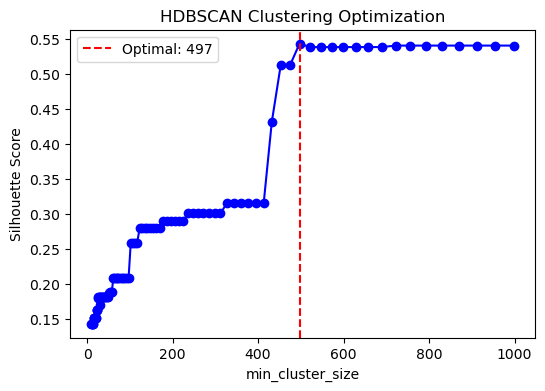

<Axes: ylabel='$\\lambda$ value'>

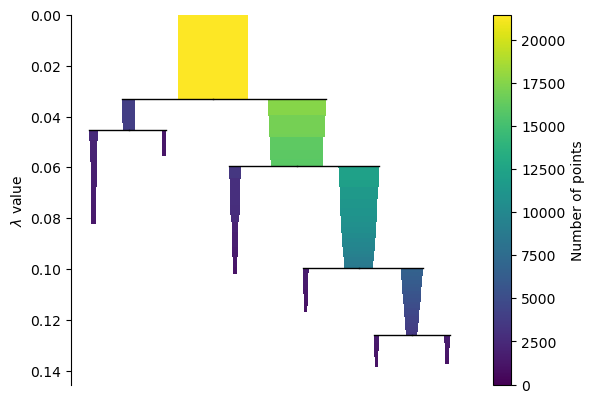

In [19]:
# optimising HDBSCAN min_cluster_size (minimun number of individuals to be considered per cluster - takes 5 min)
# Define Encoded Variables for Clustering and their importance**
encoded_var = [
    'age_clean', 'height_clean', 'income_clean', 'body_type_level', 'diet_code',
    'diet_level', 'drinks_level', 'drugs_level', 'education_level', 'education_code',
    'ethnicity_code', 'job_code', 'location_town_code', 'offspring_has', 'offspring_wants',
    'orientation_code', 'pets_dog', 'pets_cat', 'religion_code', 'religion_level',
    'sign_code', 'sign_level', 'smokes_code', 'speaks_program', 'status_code',
    'speaks_counter_clean', 'Dominant_Topic'
]

# Define feature weights
feature_weights = {
    "orientation_code": 3.0, "location_town_code": 3.0, "Dominant_Topic": 3.0, "status_code": 3.0,
    "smokes_code": 2.0, "drinks_level": 2.0, "drugs_level": 2.0,
    "diet_code": 2.0, "pets_cat": 2.0, "pets_dog": 2.0,
    "sign_level": 2.0, "religion_level": 2.0, "religion_code": 2.0
}

# Filter Data keep only completness score > 90%
profiles_filtered = profiles_ML_90_percent.copy()
X = profiles_filtered[encoded_var]

# Handle Missing Values
income_median_per_job = profiles_filtered.groupby("job_code")["income_clean"].median()

def impute_income(row):
    if pd.isna(row["income_clean"]):
        return income_median_per_job.get(row["job_code"], row["income_clean"])
    return row["income_clean"]

profiles_filtered["income_clean"] = profiles_filtered.apply(impute_income, axis=1)

imputer = SimpleImputer(strategy="median")
X_imputed = imputer.fit_transform(profiles_filtered[encoded_var])
X = pd.DataFrame(X_imputed, columns=encoded_var, index=profiles_filtered.index)

# Apply Feature Weights
for feature, weight in feature_weights.items():
    if feature in X.columns:
        X[feature] *= weight

# Train Isolation Forest for Outlier Detection with optimum parameters
print("Generating embeddings using Isolation Forest...")
iso_forest = IsolationForest(
    n_estimators=50,          # Optimal number of estimators
    contamination=0.2,        # Best contamination level found
    max_features=1.0,         # Using all features
    max_samples="auto",       # Automatically determines sample size
    bootstrap=False,          # No bootstrap sampling
    random_state=42,          # Ensures reproducibility
    n_jobs=-1,                # Uses all available CPU cores
    verbose=0,                # Keeps output silent
    warm_start=False          # No incremental learning
)
profiles_filtered["iso_score"] = iso_forest.fit_predict(X)

# filter out extreme outliers
profiles_filtered = profiles_filtered[profiles_filtered["iso_score"] > 0]  # Keep only likely "normal" profiles

# Optimize HDBSCAN Clustering using Silhouette Score
print("Generating silhouette scores...")
silhouette_scores = []
cluster_range = np.unique(np.logspace(np.log(10), np.log(1000), num=100, base=np.e).astype(int))

for min_cluster_size in cluster_range:
    clusterer = hdbscan.HDBSCAN(min_cluster_size=min_cluster_size, min_samples=10, metric='euclidean', cluster_selection_method='eom')
    labels = clusterer.fit_predict(X)
    if len(set(labels)) > 1:  # Avoid silhouette score error when only one cluster is found
        score = silhouette_score(X, labels)
        silhouette_scores.append(score)
    else:
        silhouette_scores.append(-1)  # Assign a negative score if clustering fails

# Identify the best min_cluster_size based on silhouette score
best_cluster_size = cluster_range[np.argmax(silhouette_scores)]
print(f"Best min_cluster_size: {best_cluster_size} with Silhouette Score: {max(silhouette_scores):.3f}")

# Plot Silhouette Scores**
plt.figure(figsize=(6, 4))
plt.plot(cluster_range, silhouette_scores, marker='o', linestyle='-', color='b')
plt.axvline(x=best_cluster_size, color='r', linestyle='--', label=f'Optimal: {best_cluster_size}')
plt.xlabel("min_cluster_size")
plt.ylabel("Silhouette Score")
plt.title("HDBSCAN Clustering Optimization")
plt.legend()
plt.show() # best min_cluster)size = 500

clusterer.condensed_tree_.plot()

Generating embeddings using Isolation Forest...
Generating silhouette scores...
Best min_samples: 10 with Silhouette Score: 0.543


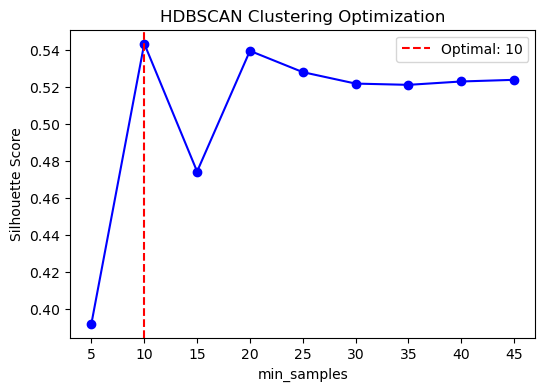

<Axes: ylabel='$\\lambda$ value'>

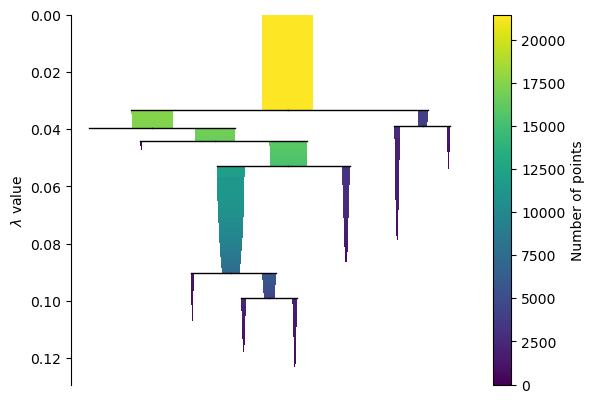

In [12]:
# optimising HDBSCAN min_samples (minimun number of individuals to be considered per cluster - takes 3 min)
# Define Encoded Variables for Clustering and their importance**
encoded_var = [
    'age_clean', 'height_clean', 'income_clean', 'body_type_level', 'diet_code',
    'diet_level', 'drinks_level', 'drugs_level', 'education_level', 'education_code',
    'ethnicity_code', 'job_code', 'location_town_code', 'offspring_has', 'offspring_wants',
    'orientation_code', 'pets_dog', 'pets_cat', 'religion_code', 'religion_level',
    'sign_code', 'sign_level', 'smokes_code', 'speaks_program', 'status_code',
    'speaks_counter_clean', 'Dominant_Topic'
]

# Define feature weights
feature_weights = {
    "orientation_code": 3.0, "location_town_code": 3.0, "Dominant_Topic": 3.0, "status_code": 3.0,
    "smokes_code": 2.0, "drinks_level": 2.0, "drugs_level": 2.0,
    "diet_code": 2.0, "pets_cat": 2.0, "pets_dog": 2.0,
    "sign_level": 2.0, "religion_level": 2.0, "religion_code": 2.0
}

# Filter Data keep only completness score > 90%
profiles_filtered = profiles_ML_90_percent.copy()
X = profiles_filtered[encoded_var]

# Handle Missing Values
income_median_per_job = profiles_filtered.groupby("job_code")["income_clean"].median()

def impute_income(row):
    if pd.isna(row["income_clean"]):
        return income_median_per_job.get(row["job_code"], row["income_clean"])
    return row["income_clean"]

profiles_filtered["income_clean"] = profiles_filtered.apply(impute_income, axis=1)

imputer = SimpleImputer(strategy="median")
X_imputed = imputer.fit_transform(profiles_filtered[encoded_var])
X = pd.DataFrame(X_imputed, columns=encoded_var, index=profiles_filtered.index)

# Apply Feature Weights
for feature, weight in feature_weights.items():
    if feature in X.columns:
        X[feature] *= weight

# Train Isolation Forest for Outlier Detection with optimum parameters
print("Generating embeddings using Isolation Forest...")
iso_forest = IsolationForest(
    n_estimators=50,          # Optimal number of estimators
    contamination=0.2,        # Best contamination level found
    max_features=1.0,         # Using all features
    max_samples="auto",       # Automatically determines sample size
    bootstrap=False,          # No bootstrap sampling
    random_state=42,          # Ensures reproducibility
    n_jobs=-1,                # Uses all available CPU cores
    verbose=0,                # Keeps output silent
    warm_start=False          # No incremental learning
)
profiles_filtered["iso_score"] = iso_forest.fit_predict(X)

# filter out extreme outliers
profiles_filtered = profiles_filtered[profiles_filtered["iso_score"] > 0]  # Keep only likely "normal" profiles

# Optimize HDBSCAN Clustering using Silhouette Score for `min_samples`
print("Generating silhouette scores...")
silhouette_scores = []
sample_range = range(5, 50, 5)  # Try min_samples from 5 to 50 in steps of 5

for min_samples in sample_range:
    clusterer = hdbscan.HDBSCAN(min_cluster_size=500, min_samples=min_samples, metric='euclidean', cluster_selection_method='eom')
    labels = clusterer.fit_predict(X)
    
    if len(set(labels)) > 1:  # Avoid silhouette score error when only one cluster is found
        score = silhouette_score(X, labels)
        silhouette_scores.append(score)
    else:
        silhouette_scores.append(-1)  # Assign a negative score if clustering fails

# Identify the best `min_samples` based on silhouette score
best_sample_size = sample_range[np.argmax(silhouette_scores)]
print(f"Best min_samples: {best_sample_size} with Silhouette Score: {max(silhouette_scores):.3f}")

# Plot Silhouette Scores
plt.figure(figsize=(6, 4))
plt.plot(sample_range, silhouette_scores, marker='o', linestyle='-', color='b')
plt.axvline(x=best_sample_size, color='r', linestyle='--', label=f'Optimal: {best_sample_size}')
plt.xlabel("min_samples")
plt.ylabel("Silhouette Score")
plt.title("HDBSCAN Clustering Optimization")
plt.legend()
plt.show() # best min_samples = 10

# Plot HDBSCAN Condensed Tree
clusterer.condensed_tree_.plot()

Generating embeddings using Isolation Forest...
Generating silhouette scores...
Best alpha: 0.5 with Silhouette Score: 0.274


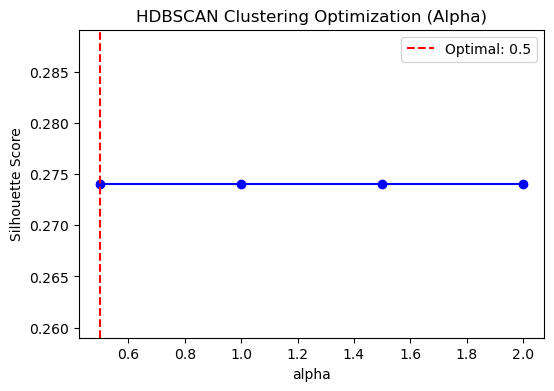

<Axes: ylabel='$\\lambda$ value'>

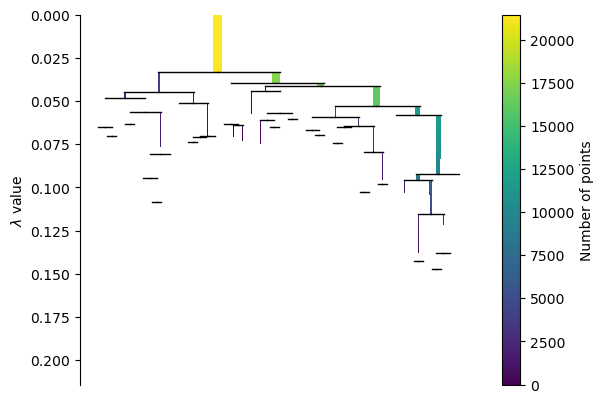

In [25]:
# optimising HDBSCAN alpha (distance scaling parameter as used in robust single linkage - takes 3 min)
# Define Encoded Variables for Clustering and their importance**
encoded_var = [
    'age_clean', 'height_clean', 'income_clean', 'body_type_level', 'diet_code',
    'diet_level', 'drinks_level', 'drugs_level', 'education_level', 'education_code',
    'ethnicity_code', 'job_code', 'location_town_code', 'offspring_has', 'offspring_wants',
    'orientation_code', 'pets_dog', 'pets_cat', 'religion_code', 'religion_level',
    'sign_code', 'sign_level', 'smokes_code', 'speaks_program', 'status_code',
    'speaks_counter_clean', 'Dominant_Topic'
]

# Define feature weights
feature_weights = {
    "orientation_code": 3.0, "location_town_code": 3.0, "Dominant_Topic": 3.0, "status_code": 3.0,
    "smokes_code": 2.0, "drinks_level": 2.0, "drugs_level": 2.0,
    "diet_code": 2.0, "pets_cat": 2.0, "pets_dog": 2.0,
    "sign_level": 2.0, "religion_level": 2.0, "religion_code": 2.0
}

# Filter Data keep only completness score > 90%
profiles_filtered = profiles_ML_90_percent.copy()
X = profiles_filtered[encoded_var]

# Handle Missing Values
income_median_per_job = profiles_filtered.groupby("job_code")["income_clean"].median()

def impute_income(row):
    if pd.isna(row["income_clean"]):
        return income_median_per_job.get(row["job_code"], row["income_clean"])
    return row["income_clean"]

profiles_filtered["income_clean"] = profiles_filtered.apply(impute_income, axis=1)

imputer = SimpleImputer(strategy="median")
X_imputed = imputer.fit_transform(profiles_filtered[encoded_var])
X = pd.DataFrame(X_imputed, columns=encoded_var, index=profiles_filtered.index)

# Apply Feature Weights
for feature, weight in feature_weights.items():
    if feature in X.columns:
        X[feature] *= weight

# Train Isolation Forest for Outlier Detection with optimum parameters
print("Generating embeddings using Isolation Forest...")
iso_forest = IsolationForest(
    n_estimators=50,          # Optimal number of estimators
    contamination=0.2,        # Best contamination level found
    max_features=1.0,         # Using all features
    max_samples="auto",       # Automatically determines sample size
    bootstrap=False,          # No bootstrap sampling
    random_state=42,          # Ensures reproducibility
    n_jobs=-1,                # Uses all available CPU cores
    verbose=0,                # Keeps output silent
    warm_start=False          # No incremental learning
)
profiles_filtered["iso_score"] = iso_forest.fit_predict(X)

# filter out extreme outliers
profiles_filtered = profiles_filtered[profiles_filtered["iso_score"] > 0]  # Keep only likely "normal" profiles

# Optimize HDBSCAN Clustering using Silhouette Score for `alpha`
print("Generating silhouette scores...")
silhouette_scores = []
alpha_range = np.arange(0.5, 2.5, 0.5)  # Try alpha values from 0.5 to 2.0

for alpha in alpha_range:
    clusterer = hdbscan.HDBSCAN(min_cluster_size=40, min_samples=14, alpha=alpha, metric='euclidean', cluster_selection_method='eom')
    labels = clusterer.fit_predict(X)
    
    if len(set(labels)) > 1:  # Avoid silhouette score error when only one cluster is found
        score = silhouette_score(X, labels)
        silhouette_scores.append(score)
    else:
        silhouette_scores.append(-1)  # Assign a negative score if clustering fails

# Identify the best `alpha` based on silhouette score
best_alpha = alpha_range[np.argmax(silhouette_scores)]
print(f"Best alpha: {best_alpha} with Silhouette Score: {max(silhouette_scores):.3f}")

# Plot Silhouette Scores
plt.figure(figsize=(6, 4))
plt.plot(alpha_range, silhouette_scores, marker='o', linestyle='-', color='b')
plt.axvline(x=best_alpha, color='r', linestyle='--', label=f'Optimal: {best_alpha}')
plt.xlabel("alpha")
plt.ylabel("Silhouette Score")
plt.title("HDBSCAN Clustering Optimization (Alpha)")
plt.legend()
plt.show() # alpha has no impact, no need to set it (default value is 1)

# Plot HDBSCAN Condensed Tree
clusterer.condensed_tree_.plot()

Generating embeddings using Isolation Forest...
Generating silhouette scores...
Best cluster_selection_epsilon: 0.001 with Silhouette Score: 0.199


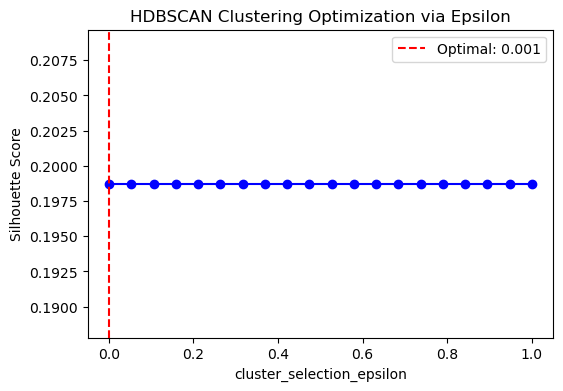

<Axes: ylabel='$\\lambda$ value'>

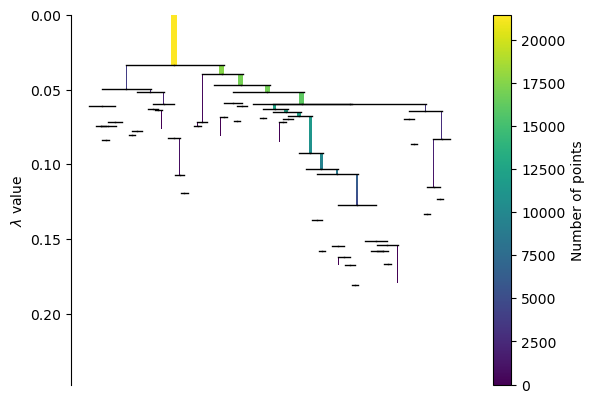

In [26]:
# optimising HDBSCAN cluster_selection_epsilon (distance threshold; clusters below this value will be merged - takes 5 min)
# **Define Encoded Variables for Clustering and their importance**
encoded_var = [
    'age_clean', 'height_clean', 'income_clean', 'body_type_level', 'diet_code',
    'diet_level', 'drinks_level', 'drugs_level', 'education_level', 'education_code',
    'ethnicity_code', 'job_code', 'location_town_code', 'offspring_has', 'offspring_wants',
    'orientation_code', 'pets_dog', 'pets_cat', 'religion_code', 'religion_level',
    'sign_code', 'sign_level', 'smokes_code', 'speaks_program', 'status_code',
    'speaks_counter_clean', 'Dominant_Topic'
]

# **Define feature weights**
feature_weights = {
    "orientation_code": 3.0, "location_town_code": 3.0, "Dominant_Topic": 3.0, "status_code": 3.0,
    "smokes_code": 2.0, "drinks_level": 2.0, "drugs_level": 2.0,
    "diet_code": 2.0, "pets_cat": 2.0, "pets_dog": 2.0,
    "sign_level": 2.0, "religion_level": 2.0, "religion_code": 2.0
}

# Filter Data keep only completness score > 90%
profiles_filtered = profiles_ML_90_percent.copy()
X = profiles_filtered[encoded_var]

# **Handle Missing Values**
income_median_per_job = profiles_filtered.groupby("job_code")["income_clean"].median()

def impute_income(row):
    if pd.isna(row["income_clean"]):
        return income_median_per_job.get(row["job_code"], row["income_clean"])
    return row["income_clean"]

profiles_filtered["income_clean"] = profiles_filtered.apply(impute_income, axis=1)

imputer = SimpleImputer(strategy="median")
X_imputed = imputer.fit_transform(profiles_filtered[encoded_var])
X = pd.DataFrame(X_imputed, columns=encoded_var, index=profiles_filtered.index)

# **Apply Feature Weights**
for feature, weight in feature_weights.items():
    if feature in X.columns:
        X[feature] *= weight

# Train Isolation Forest for Outlier Detection with optimum parameters
print("Generating embeddings using Isolation Forest...")
iso_forest = IsolationForest(
    n_estimators=50,          # Optimal number of estimators
    contamination=0.2,        # Best contamination level found
    max_features=1.0,         # Using all features
    max_samples="auto",       # Automatically determines sample size
    bootstrap=False,          # No bootstrap sampling
    random_state=42,          # Ensures reproducibility
    n_jobs=-1,                # Uses all available CPU cores
    verbose=0,                # Keeps output silent
    warm_start=False          # No incremental learning
)
profiles_filtered["iso_score"] = iso_forest.fit_predict(X)

# filter out extreme outliers
profiles_filtered = profiles_filtered[profiles_filtered["iso_score"] > 0]  # Keep only likely "normal" profiles

# **Optimize HDBSCAN Clustering using Silhouette Score by Looping Through Epsilon Values**
print("Generating silhouette scores...")
silhouette_scores = []
epsilon_range = np.linspace(0.001, 1.0, 20)  # Avoid exact 0.0

for epsilon in epsilon_range:
    epsilon = float(max(0.001, epsilon))  # Ensure epsilon is a valid float >= 0.001
    clusterer = hdbscan.HDBSCAN(
        min_cluster_size=40, min_samples=5, metric='euclidean', 
        cluster_selection_method='eom', cluster_selection_epsilon=epsilon
    )
    
    labels = clusterer.fit_predict(X)
    if len(set(labels)) > 1:  # Avoid silhouette score error when only one cluster is found
        score = silhouette_score(X, labels)
        silhouette_scores.append(score)
    else:
        silhouette_scores.append(-1)  # Assign a negative score if clustering fails

# Identify the best epsilon value based on silhouette score
best_epsilon = epsilon_range[np.argmax(silhouette_scores)]
print(f"Best cluster_selection_epsilon: {best_epsilon:.3f} with Silhouette Score: {max(silhouette_scores):.3f}")

# **Plot Silhouette Scores for Different Epsilon Values**
plt.figure(figsize=(6, 4))
plt.plot(epsilon_range, silhouette_scores, marker='o', linestyle='-', color='b')
plt.axvline(x=best_epsilon, color='r', linestyle='--', label=f'Optimal: {best_epsilon:.3f}')
plt.xlabel("cluster_selection_epsilon")
plt.ylabel("Silhouette Score")
plt.title("HDBSCAN Clustering Optimization via Epsilon")
plt.legend()
plt.show() # epsilon has no impact, no need to set it (default value is 0)

clusterer.condensed_tree_.plot()

In [27]:
# optimising HDBSCAN other parameters (takes 4 min)
# **Define Encoded Variables for Clustering and their importance**
encoded_var = [
    'age_clean', 'height_clean', 'income_clean', 'body_type_level', 'diet_code',
    'diet_level', 'drinks_level', 'drugs_level', 'education_level', 'education_code',
    'ethnicity_code', 'job_code', 'location_town_code', 'offspring_has', 'offspring_wants',
    'orientation_code', 'pets_dog', 'pets_cat', 'religion_code', 'religion_level',
    'sign_code', 'sign_level', 'smokes_code', 'speaks_program', 'status_code',
    'speaks_counter_clean', 'Dominant_Topic'
]

# **Define feature weights**
feature_weights = {
    "orientation_code": 3.0, "location_town_code": 3.0, "Dominant_Topic": 3.0, "status_code": 3.0,
    "smokes_code": 2.0, "drinks_level": 2.0, "drugs_level": 2.0,
    "diet_code": 2.0, "pets_cat": 2.0, "pets_dog": 2.0,
    "sign_level": 2.0, "religion_level": 2.0, "religion_code": 2.0
}

# Filter Data keep only completness score > 90%
profiles_filtered = profiles_ML_90_percent.copy()
X = profiles_filtered[encoded_var]

# **Handle Missing Values**
income_median_per_job = profiles_filtered.groupby("job_code")["income_clean"].median()

def impute_income(row):
    if pd.isna(row["income_clean"]):
        return income_median_per_job.get(row["job_code"], row["income_clean"])
    return row["income_clean"]

profiles_filtered["income_clean"] = profiles_filtered.apply(impute_income, axis=1)

imputer = SimpleImputer(strategy="median")
X_imputed = imputer.fit_transform(profiles_filtered[encoded_var])
X = pd.DataFrame(X_imputed, columns=encoded_var, index=profiles_filtered.index)

# **Apply Feature Weights**
for feature, weight in feature_weights.items():
    if feature in X.columns:
        X[feature] *= weight

# Train Isolation Forest for Outlier Detection with optimum parameters
print("Generating embeddings using Isolation Forest...")
iso_forest = IsolationForest(
    n_estimators=50,          # Optimal number of estimators
    contamination=0.2,        # Best contamination level found
    max_features=1.0,         # Using all features
    max_samples="auto",       # Automatically determines sample size
    bootstrap=False,          # No bootstrap sampling
    random_state=42,          # Ensures reproducibility
    n_jobs=-1,                # Uses all available CPU cores
    verbose=0,                # Keeps output silent
    warm_start=False          # No incremental learning
)
profiles_filtered["iso_score"] = iso_forest.fit_predict(X)

# filter out extreme outliers
profiles_filtered = profiles_filtered[profiles_filtered["iso_score"] > 0]  # Keep only likely "normal" profiles

# **Optimize HDBSCAN Clustering using Different Parameters**
print("Generating silhouette scores...")

# **Define parameters to test**
test_params = {
    "cluster_selection_method": ["eom", "leaf"],
    "metric": ["euclidean", "manhattan"], 
    "prediction_data": [False, True]
}

results = []

for method in test_params["cluster_selection_method"]:
    for metric in test_params["metric"]:
        for pred_data in test_params["prediction_data"]:
            print(f"Running HDBSCAN with method={method}, metric={metric}, prediction_data={pred_data}")

            X_transformed = X  # Keep raw features
            metric_param = metric  

            # Run HDBSCAN
            clusterer = hdbscan.HDBSCAN(
                min_cluster_size=40, 
                min_samples=14, 
                metric=metric_param,  
                cluster_selection_method=method,
                prediction_data=pred_data
            )
            labels = clusterer.fit_predict(X_transformed)

            # Compute silhouette score (only if more than 1 cluster exists)
            if len(set(labels)) > 1:
                score = silhouette_score(X_transformed, labels, metric=metric_param)
            else:
                score = -1  # Assign a negative score if clustering fails

            results.append((method, metric, pred_data, score))

# Convert results to DataFrame and display
results_df = pd.DataFrame(results, columns=["Method", "Metric", "Prediction Data", "Silhouette Score"])
results_df = results_df.sort_values(by="Silhouette Score", ascending=False)

display(results_df) # the highest the silhouette score, the better. best params are eom	euclidean ("prediction_data":False/True makes no difference)

Generating embeddings using Isolation Forest...
Generating silhouette scores...
Running HDBSCAN with method=eom, metric=euclidean, prediction_data=False
Running HDBSCAN with method=eom, metric=euclidean, prediction_data=True
Running HDBSCAN with method=eom, metric=manhattan, prediction_data=False
Running HDBSCAN with method=eom, metric=manhattan, prediction_data=True
Running HDBSCAN with method=leaf, metric=euclidean, prediction_data=False
Running HDBSCAN with method=leaf, metric=euclidean, prediction_data=True
Running HDBSCAN with method=leaf, metric=manhattan, prediction_data=False
Running HDBSCAN with method=leaf, metric=manhattan, prediction_data=True


,Method,Metric,Prediction Data,Silhouette Score
0,eom,euclidean,False,0.274077
1,eom,euclidean,True,0.274077
2,eom,manhattan,False,0.247048
3,eom,manhattan,True,0.247048
4,leaf,euclidean,False,-0.423767
5,leaf,euclidean,True,-0.423767
6,leaf,manhattan,False,-0.436010
7,leaf,manhattan,True,-0.436010


## run model with optimum IsolationForest and HDBSCAN params  
Best IsolationForest parameters:
- n_estimators = 50,          # Optimal number of estimators
- contamination = 0.2,        # Best contamination level found
- max_features = 1.0,         # Using all features
- max_samples = "auto",       # Automatically determines sample size
- bootstrap = False,          # No bootstrap sampling
- random_state =4 2,          # Ensures reproducibility
- n_jobs = -1,                # Uses all available CPU cores
- verbose = 0,                # Keeps output silent
- warm_start = False          # No incremental learning  

Best HDBSCAN parameters:    
- best min_cluster_size = 500 # Optimal minimum number of samples per cluster
- best min_samples = 10 # Optimal k 
- alpha has no impact, no need to set it (default value is 1)
- epsilon has no impact, no need to set it (default value is 0)
- best method = eom # Excess of Mass (eom) is the best method to idntify the most prominent and stable clusters
- best metric = euclidean # best distance calcaltion between samples
- prediction_data has no impact, no need to set it (default value is False)  

important steps leading to HDBSCAN clustering:  
- display(59896-21442) # 38454 with too many missing values in weighted features (see above)
- display(21442-17153) # 4289 outliers (see below)  

when running naive bayes or cosine, do this:
- add condition for orientation and sex.

Generating embeddings using Isolation Forest...


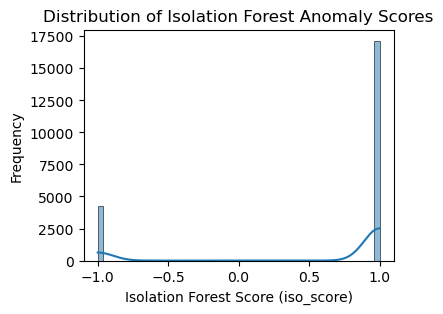

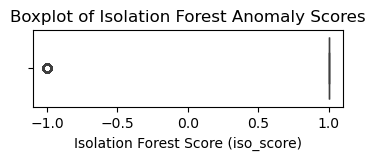

count    21442.000000
mean         0.599944
std          0.800061
min         -1.000000
25%          1.000000
50%          1.000000
75%          1.000000
max          1.000000
Name: iso_score, dtype: float64


(17153, 59)

Generating Clusters using HDBSCAN...


'Number of individuals per HDBSCAN cluster:'

hdbscan_clusters
 3    10292
 4     2658
 1     1834
 0      935
-1      862
 2      572
Name: count, dtype: int64


🔹 Model Evaluation Metrics (HDBSCAN Stability) 🔹
Accuracy: 0.089
Precision: 0.140
Recall: 0.280
F1-score: 0.180
Computing UMAP embedding...


C:\Users\Owner\miniconda3\envs\new_env\lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


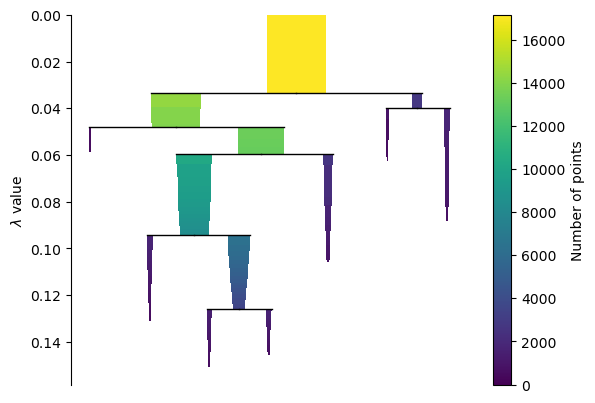

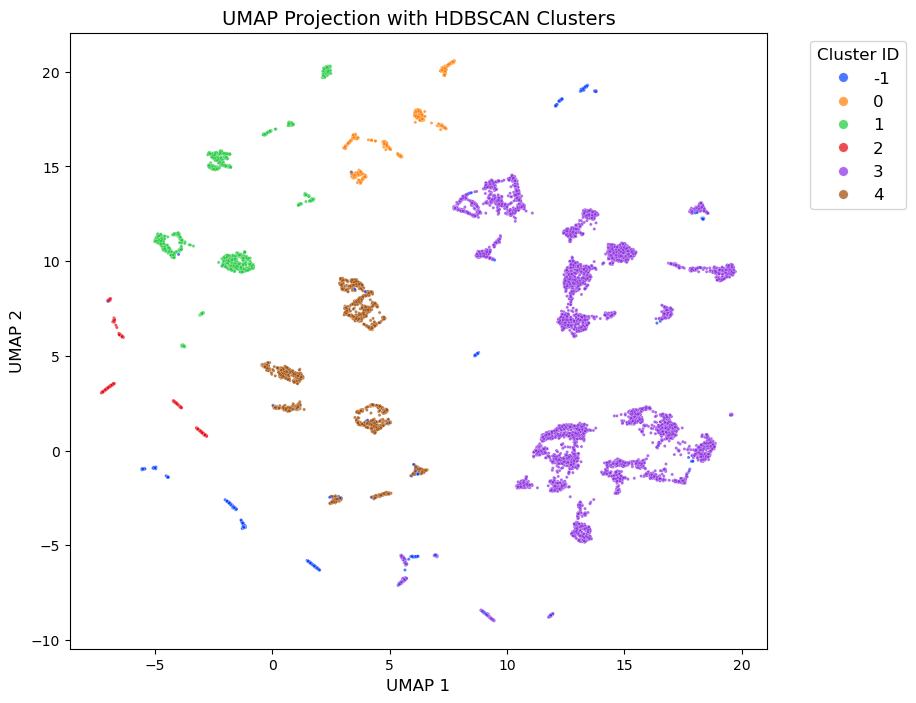

In [5]:
# Running model with optimum parameters and predicting hdbscan_clusters (takes 2 min)
# **Step 2: Define Encoded Variables for Clustering and their importance**
encoded_var = [
    'age_clean', 'height_clean', 'income_clean', 'body_type_level', 'diet_code',
    'diet_level', 'drinks_level', 'drugs_level', 'education_level', 'education_code',
    'ethnicity_code', 'job_code', 'location_town_code', 'offspring_has', 'offspring_wants',
    'orientation_code', 'pets_dog', 'pets_cat', 'religion_code', 'religion_level',
    'sign_code', 'sign_level', 'smokes_code', 'speaks_program', 'status_code',
    'speaks_counter_clean', 'Dominant_Topic'
]

# Define feature weights
feature_weights = {
    "orientation_code": 3.0, "location_town_code": 3.0, "Dominant_Topic": 3.0, "status_code": 3.0,
    "smokes_code": 2.0, "drinks_level": 2.0, "drugs_level": 2.0,
    "diet_code": 2.0, "pets_cat": 2.0, "pets_dog": 2.0, 'offspring_has': 2.0, 'offspring_wants': 2.0,
    "sign_level": 2.0, "religion_level": 2.0, "religion_code": 2.0
}

# Filter Data keep only completness score > 90%
profiles_filtered = profiles_ML_90_percent.copy()
X = profiles_filtered[encoded_var]

# **Step 4: Handle Missing Values**
income_median_per_job = profiles_filtered.groupby("job_code")["income_clean"].median()

def impute_income(row):
    if pd.isna(row["income_clean"]):
        return income_median_per_job.get(row["job_code"], row["income_clean"])
    return row["income_clean"]

profiles_filtered["income_clean"] = profiles_filtered.apply(impute_income, axis=1)

imputer = SimpleImputer(strategy="median")
X_imputed = imputer.fit_transform(profiles_filtered[encoded_var])
X = pd.DataFrame(X_imputed, columns=encoded_var, index=profiles_filtered.index)

# **Step 5: Apply Feature Weights**
for feature, weight in feature_weights.items():
    if feature in X.columns:
        X[feature] *= weight

# **Step 6: Train Isolation Forest for Outlier Detection with optimum parameters**
# Train Isolation Forest for Outlier Detection with optimum parameters
print("Generating embeddings using Isolation Forest...")
iso_forest = IsolationForest(
    n_estimators=50,          # Optimal number of estimators
    contamination=0.2,        # Best contamination level found
    max_features=1.0,         # Using all features
    max_samples="auto",       # Automatically determines sample size
    bootstrap=False,          # No bootstrap sampling
    random_state=42,          # Ensures reproducibility
    n_jobs=-1,                # Uses all available CPU cores
    verbose=0,                # Keeps output silent
    warm_start=False          # No incremental learning
)
profiles_filtered["iso_score"] = iso_forest.fit_predict(X)

# Visualise iso_score (= anomaly detection score to detect outliers)
# Plot iso_score distribution (Histogram + KDE)
plt.figure(figsize=(4, 3))
sns.histplot(profiles_filtered["iso_score"], bins=50, kde=True)
plt.title("Distribution of Isolation Forest Anomaly Scores")
plt.xlabel("Isolation Forest Score (iso_score)")
plt.ylabel("Frequency")
plt.show()
# Plot iso_score distribution (Boxplot)
plt.figure(figsize=(4, 1))
sns.boxplot(x=profiles_filtered["iso_score"])
plt.title("Boxplot of Isolation Forest Anomaly Scores")
plt.xlabel("Isolation Forest Score (iso_score)")
plt.show()
# Display summary statistics
print(profiles_filtered["iso_score"].describe())

# filter out extreme outliers
profiles_filtered = profiles_filtered[profiles_filtered["iso_score"] > 0]  # Keep only likely "normal" profiles
display(profiles_filtered.shape) # (17153, 60)
# Update X to match the filtered dataset
X = X.loc[profiles_filtered.index]

# **Step 7: Cluster Users Using HDBSCAN and optimised params**
print("Generating Clusters using HDBSCAN...")
clusterer = hdbscan.HDBSCAN(
    min_cluster_size=500,               # Best min cluster size
    min_samples=10,                      # Best min samples
    metric="euclidean",                   # Best distance metric
    cluster_selection_method="eom",       # Best cluster selection method
    cluster_selection_epsilon=0.0,        # Best epsilon
    alpha=1.0,                            # Best alpha
    prediction_data=False,                # Best setting for prediction
    gen_min_span_tree=False               # Best setting for min span tree
)
profiles_filtered["hdbscan_clusters"] = clusterer.fit_predict(X)
clusterer.condensed_tree_.plot()
display("Number of individuals per HDBSCAN cluster:", profiles_filtered["hdbscan_clusters"].value_counts())

# **Step 8: Train/Test Split for Evaluating Cluster Stability**
train_set, test_set = train_test_split(profiles_filtered, test_size=0.2, random_state=42, stratify=profiles_filtered["hdbscan_clusters"])
X_train, X_test = X.loc[train_set.index], X.loc[test_set.index]
y_train, y_test = train_set["hdbscan_clusters"], test_set["hdbscan_clusters"]

# **Step 9: Evaluate Model Performance**
y_pred = clusterer.fit_predict(X_test)

accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred, average="macro", zero_division=0)
recall = recall_score(y_test, y_pred, average="macro", zero_division=0)
f1 = f1_score(y_test, y_pred, average="macro", zero_division=0)

print("\nModel Evaluation Metrics (HDBSCAN Stability)")
print(f"Accuracy: {accuracy:.3f}")
print(f"Precision: {precision:.3f}")
print(f"Recall: {recall:.3f}")
print(f"F1-score: {f1:.3f}")

# **Step 10: Compute UMAP Embedding for Visualization**
print("Computing UMAP embedding...")
reducer = UMAP(n_components=2, metric='euclidean', random_state=42)
embedding = reducer.fit_transform(X)
# Add UMAP Coordinates to DataFrame
profiles_filtered["hdbscan_umap_1"] = embedding[:, 0]
profiles_filtered["hdbscan_umap_2"] = embedding[:, 1]

# **Step 11: Plot UMAP Projection with HDBSCAN Clusters**
plt.figure(figsize=(9, 8))
sns.scatterplot(
    x=embedding[:, 0], y=embedding[:, 1], 
    hue=profiles_filtered["hdbscan_clusters"], 
    palette="bright", s=5, alpha=0.7 
)
plt.title("UMAP Projection with HDBSCAN Clusters", fontsize=14)
plt.xlabel("UMAP 1", fontsize=12)
plt.ylabel("UMAP 2", fontsize=12)
legend = plt.legend(
    title="Cluster ID", bbox_to_anchor=(1.05, 1), loc='upper left',
    fontsize=12, markerscale=3, title_fontsize=12  # Enlarged legend dots & text
)
plt.show()

# Step 12: export results
profiles_filtered.to_csv('profiles_filtered_hdbscan.csv', sep=',', index=True)



Happy with this clustering, no more optimisation.

## Analyzing Feature Importance following HDBSCAN Cluster

In [25]:
# Step 1: Compute Mean Feature Values per Cluster
# Compute mean of each feature per cluster
cluster_means = profiles_filtered.groupby("hdbscan_clusters")[encoded_var].mean()

# Display the feature importance table
display("Cluster Feature Means:", cluster_means)

# Step 2: Perform ANOVA/Kruskal-Wallis to Find Most Important Features
anova_results = {}
kruskal_results = {}

for feature in encoded_var:
    groups = [profiles_filtered.loc[profiles_filtered["hdbscan_clusters"] == cluster, feature] for cluster in profiles_filtered["hdbscan_clusters"].unique()]
    
    # Perform ANOVA test (for normally distributed features)
    anova_p = f_oneway(*groups).pvalue
    
    # Perform Kruskal-Wallis test (for non-normal distributions)
    kruskal_p = kruskal(*groups).pvalue

    anova_results[feature] = anova_p
    kruskal_results[feature] = kruskal_p

# Convert results to DataFrame
anova_df = pd.DataFrame({"Feature": encoded_var, "ANOVA_pvalue": anova_results.values(), "Kruskal_pvalue": kruskal_results.values()})
anova_df = anova_df.sort_values(by="ANOVA_pvalue")
display("Feature Importance (ANOVA & Kruskal):", anova_df)

# Step 3: Train a Decision Tree to Identify Important Features
# Prepare data
X_train_scaled = StandardScaler().fit_transform(X)
y_train = profiles_filtered["hdbscan_clusters"]

# Train a decision tree
tree_clf = DecisionTreeClassifier(random_state=42, max_depth=5)
tree_clf.fit(X_train_scaled, y_train)

# Get feature importance scores
feature_importance = pd.DataFrame({"Feature": encoded_var, "Importance": tree_clf.feature_importances_})
feature_importance = feature_importance.sort_values(by="Importance", ascending=False)
display("Decision Tree Feature Importance:", feature_importance)

'Cluster Feature Means:'

,age_clean,height_clean,income_clean,body_type_level,diet_code,diet_level,drinks_level,drugs_level,education_level,education_code,ethnicity_code,job_code,location_town_code,offspring_has,offspring_wants,orientation_code,pets_dog,pets_cat,religion_code,religion_level,sign_code,sign_level,smokes_code,speaks_program,status_code,speaks_counter_clean,Dominant_Topic
hdbscan_clusters,,,,,,,,,,,,,,,,,,,,,,,,,,,
-1,3.453588,68.544084,36.596211,-1.162362,1.274691,1.984568,1.784223,0.101887,1.665857,1.955916,6.575406,9.881643,163.218097,0.368421,0.425000,0.092807,1.239521,1.196676,3.778422,1.526682,6.589499,1.367542,0.381839,0.033643,2.976798,11.097288,16.213457
0,3.447596,68.020321,35.225870,-0.977679,1.256588,1.961165,1.758289,0.123095,1.671141,1.698396,5.713369,9.582686,52.686631,0.292500,0.397790,0.111230,1.258564,1.165344,3.393583,1.573262,6.587719,1.314693,0.378378,0.016043,2.970053,11.107710,17.268449
1,3.436641,68.321331,35.079177,-1.221137,1.374140,2.002063,1.794536,0.124696,1.678330,1.762814,6.539804,9.373272,14.346238,0.268387,0.518229,0.117775,1.179648,1.159691,3.160851,1.549073,6.716992,1.349598,0.307650,0.019084,2.976554,11.118479,16.466739
2,3.488494,68.082168,36.664380,-1.309783,1.330579,2.006198,1.752632,0.103250,1.774545,1.791958,6.727273,10.978221,98.641608,0.332155,0.492857,0.061189,1.202206,1.189247,3.298951,1.510490,6.332721,1.334559,0.235915,0.052448,2.975524,11.113404,16.160839
3,3.446244,68.290614,36.811787,-1.380366,1.321924,2.019988,1.916999,0.179319,1.762092,1.636805,6.448990,10.808845,153.818597,0.151854,0.505906,0.148271,1.144257,1.076923,3.191411,1.473766,6.580971,1.321360,0.383673,0.030218,2.979304,11.116450,16.739895
4,3.491037,67.903651,35.509384,-1.016780,1.397579,2.023729,1.856389,0.190375,1.744914,1.820166,6.500000,9.617764,118.313770,0.273281,0.456706,0.154251,1.181675,1.203277,3.497366,1.446576,6.604823,1.364450,0.406309,0.021821,2.988337,11.116606,16.250188


'Feature Importance (ANOVA & Kruskal):'

,Feature,ANOVA_pvalue,Kruskal_pvalue
12,location_town_code,0.000000e+00,0.000000e+00
0,age_clean,6.964307e-15,1.888422e-16
10,ethnicity_code,1.497334e-14,5.263673e-16
18,religion_code,4.973441e-10,2.473892e-11
15,orientation_code,1.579022e-09,3.921814e-13
23,speaks_program,1.791524e-05,1.807364e-05
9,education_code,1.201361e-04,2.582316e-04
25,speaks_counter_clean,5.415958e-04,1.136159e-05
19,religion_level,2.842558e-03,3.250728e-03
26,Dominant_Topic,4.059174e-03,1.639603e-03


'Decision Tree Feature Importance:'

,Feature,Importance
12,location_town_code,0.989544
26,Dominant_Topic,0.004896
2,income_clean,0.003661
1,height_clean,0.000887
20,sign_code,0.000442
3,body_type_level,0.000328
11,job_code,0.000242
16,pets_dog,0.000000
25,speaks_counter_clean,0.000000
24,status_code,0.000000


# ML Cosine Similarity to pair individuals based on similarities in each HDBSCAN cluster
__Cosine Similarity:__
- Good for: Measuring how similar two individuals are based on their features.
- Works well for: Numerical and categorical data (as long as it’s encoded properly).
- Simple & efficient: No need for labels or interactions—just compute the similarity directly.

_Principle:_
Cosine similarity calculates the angle between two feature vectors.  
- A smaller angle → higher similarity (closer match)
- A larger angle → lower similarity (less of a match)

_Steps:_
- Normalize feature data (so that no single feature dominates).
- Compute cosine similarity between all individuals in the same HDBSCAN cluster.
- Recommend the most similar matches based on the highest cosine similarity scores.

_Add condition about orientation and sex:_  
Matching Rules:  
- Straight (0)
  - Male (0) matches Female (1)
  - Female (1) matches Male (0)
- Gay (1)
  - Male (0) matches Male (0)
  - Female (1) matches Female (1)
- Bisexual (2)
  - Can match both males and females


## Run ML model to find best matches

In [6]:
# load data (if HDBSCAN model hasn't not been run)
#profiles_filtered = pd.read_csv('profiles_filtered_hdbscan.csv', encoding='utf-8', dtype={"profile_id": str}, index_col="profile_id", low_memory=False)

# Optimal RandomForestRegressor hyperparameters were determined in the next section
# {'n_estimators': 50, 'min_samples_split': 2, 'min_samples_leaf': 2, 'max_depth': None}

# ML cosine model using weighted features and optimised RFR hyperparameters (2 min)
from tqdm import tqdm
# Get unique clusters (excluding noise)
unique_clusters = profiles_filtered["hdbscan_clusters"].unique()
unique_clusters = unique_clusters[unique_clusters != -1]  # Exclude noise (-1)

# Dictionary to store cluster matches
cluster_matches = {}

# Imputer to fill missing values with the median of each column
imputer = SimpleImputer(strategy="median")

# Apply feature weights
weighted_encoded_var = profiles_filtered[encoded_var].copy()
for feature, weight in feature_weights.items():
    if feature in weighted_encoded_var.columns:
        weighted_encoded_var[feature] *= weight

# Add columns to store best match information
profiles_filtered["best_match_profile_id"] = np.nan
profiles_filtered["best_match_score"] = np.nan

# Compute similarity for each cluster
print("Computing similarity for each cluster...")
for cluster in tqdm(unique_clusters, desc="Processing Clusters"):
    cluster_data = profiles_filtered[profiles_filtered["hdbscan_clusters"] == cluster]
    X_cluster = weighted_encoded_var.loc[cluster_data.index].to_numpy()

    # Handle missing values (Impute with median)
    X_cluster = imputer.fit_transform(X_cluster)

    cluster_indices = cluster_data.index.values.astype(str)  # Ensure indices are strings

    # Compute cosine similarity
    similarity_matrix = cosine_similarity(X_cluster)

    # Apply compatibility filtering using vectorized NumPy operations
    orientation = cluster_data["orientation_code"].to_numpy()
    sex = cluster_data["sex_code"].to_numpy()

    # Create boolean mask for valid matches
    valid_matches = (
        ((orientation[:, None] == 0) & (orientation == 0) & (sex[:, None] != sex)) |  # Straight
        ((orientation[:, None] == 1) & (orientation == 1) & (sex[:, None] == sex)) |  # Gay
        ((orientation[:, None] == 2) | (orientation == 2))  # Bisexual (matches all)
    )

    # Set invalid matches to -9999
    similarity_matrix[~valid_matches] = -9999

    # Store filtered similarity matrix
    cluster_matches[cluster] = similarity_matrix

    # Store best match profile ID & score in `profiles_filtered`
    for i, profile_id in enumerate(cluster_indices):
        sorted_indices = np.argsort(similarity_matrix[i])[::-1]  # Sort similarities
        best_match_idx = sorted_indices[1]  # Best match (excluding self)
        
        if similarity_matrix[i, best_match_idx] != -9999:
            best_match_profile_id = cluster_indices[best_match_idx]
            best_match_score = similarity_matrix[i, best_match_idx]

            profiles_filtered.loc[profile_id, "best_match_profile_id"] = best_match_profile_id
            profiles_filtered.loc[profile_id, "best_match_score"] = best_match_score

# Example: Print a few best match entries
columns_to_display = [
    "best_match_profile_id", "best_match_score", "hdbscan_clusters", "sex_code", "orientation_code",
    "location_town_code", "Dominant_Topic", "status_code", "smokes_code", "drinks_level", "drugs_level",
    "diet_code", "pets_cat", "pets_dog", "sign_level", "religion_level", "religion_code"
]
display(profiles_filtered[columns_to_display].head())
# Convert cluster keys to strings
cluster_matches_str_keys = {str(key): value for key, value in cluster_matches.items()}
# Save similarity matrices with string keys
np.savez_compressed("similarity_matrices.npz", **cluster_matches_str_keys)
# Save profiles_filtered DataFrame
profiles_filtered.to_csv("profiles_with_best_cosine_matches.csv", index=True)
print("Cosine similarity matrices and profile data exported successfully!")

### Predicting Similarity Scores Using Regression**
# predict the cosine similarity scores using weighted features

# Prepare dataset for training similarity score prediction
valid_profiles = profiles_filtered.dropna(subset=["best_match_score"])  # Remove NaNs

X = weighted_encoded_var.loc[valid_profiles.index]
y = valid_profiles["best_match_score"].astype(float)  # Convert similarity score to float

# Split dataset into train (70%), validation (15%), and test (15%)
X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.30, random_state=42)
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.50, random_state=42)

# Train a regression model (Random Forest Regressor) using optimal hyperparameters (see section below)
print("Training Random Forest Regression Model...")
rf_model = RandomForestRegressor(n_estimators=50, random_state=42, min_samples_split=2, min_samples_leaf=2, max_depth=None)
rf_model.fit(X_train, y_train)

# Predict similarity scores
y_pred_train = rf_model.predict(X_train)
y_pred_val = rf_model.predict(X_val)
y_pred_test = rf_model.predict(X_test)

# Evaluate performance
train_mae = mean_absolute_error(y_train, y_pred_train)
val_mae = mean_absolute_error(y_val, y_pred_val)
test_mae = mean_absolute_error(y_test, y_pred_test)

r2_train = r2_score(y_train, y_pred_train)
r2_val = r2_score(y_val, y_pred_val)
r2_test = r2_score(y_test, y_pred_test)

print(f"Train MAE: {train_mae:.4f}, R²: {r2_train:.4f}")
print(f"Validation MAE: {val_mae:.4f}, R²: {r2_val:.4f}")
print(f"Test MAE: {test_mae:.4f}, R²: {r2_test:.4f}")

### Converting Regression Output into Classification **
# Convert similarity scores into binary labels (Good match = 1, Otherwise = 0)
threshold = y_train.median()
y_train_bin = (y_train >= threshold).astype(int)
y_val_bin = (y_val >= threshold).astype(int)
y_test_bin = (y_test >= threshold).astype(int)

# Convert predicted similarity scores into binary classification
y_pred_train_bin = (y_pred_train >= threshold).astype(int)
y_pred_val_bin = (y_pred_val >= threshold).astype(int)
y_pred_test_bin = (y_pred_test >= threshold).astype(int)

# Compute classification metrics
train_accuracy = accuracy_score(y_train_bin, y_pred_train_bin)
val_accuracy = accuracy_score(y_val_bin, y_pred_val_bin)
test_accuracy = accuracy_score(y_test_bin, y_pred_test_bin)

train_precision = precision_score(y_train_bin, y_pred_train_bin)
val_precision = precision_score(y_val_bin, y_pred_val_bin)
test_precision = precision_score(y_test_bin, y_pred_test_bin)

train_recall = recall_score(y_train_bin, y_pred_train_bin)
val_recall = recall_score(y_val_bin, y_pred_val_bin)
test_recall = recall_score(y_test_bin, y_pred_test_bin)

train_f1 = f1_score(y_train_bin, y_pred_train_bin)
val_f1 = f1_score(y_val_bin, y_pred_val_bin)
test_f1 = f1_score(y_test_bin, y_pred_test_bin)

# Print results
print(f"\nClassification Metrics:")
print(f"Train: Accuracy={train_accuracy:.4f}, Precision={train_precision:.4f}, Recall={train_recall:.4f}, F1={train_f1:.4f}")
print(f"Validation: Accuracy={val_accuracy:.4f}, Precision={val_precision:.4f}, Recall={val_recall:.4f}, F1={val_f1:.4f}")
print(f"Test: Accuracy={test_accuracy:.4f}, Precision={test_precision:.4f}, Recall={test_recall:.4f}, F1={test_f1:.4f}")



Computing similarity for each cluster...


C:\Users\Owner\AppData\Local\Temp\ipykernel_4184\1765519673.py:69: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '11500' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
  profiles_filtered.loc[profile_id, "best_match_profile_id"] = best_match_profile_id
Processing Clusters: 100%|██████████| 5/5 [00:29<00:00,  5.83s/it]


,best_match_profile_id,best_match_score,hdbscan_clusters,sex_code,orientation_code,location_town_code,Dominant_Topic,status_code,smokes_code,drinks_level,drugs_level,diet_code,pets_cat,pets_dog,sign_level,religion_level,religion_code
profile_id,,,,,,,,,,,,,,,,,
8,11500,0.999850,3,1,0,154,14,3,0.0,2.0,0.0,1.0,1.0,1.0,0.0,0.0,4.0
9,12141,0.996507,1,1,0,14,26,3,3.0,2.0,NaN,1.0,1.0,1.0,1.0,2.0,4.0
10,5206,0.999802,3,0,0,160,0,3,0.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0
12,36225,0.995461,0,0,0,43,15,2,0.0,2.0,0.0,1.0,1.0,NaN,1.0,4.0,4.0
14,45549,0.999878,3,1,0,154,15,3,0.0,2.0,0.0,1.0,1.0,2.0,NaN,2.0,4.0


🔹 Cosine similarity matrices and profile data exported successfully!
Training Random Forest Regression Model...
Train MAE: 0.0001, R²: 0.9689
Validation MAE: 0.0002, R²: 0.8496
Test MAE: 0.0002, R²: 0.8790

🔹 Classification Metrics:
Train: Accuracy=0.9576, Precision=0.9528, Recall=0.9628, F1=0.9578
Validation: Accuracy=0.8936, Precision=0.8832, Recall=0.9116, F1=0.8972
Test: Accuracy=0.8948, Precision=0.8840, Recall=0.9132, F1=0.8984


In [8]:
# export one similarity matrix per hdbscan cluster
# load data (if HDBSCAN model hasn't been run)
#profiles_filtered = pd.read_csv('profiles_filtered_hdbscan.csv', encoding='utf-8', dtype={"profile_id": str}, index_col="profile_id", low_memory=False)

# Ensure profile_id is loaded as string
profiles_filtered["profile_id"] = profiles_filtered.index.astype(str)

# Get unique clusters (excluding noise)
unique_clusters = profiles_filtered["hdbscan_clusters"].unique()
unique_clusters = unique_clusters[unique_clusters != -1]  # Exclude noise (-1)

# Imputer to fill missing values with the median of each column
imputer = SimpleImputer(strategy="median")

# Apply feature weights
weighted_encoded_var = profiles_filtered[encoded_var].copy()
for feature, weight in feature_weights.items():
    if feature in weighted_encoded_var.columns:
        weighted_encoded_var[feature] *= weight

# Compute similarity for each cluster
print("Computing similarity for each cluster...")
for cluster in tqdm(unique_clusters, desc="Processing Clusters"):
    cluster_data = profiles_filtered[profiles_filtered["hdbscan_clusters"] == cluster]

    if cluster_data.empty:
        print(f"Skipping empty cluster {cluster} (no valid profiles).")
        continue  # Skip this cluster

    X_cluster = weighted_encoded_var.loc[cluster_data.index].to_numpy()

    if X_cluster.shape[0] == 0:
        print(f"Skipping cluster {cluster} (no valid features).")
        continue  # Skip clusters with no valid data

    # Handle missing values (Impute with median)
    X_cluster = imputer.fit_transform(X_cluster)

    cluster_indices = cluster_data.index.astype(str).to_numpy()  # Ensure profile IDs are strings

    # Compute cosine similarity
    similarity_matrix = cosine_similarity(X_cluster)

    # Apply compatibility filtering using vectorized NumPy operations
    orientation = cluster_data["orientation_code"].to_numpy()
    sex = cluster_data["sex_code"].to_numpy()

    # Create boolean mask for valid matches
    valid_matches = (
        ((orientation[:, None] == 0) & (orientation == 0) & (sex[:, None] != sex)) |  # Straight
        ((orientation[:, None] == 1) & (orientation == 1) & (sex[:, None] == sex)) |  # Gay
        ((orientation[:, None] == 2) | (orientation == 2))  # Bisexual (matches all)
    )

    # Set invalid matches to -9999
    similarity_matrix[~valid_matches] = -9999

    # Convert similarity matrix to DataFrame for export
    sim_df = pd.DataFrame(similarity_matrix, index=cluster_indices, columns=cluster_indices)
    sim_df.index.name = "profile_id"  # Set index header as "profile_id"

    # Remove invalid matches (-9999)
    sim_df = sim_df.replace(-9999, np.nan)

    # Save to CSV
    file_name = f"similarity_matrix_cluster_{cluster}.csv"
    sim_df.to_csv(file_name, encoding="utf-8", sep=",", index=True)
    print(f"Saved similarity matrix for cluster {cluster} → {file_name}")

print("✅ All similarity matrices exported successfully!")


Computing similarity for each cluster...


Processing Clusters:  20%|██        | 1/5 [02:37<10:28, 157.10s/it]

🔹 Saved similarity matrix for cluster 3 → similarity_matrix_cluster_3.csv


Processing Clusters:  40%|████      | 2/5 [02:42<03:23, 67.75s/it] 

🔹 Saved similarity matrix for cluster 1 → similarity_matrix_cluster_1.csv


Processing Clusters:  60%|██████    | 3/5 [02:43<01:14, 37.38s/it]

🔹 Saved similarity matrix for cluster 0 → similarity_matrix_cluster_0.csv


Processing Clusters:  80%|████████  | 4/5 [02:55<00:27, 27.40s/it]

🔹 Saved similarity matrix for cluster 4 → similarity_matrix_cluster_4.csv


Processing Clusters: 100%|██████████| 5/5 [02:56<00:00, 35.27s/it]

🔹 Saved similarity matrix for cluster 2 → similarity_matrix_cluster_2.csv
✅ All similarity matrices exported successfully!


__Model performance:__  
_Regression Performance (Predicting Cosine Similarity)_  
- Train R² = 0.97 → The model explains 97% of the variance in similarity scores (excellent).  
- Validation R² = 0.85 → Still strong generalization.  
- Test R² = 0.88 → 88% of the test data variance is explained—very robust.
  
_Classification Performance (Predicting Good Matches)_  
- Train Accuracy = 96% → Nearly perfect match classification.  
- Validation Accuracy = 89% → Great generalization with a high recall of 90.68% (few missed good matches).  
- Test Accuracy = 89% → Consistently high across unseen data.  

_Interpreting Cosine Results:_
- Higher intra-cluster similarity (closer to 1) and lower inter-cluster similarity (closer to 0) → The model is grouping similar people correctly.
- Higher Precision@5 → The model recommends people in the same cluster correctly.
- Higher Recall@5 → The model retrieves relevant similar profiles for a given user.

## Optimise ML model

In [8]:
# optimise RandomForestRegressor hyperparameters (1 min)
# Define a reduced hyperparameter search space
param_dist = {
    'n_estimators': [50, 100, 150],  # Reduce values
    'max_depth': [10, 20, None],  # Remove excessive values
    'min_samples_split': [2, 5],  # Fewer values
    'min_samples_leaf': [1, 2]  # Fewer values
}

# Initialize Random Forest Regressor
rf_regressor = RandomForestRegressor(random_state=42)

# Perform Randomized Search with 10 iterations (much faster than GridSearch)
random_search = RandomizedSearchCV(estimator=rf_regressor, param_distributions=param_dist, 
                                   n_iter=10, cv=2, scoring='r2', n_jobs=-1, verbose=2, random_state=42)

print("Tuning hyperparameters (optimized for speed)...")
random_search.fit(X_train, y_train)

# Get best parameters
best_params = random_search.best_params_
print("\nBest RandomForestRegressor Hyperparameters Found:")
print(best_params)

# Update n_estimators to 50 for final training
best_params["n_estimators"] = 50  

# Train final model with updated parameters
rf_best = RandomForestRegressor(**best_params, random_state=42)  
rf_best.fit(X_train, y_train)

# Predict on test set
y_pred_test_best = rf_best.predict(X_test)

# Evaluate performance
test_mae_best = mean_absolute_error(y_test, y_pred_test_best)
r2_test_best = r2_score(y_test, y_pred_test_best)

print(f"\nTuned Model Performance on Test Set:")
print(f"Test MAE: {test_mae_best:.4f}, R²: {r2_test_best:.4f}")

Tuning hyperparameters (optimized for speed)...
Fitting 2 folds for each of 10 candidates, totalling 20 fits

🔹 Best Hyperparameters Found:
{'n_estimators': 50, 'min_samples_split': 2, 'min_samples_leaf': 2, 'max_depth': None}

🔹 Tuned Model Performance on Test Set:
Test MAE: 0.0002, R²: 0.8790


## Analyse feature importance

C:\Users\Owner\miniconda3\envs\new_env\lib\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 128313 (\N{SMALL BLUE DIAMOND}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


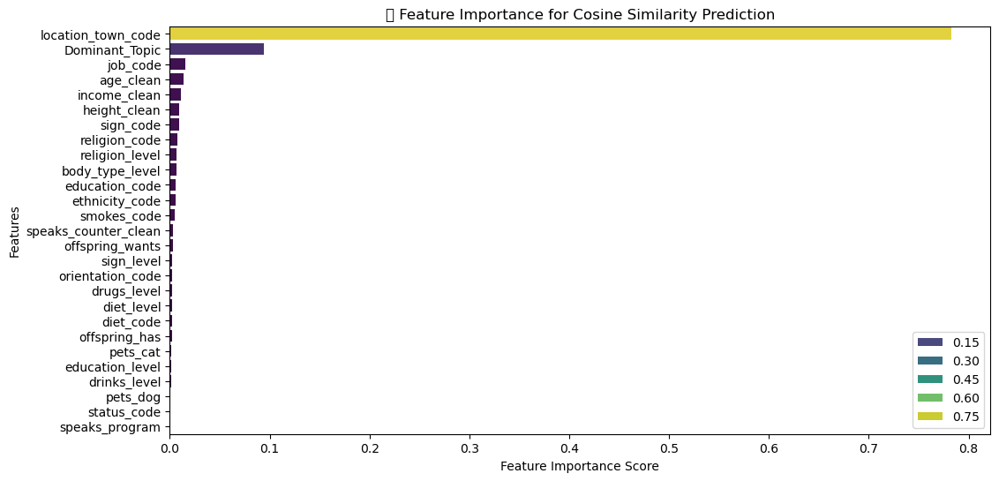

In [12]:
# Get feature importances from the trained model
feature_importances = rf_best.feature_importances_

# Create DataFrame for visualization
importance_df = pd.DataFrame({'Feature': X_train.columns, 'Importance': feature_importances})
importance_df = importance_df.sort_values(by="Importance", ascending=False)

# Plot feature importance
plt.figure(figsize=(12, 6))
sns.barplot(x="Importance", y="Feature", data=importance_df, hue="Importance", palette="viridis")
plt.xlabel("Feature Importance Score")
plt.ylabel("Features")
plt.title("Feature Importance for Cosine Similarity Prediction")
plt.legend(loc='lower right')
plt.show()

# Visualise cosine matches
A network graph is perfect for visualizing matched profiles based on cosine similarity.  
- Nodes = Profile IDs
- Edges (Links) = Cosine similarity scores (thicker edges = stronger match)
- Node Size = Number of strong connections (degree of the node)
- Edge Color = Strength of similarity

In [3]:
# Load profiles_cosine DataFrame with encoded features for heatmap
profiles_cosine = pd.read_csv("profiles_features_with_best_cosine_matches.csv", 
                                encoding='latin-1', 
                                dtype={"profile_id": str}, 
                                index_col="profile_id")
# Define columns to drop as they are irrelevant for the ML model
columns_to_drop = ['Unnamed: 80', 'Unnamed: 81']
# Drop the specified columns
profiles_cosine  = profiles_cosine .drop(columns=columns_to_drop)
# Check first few rows of profiles_filtered
print("profiles_cosine:")
display(profiles_cosine .head(2))
display(profiles_cosine .columns)

# Load complete similarity matrices (for all clusters)
similarity_data = np.load("similarity_matrices.npz", allow_pickle=True)
cluster_matches = {key: similarity_data[key] for key in similarity_data.files}
print("Cosine similarity matrices and profile data loaded successfully!")

# Check available clusters
print("Clusters in similarity data:", list(cluster_matches.keys()))

# Check shape of one similarity matrix
first_cluster = list(cluster_matches.keys())[0]  # Get the first cluster
print(f"Cluster {first_cluster} similarity matrix shape:", cluster_matches[first_cluster].shape)

# Dictionary to store all similarity matrices
similarity_matrices = {}

# Set a file size limit (e.g., 40MB → 40 * 1024 * 1024 bytes)
FILE_SIZE_LIMIT = 40 * 1024 * 1024  # Adjust as needed

# List of valid similarity matrix files
valid_files = [
    "similarity_matrix_cluster_0.csv",
    "similarity_matrix_cluster_1.csv",
    "similarity_matrix_cluster_2.csv",
    "similarity_matrix_cluster_3.csv",
    "similarity_matrix_cluster_4.csv",
]

# Load similarity matrices, skipping large ones
for file in valid_files:
    if os.path.exists(file):  # Ensure file exists before loading
        file_size = os.path.getsize(file)  # Get file size
        
        if file_size > FILE_SIZE_LIMIT:
            print(f"⚠️ Skipping {file} (Too large: {file_size / (1024 * 1024):.2f} MB)")
            continue  # Skip this file

        df = pd.read_csv(file, index_col=0, dtype=str, header=0)  # Load matrix

        # Ensure index and column names are strings
        df.index = df.index.astype(str)
        df.columns = df.columns.astype(str)

        # Check if it's square
        if df.shape[0] != df.shape[1]:  
            print(f"⚠️ Skipping {file} (Invalid shape: {df.shape})")
            continue  # Skip this file
        
        df.columns = df.index  # Explicitly set column labels as profile IDs

        # Extract cluster number for dictionary key
        cluster_id = file.split("_")[-1].split(".")[0]
        similarity_matrices[cluster_id] = df  # Store valid matrix

print(f"Loaded {len(similarity_matrices)} similarity matrices (excluding large ones)!")

# Display matrix for cluster 2 if available
cluster_id_to_display = "2"  # Display Cluster 2 Matrix
if cluster_id_to_display in similarity_matrices:
    display(similarity_matrices[cluster_id_to_display])  # Show matrix
else:
    print(f"Cluster {cluster_id_to_display} not found in loaded matrices.")



profiles_cosine:


,body_type,diet,drinks,drugs,education,ethnicity,height,income,job,offspring,orientation,pets,religion,sex,sign,smokes,speaks,status,age_filtered,height_filtered,income_filtered,age_clean,height_clean,income_clean,location_town,location_state,location_country,body_type_level,diet_code,diet_level,drinks_level,drugs_level,education_level,education_type,education_code,ethnicity_clean,ethnicity_code,job_code,location_town_code,offspring_has,offspring_wants,orientation_code,pets_dog,pets_cat,religion_code,religion_level,sex_code,sign_code,sign_level,smokes_code,speaks_program,status_code,speaks_counter_clean,essay_clean,Dominant_Topic,Topic_Label,Topic_Prevalence,completeness_score,iso_score,hdbscan_clusters,hdbscan_umap_1,hdbscan_umap_2,best_match_profile_id,best_match_score,Diet Type,Diet Level Label,Drinks Level Label,Drugs Level Label,Education Level Label,Offspring Wants Label,Offsprings Has Label,Pets Cat label,Pets Dog Label,Religion Code Label,Religion Level Label,Sign Code Label,Sign Level label,Smokes Code Label,Topic Label post TF-IDF filtering
profile_id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
8,average,mostly anything,socially,never,graduated from college/university,white,65,-1,artistic / musical / writer,"doesn?ÇÖt have kids, but wants them",straight,likes dogs and likes cats,christianity,f,sagittarius,no,"english, spanish (okay)",single,31,65.0,NaN,3.433987,65.0,31.072325,san francisco,california,US,0.0,1.0,2.0,2.0,0.0,2.0,college/university,0,white,8,5.0,154,0.0,NaN,0,1.0,1.0,4,0,1,9.0,0.0,0.0,0,3,11.247214,write meet new people spend time friend see fi...,14.0,New / Enjoy / Live,7.096998,30.0,1.0,3.0,14.450548,10.742237,11500.0,0.999850,anything,mostly,drinking: socially,drug use: no,Graduated,NaN,has 0 kid,likes cats,likes dogs,christianity,NaN,sagittarius,NaN,smoking: no,Active / Summer / Hiking
9,NaN,strictly anything,socially,NaN,graduated from college/university,white,67,-1,NaN,doesn?ÇÖt have kids,straight,likes dogs and likes cats,christianity but not too serious about it,f,gemini but it doesn?ÇÖt matter,when drinking,english,single,24,67.0,NaN,3.178054,67.0,NaN,belvedere tiburon,california,US,NaN,1.0,3.0,2.0,NaN,2.0,college/university,0,white,8,NaN,14,0.0,NaN,0,1.0,1.0,4,2,1,5.0,1.0,3.0,0,3,11.007933,goodness moment job nice find settle make sure...,26.0,Girl / Think / New,4.317561,28.0,1.0,1.0,-1.455147,9.781508,12141.0,0.996507,anything,strictly,drinking: socially,NaN,Graduated,NaN,has 0 kid,likes cats,likes dogs,christianity,religion: not too serious,gemini,sign doesn't matter,smoking: when drinking,Wear / Ice / Chocolate


Index(['body_type', 'diet', 'drinks', 'drugs', 'education', 'ethnicity',
       'height', 'income', 'job', 'offspring', 'orientation', 'pets',
       'religion', 'sex', 'sign', 'smokes', 'speaks', 'status', 'age_filtered',
       'height_filtered', 'income_filtered', 'age_clean', 'height_clean',
       'income_clean', 'location_town', 'location_state', 'location_country',
       'body_type_level', 'diet_code', 'diet_level', 'drinks_level',
       'drugs_level', 'education_level', 'education_type', 'education_code',
       'ethnicity_clean', 'ethnicity_code', 'job_code', 'location_town_code',
       'offspring_has', 'offspring_wants', 'orientation_code', 'pets_dog',
       'pets_cat', 'religion_code', 'religion_level', 'sex_code', 'sign_code',
       'sign_level', 'smokes_code', 'speaks_program', 'status_code',
       'speaks_counter_clean', 'essay_clean', 'Dominant_Topic', 'Topic_Label',
       'Topic_Prevalence', 'completeness_score', 'iso_score',
       'hdbscan_clusters', 'hdbscan_u

🔹 Cosine similarity matrices and profile data loaded successfully!
Clusters in similarity data: ['3', '1', '0', '4', '2']
🔹 Cluster 3 similarity matrix shape: (10292, 10292)
⚠️ Skipping similarity_matrix_cluster_3.csv (Too large: 871.36 MB)
⚠️ Skipping similarity_matrix_cluster_4.csv (Too large: 61.57 MB)
✅ Loaded 3 similarity matrices (excluding large ones)!


profile_id,55,106,107,182,210,282,316,329,368,404,419,473,576,599,818,1032,1096,1187,1271,1272,1437,1462,1516,1610,1687,1758,1809,1902,1931,2003,2172,2521,2643,2891,3037,3080,3102,3176,3296,3542,3585,3596,3697,4017,4095,4219,4332,4372,4515,4552,4697,4775,4778,4804,4863,5221,5231,5241,5673,5703,5720,5794,5818,5828,6042,6576,6591,6640,6698,6869,6910,7270,7355,7407,7526,7536,7596,7763,7972,8144,8210,8761,8988,9003,9030,9110,9145,9391,9813,9889,9902,10005,10074,10133,10223,10331,10414,10588,10616,10626,10627,10851,10888,10902,10973,11095,11151,11291,11342,11462,11463,11470,11477,11531,11566,11643,11697,11779,11865,11900,12081,12176,12209,12537,12722,12786,13051,13150,13388,13455,13458,13710,13816,13920,14048,14107,14113,14168,14241,14274,14615,14780,14802,14822,14858,14921,15049,15086,15227,15340,15546,15789,15861,15866,15992,16056,16146,16170,16477,16590,16691,16841,17010,17066,17107,17254,17407,17420,17515,17675,17724,17830,17865,17953,18160,18167,18206,18340,18513,18678,18881,18936,19139,19323,19552,19635,19751,19831,19863,19983,19997,20045,20185,20404,20563,20621,20693,20772,20813,21182,21203,21241,21334,21466,21475,21477,21489,21496,21829,22002,22051,22082,22137,22158,22229,22285,22396,22464,22489,23003,23014,23050,23078,23143,23226,23416,23438,23529,23972,23975,24055,24128,24270,24413,24453,24487,24675,24799,24845,24923,25089,25109,25251,25393,25564,25627,25648,25770,25806,25816,25851,25925,26066,26109,26292,26489,26498,26500,26509,26932,26962,27176,27177,27293,27316,27411,27461,27545,27655,27735,27856,27918,27959,28043,28513,28583,28641,28866,28977,29088,29300,29325,29410,29599,29727,29926,29978,30220,30226,30243,30335,30351,30764,30855,30943,31036,31083,31138,31171,31204,31438,31457,31675,31705,31908,32251,32269,32274,32346,32376,32544,32623,33315,33405,33412,33709,33729,33955,34545,34752,34761,34762,34776,34841,34989,35020,35037,35100,35160,35237,35418,35702,35852,35976,36092,36163,36167,36169,36380,36456,36486,36578,36593,36771,36854,36914,37007,37038,37087,37110,37151,37189,37244,37266,37482,37523,37756,37799,37857,37981,38007,38034,38123,38165,38290,38364,38480,38647,38657,38752,38818,38916,38931,39011,39015,39054,39085,39194,39443,39495,39562,39649,39806,39876,40153,40268,40356,40420,40520,40575,40757,40768,40842,40916,40964,41026,41129,41186,41195,41237,41352,41372,41510,41541,41664,41731,41861,42014,42270,42616,42752,43187,43244,43248,43262,43282,43405,43717,43931,44189,44199,44271,44331,44592,44653,44689,44755,44889,44902,44941,45313,45387,45445,46025,46135,46264,46380,46484,46503,46710,46751,46783,46786,46883,46933,47089,47112,47170,47272,47476,47595,47686,47722,47734,47788,47790,47835,47873,47909,48088,48216,48291,48402,48445,48524,48618,48648,48703,48880,48890,48995,49005,49083,49280,49473,49542,50011,50090,50258,50435,50480,50829,50848,50946,51191,51268,51276,51311,51393,51471,51566,51579,51614,51690,51735,51801,51898,52006,52042,52325,52346,52456,52524,52635,52920,53007,53051,53118,53125,53176,53185,53328,53644,53757,53763,53989,54042,54148,54231,54259,54318,54399,54421,54443,54455,54488,54696,54751,54912,54923,54924,55039,55169,55229,55350,55536,55630,55685,55714,55785,55845,55893,56198,56425,56429,56460,56611,56618,56867,57026,57145,57218,57661,57675,57763,58046,58086,58087,58095,58098,58109,58124,58153,58364,58407,58661,58887,59098,59385,59510,59616,59749
profile_id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
55,NaN,0.996153734117425,0.9991927438183306,0.9866922646323173,0.9984759964686585

## display 20 closest matches of a given individual

### profile_id 106 (cluster 2)

,body_type,diet,drinks,drugs,education,ethnicity,height,income,job,offspring,orientation,pets,religion,sex,sign,smokes,speaks,status,age_filtered,height_filtered,income_filtered,age_clean,height_clean,income_clean,location_town,location_state,location_country,body_type_level,diet_code,diet_level,drinks_level,drugs_level,education_level,education_type,education_code,ethnicity_clean,ethnicity_code,job_code,location_town_code,offspring_has,offspring_wants,orientation_code,pets_dog,pets_cat,religion_code,religion_level,sex_code,sign_code,sign_level,smokes_code,speaks_program,status_code,speaks_counter_clean,essay_clean,Dominant_Topic,Topic_Label,Topic_Prevalence,completeness_score,iso_score,hdbscan_clusters,hdbscan_umap_1,hdbscan_umap_2,best_match_profile_id,best_match_score,Diet Type,Diet Level Label,Drinks Level Label,Drugs Level Label,Education Level Label,Offspring Wants Label,Offsprings Has Label,Pets Cat label,Pets Dog Label,Religion Code Label,Religion Level Label,Sign Code Label,Sign Level label,Smokes Code Label,Topic Label post TF-IDF filtering,similarity_score
profile_id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
106,fit,mostly anything,socially,never,graduated from masters program,white,65,-1,education / academia,has kids,straight,likes dogs,judaism,f,aries but it doesn?ÇÖt matter,no,"english (fluently), french (poorly), hebrew (o...",single,42,65.0,NaN,3.737670,65.0,34.199519,mountain view,california,US,-3.0,1.0,2.0,2.0,0.0,2.0,masters program,3,white,8,9.0,106,2.0,NaN,0,1.0,NaN,7,0,1,2.0,1.0,0.0,0,3,11.145002,love movie theater exercise try fit healthy lo...,22.0,Enjoy / New / Look,11.156420,28.0,1.0,2.0,-6.472089,6.099216,21475.0,0.999312,anything,mostly,drinking: socially,drug use: no,Graduated,NaN,has >1 kid,NaN,likes dogs,judaism,NaN,aries,sign doesn't matter,smoking: no,Active / Positive / Relax,1.000000
576,fit,mostly anything,socially,never,graduated from college/university,white,68,-1,medicine / health,has kids,straight,likes dogs and dislikes cats,catholicism but not too serious about it,m,gemini but it doesn?ÇÖt matter,no,english (fluently),single,61,68.0,NaN,4.110874,68.0,36.840315,moraga,california,US,-3.0,1.0,2.0,2.0,0.0,2.0,college/university,0,white,8,13.0,104,2.0,NaN,0,1.0,0.0,3,2,0,5.0,1.0,0.0,0,3,11.007933,recently retire san francisco fire department ...,22.0,Enjoy / New / Look,11.156420,30.0,1.0,2.0,-6.461956,6.096571,54912.0,0.999691,anything,mostly,drinking: socially,drug use: no,Graduated,NaN,has >1 kid,dislikes cats,likes dogs,catholicism,religion: not too serious,gemini,sign doesn't matter,smoking: no,Active / Positive / Relax,0.999335
21475,average,strictly anything,socially,never,graduated from two-year college,"hispanic / latin, white",69,-1,construction / craftsmanship,doesn?ÇÖt have kids,straight,likes dogs and likes cats,christianity,m,sagittarius,no,english,single,37,69.0,NaN,3.610918,69.0,36.840315,mountain view,california,US,0.0,1.0,3.0,2.0,0.0,2.0,two-year college,7,"hispanic / latin, white",5,11.0,106,0.0,NaN,0,1.0,1.0,4,0,0,9.0,0.0,0.0,0,3,11.007933,hope meet intelligent creative physically acti...,22.0,Enjoy / New / Look,11.156420,30.0,1.0,2.0,-6.487662,6.138604,42616.0,0.999496,anything,strictly,drinking: socially,drug use: no,Graduated,NaN,has 0 kid,likes cats,likes dogs,christianity,NaN,sagittarius,NaN,smoking: no,Active / Positive / Relax,0.999312
20563,athletic,mostly anything,often,sometimes,working on college/university,white,70,20000,medicine / health,"doesn?ÇÖt have kids, and doesn?ÇÖt want any",straight,has dogs and likes cats,judaism and laughing about it,m,capricorn and it?ÇÖs fun to think about,sometimes,english (fluently),single,19,70.0,20000.0,2.944439,70.0,27.144176,moraga,california,US,-4.0,1.0,2.0,3.0,1.0,1.0,college/university,0,white,8,13.0,104,0.0,0.0,0,2.0,1.0,7,1,0,4.0,2.0,2.0,0,3,11.007933,adam thoughtful responsible genuinely nice guy...,22.0,Enjoy / New / Look,11.156420,30.0,1.0,2.0,-6.480966,6.102384,39876.0,0.999280

<Figure size 1500x800 with 0 Axes>

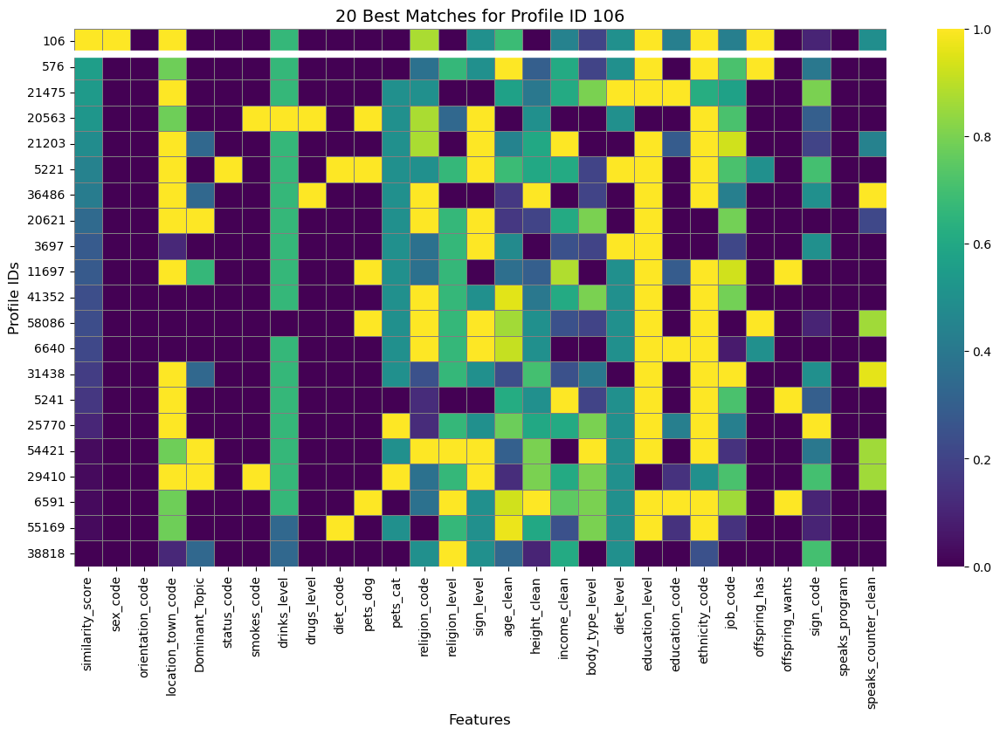

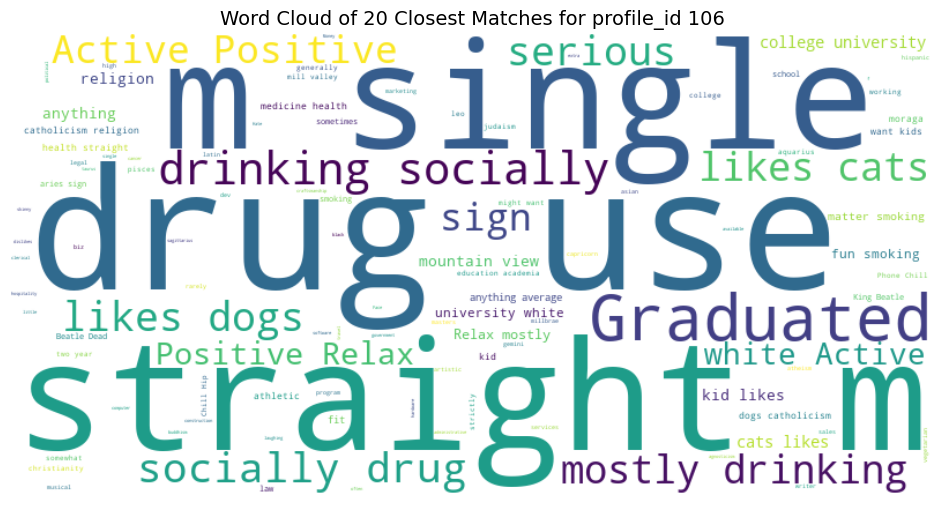

In [7]:
# display all the features of a given profile_id and its 10 closest matches
def display_profile_with_matches(profile_id, cluster_id, profiles_df, similarity_matrices, top_n=20):
    """
    Displays all features of a given profile and its closest matches 
    using the similarity matrix of the specified cluster.
    
    Args:
    - profile_id (int/str): The profile ID to find matches for.
    - cluster_id (str): The HDBSCAN cluster ID.
    - profiles_df (pd.DataFrame): DataFrame containing profile features.
    - similarity_matrices (dict): Dictionary of similarity matrices (one per cluster).
    - top_n (int): Number of closest matches to display (default: 10).
    
    Returns:
    - Displays the DataFrame with profile and closest matches.
    """
    cluster_id = str(cluster_id)  # Ensure cluster_id is string

    if cluster_id not in similarity_matrices:
        print(f"Cluster {cluster_id} not found in similarity matrices.")
        return

    sim_df = similarity_matrices[cluster_id]  # Get similarity matrix for cluster

    # Ensure profile_id type matches index type
    profile_id = type(sim_df.index[0])(profile_id)  # Convert profile_id to match index type

    if profile_id not in sim_df.index:
        print(f"Profile ID {profile_id} not found in cluster {cluster_id}.")
        return

    # Extract similarity scores and sort in descending order
    top_matches = sim_df.loc[profile_id].astype(float).sort_values(ascending=False).dropna().head(top_n)

    # Include the original profile in the list
    match_ids = [profile_id] + list(top_matches.index)

    # Ensure all match_ids exist in profiles_df before lookup
    match_ids = [pid for pid in match_ids if pid in profiles_df.index]

    # Extract full profile details
    matches_df = profiles_df.reindex(match_ids).copy()

    # Add similarity scores as a column
    matches_df["similarity_score"] = [1.0] + list(top_matches.loc[match_ids[1:]].values)  # Profile itself gets 1.0 similarity

    # Sort by similarity score (descending)
    matches_df = matches_df.sort_values(by="similarity_score", ascending=False)

    # Output result
    return matches_df


# Example Usage:
profile_id_to_check = "106"  # String input
cluster_id_to_check = "2"   # String input
matches_106 = display_profile_with_matches(profile_id_to_check, cluster_id_to_check, profiles_cosine, similarity_matrices)
# visualise results
display(matches_106)


# heatmap to visualise close matches above
# Selected features for visualization
features = [
    "similarity_score", "sex_code", "orientation_code", "location_town_code", "Dominant_Topic", "status_code",
    "smokes_code", "drinks_level", "drugs_level", "diet_code", "pets_dog", "pets_cat", "religion_code", "religion_level", "sign_level", 
    "age_clean", "height_clean", "income_clean", "body_type_level", "diet_level", "education_level", "education_code",
    "ethnicity_code", "job_code",  "offspring_has", "offspring_wants", "sign_code", "speaks_program", "speaks_counter_clean" 
]

# Normalize the feature values for better visualization
# min-max scaling with NaN handling
scaler = MinMaxScaler()
df_normalized = pd.DataFrame(scaler.fit_transform(matches_106[features]), columns=features, index=matches_106.index)

# Replace NaNs with 0 (if needed)
df_normalized = df_normalized.fillna(0)

# Set up figure size
plt.figure(figsize=(15, 8))

# Create heatmap
plt.figure(figsize=(15, 8))
sns.heatmap(
    df_normalized, 
    cmap="viridis", 
    cbar=True, 
    xticklabels=features, 
    yticklabels=matches_106.index.astype(str), 
    linewidths=0.5, 
    linecolor="gray"
)

# Add a horizontal line to separate the first row
plt.axhline(y=1, color="white", linewidth=6)  # Position at row index 1 (below first row)

# Labels and title
plt.xlabel("Features", fontsize=12)
plt.ylabel("Profile IDs", fontsize=12)
plt.title("20 Best Matches for Profile ID 106", fontsize=14)

plt.show()

# wordcloud
# define variables to use
wordcloud_features = ['body_type', 'job', 'orientation', 'sex',
       'status', 'age_filtered', 'height_filtered',
       'income_filtered', 'location_town', 'education_type', 'ethnicity_clean',
       'Topic Label post TF-IDF filtering', 'Diet Level Label',
       'Drinks Level Label', 'Drugs Level Label', 'Education Level Label',
       'Offspring Wants Label', 'Offsprings Has Label', 'Pets Cat label',
       'Pets Dog Label', 'Religion Code Label', 'Religion Level Label',
       'Sign Code Label', 'Sign Level label', 'Smokes Code Label', 'Diet Type'
      ]

# Extract words from the specified columns, converting NaNs to empty strings
wordcloud_text = " ".join(
    matches_106[wordcloud_features]
    .astype(str)
    .apply(lambda x: " ".join(x.dropna()), axis=1)  # Drop NaNs before joining
)

# Define stopwords to remove common words
custom_stopwords = set(STOPWORDS)
custom_stopwords.update(["nan"])  # Explicitly ignore "nan"

# Generate word cloud with stopwords removed
wordcloud = WordCloud(
    width=800,
    height=400,
    background_color="white",
    colormap="viridis",
    max_words=200,
    stopwords=custom_stopwords  # Exclude common stopwords and "nan"
).generate(wordcloud_text)

# Plot the word cloud
plt.figure(figsize=(12, 6))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")  # Hide axis
plt.title("Word Cloud of 20 Closest Matches for profile_id 106", fontsize=14)
plt.show()

### profile_id 59749 (cluster 2)

<Figure size 1500x800 with 0 Axes>

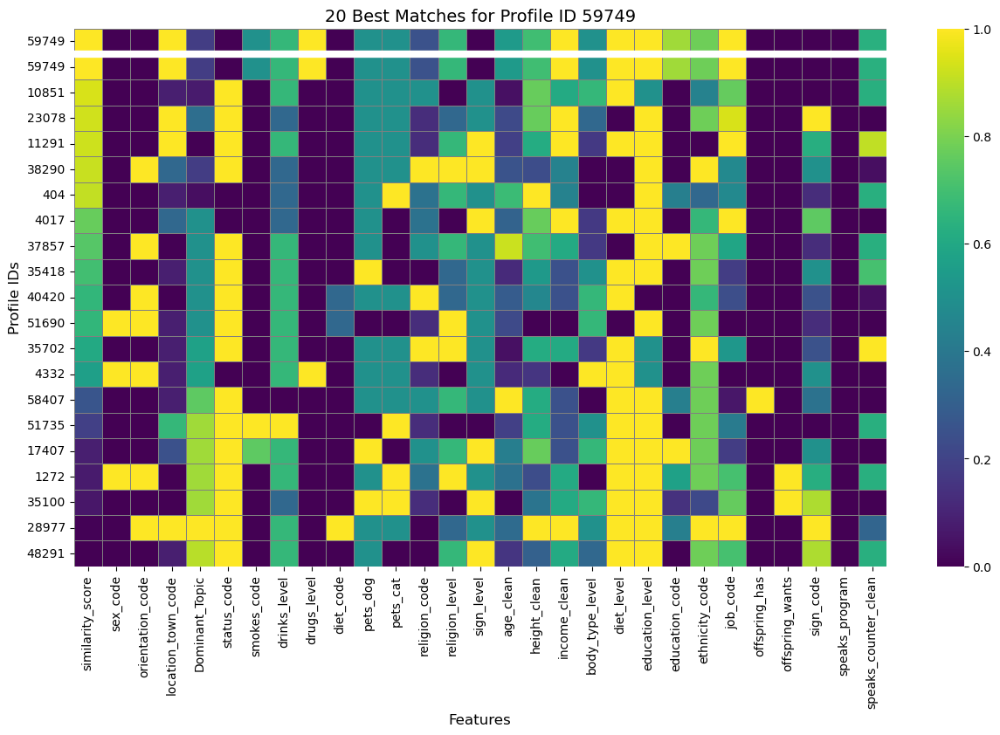

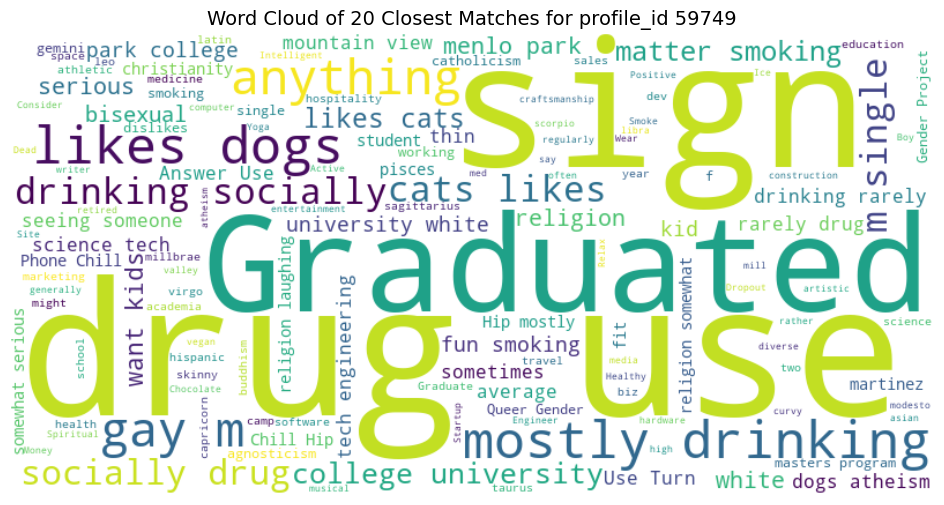

In [12]:
# display all the features of a given profile_id and its 10 closest matches
def display_profile_with_matches(profile_id, cluster_id, profiles_df, similarity_matrices, top_n=20):
    """
    Displays all features of a given profile and its closest matches 
    using the similarity matrix of the specified cluster.
    
    Args:
    - profile_id (int/str): The profile ID to find matches for.
    - cluster_id (str): The HDBSCAN cluster ID.
    - profiles_df (pd.DataFrame): DataFrame containing profile features.
    - similarity_matrices (dict): Dictionary of similarity matrices (one per cluster).
    - top_n (int): Number of closest matches to display (default: 10).
    
    Returns:
    - Displays the DataFrame with profile and closest matches.
    """
    cluster_id = str(cluster_id)  # Ensure cluster_id is string

    if cluster_id not in similarity_matrices:
        print(f"Cluster {cluster_id} not found in similarity matrices.")
        return

    sim_df = similarity_matrices[cluster_id]  # Get similarity matrix for cluster

    # Ensure profile_id type matches index type
    profile_id = type(sim_df.index[0])(profile_id)  # Convert profile_id to match index type

    if profile_id not in sim_df.index:
        print(f"Profile ID {profile_id} not found in cluster {cluster_id}.")
        return

    # Extract similarity scores and sort in descending order
    top_matches = sim_df.loc[profile_id].astype(float).sort_values(ascending=False).dropna().head(top_n)

    # Include the original profile in the list
    match_ids = [profile_id] + list(top_matches.index)

    # Ensure all match_ids exist in profiles_df before lookup
    match_ids = [pid for pid in match_ids if pid in profiles_df.index]

    # Extract full profile details
    matches_df = profiles_df.reindex(match_ids).copy()

    # Add similarity scores as a column
    matches_df["similarity_score"] = [1.0] + list(top_matches.loc[match_ids[1:]].values)  # Profile itself gets 1.0 similarity

    # Sort by similarity score (descending)
    matches_df = matches_df.sort_values(by="similarity_score", ascending=False)

    # Output result
    return matches_df

# Example Usage:
profile_id_to_check = "59749"  # String input
cluster_id_to_check = "2"   # String input
matches_59749 = display_profile_with_matches(profile_id_to_check, cluster_id_to_check, profiles_cosine, similarity_matrices)
# # visualise results
# display(matches_59749)


# heatmap to visualise close matches above
# Selected features for visualization
features = [
    "similarity_score", "sex_code", "orientation_code", "location_town_code", "Dominant_Topic", "status_code",
    "smokes_code", "drinks_level", "drugs_level", "diet_code", "pets_dog", "pets_cat", "religion_code", "religion_level", "sign_level", 
    "age_clean", "height_clean", "income_clean", "body_type_level", "diet_level", "education_level", "education_code",
    "ethnicity_code", "job_code",  "offspring_has", "offspring_wants", "sign_code", "speaks_program", "speaks_counter_clean" 
]

# Normalize the feature values for better visualization
# min-max scaling with NaN handling
scaler = MinMaxScaler()
df_normalized = pd.DataFrame(scaler.fit_transform(matches_59749[features]), columns=features, index=matches_59749.index)

# Replace NaNs with 0 (if needed)
df_normalized = df_normalized.fillna(0)

# Set up figure size
plt.figure(figsize=(15, 8))

# Create heatmap
plt.figure(figsize=(15, 8))
sns.heatmap(
    df_normalized, 
    cmap="viridis", 
    cbar=True, 
    xticklabels=features, 
    yticklabels=matches_59749.index.astype(str), 
    linewidths=0.5, 
    linecolor="gray"
)

# Add a horizontal line to separate the first row
plt.axhline(y=1, color="white", linewidth=6)  # Position at row index 1 (below first row)

# Labels and title
plt.xlabel("Features", fontsize=12)
plt.ylabel("Profile IDs", fontsize=12)
plt.title("20 Best Matches for Profile ID 59749", fontsize=14)

plt.show()

# wordcloud
# define variables to use
wordcloud_features = ['body_type', 'job', 'orientation', 'sex',
       'status', 'age_filtered', 'height_filtered',
       'income_filtered', 'location_town', 'education_type', 'ethnicity_clean',
       'Topic Label post TF-IDF filtering', 'Diet Level Label',
       'Drinks Level Label', 'Drugs Level Label', 'Education Level Label',
       'Offspring Wants Label', 'Offsprings Has Label', 'Pets Cat label',
       'Pets Dog Label', 'Religion Code Label', 'Religion Level Label',
       'Sign Code Label', 'Sign Level label', 'Smokes Code Label', 'Diet Type'
      ]

# Extract words from the specified columns, converting NaNs to empty strings
wordcloud_text = " ".join(
    matches_59749[wordcloud_features]
    .astype(str)
    .apply(lambda x: " ".join(x.dropna()), axis=1)  # Drop NaNs before joining
)

# Define stopwords to remove common words
custom_stopwords = set(STOPWORDS)
custom_stopwords.update(["nan"])  # Explicitly ignore "nan"

# Generate word cloud with stopwords removed
wordcloud = WordCloud(
    width=800,
    height=400,
    background_color="white",
    colormap="viridis",
    max_words=200,
    stopwords=custom_stopwords  # Exclude common stopwords and "nan"
).generate(wordcloud_text)

# Plot the word cloud
plt.figure(figsize=(12, 6))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")  # Hide axis
plt.title("Word Cloud of 20 Closest Matches for profile_id 59749", fontsize=14)
plt.show()

## Network of each hdbscan cluster

### Cluster 2 (572 individuals)

🔹 Cosine similarity matrices and profile data loaded successfully!
Clusters in similarity data: ['3', '1', '0', '4', '2']
🔹 Cluster 3 similarity matrix shape: (10292, 10292)

🔹 Processing Cluster 2...
🔹 Cluster 2 → Nodes: 572, Edges: 1471


C:\Users\Owner\miniconda3\envs\new_env\lib\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 128313 (\N{SMALL BLUE DIAMOND}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


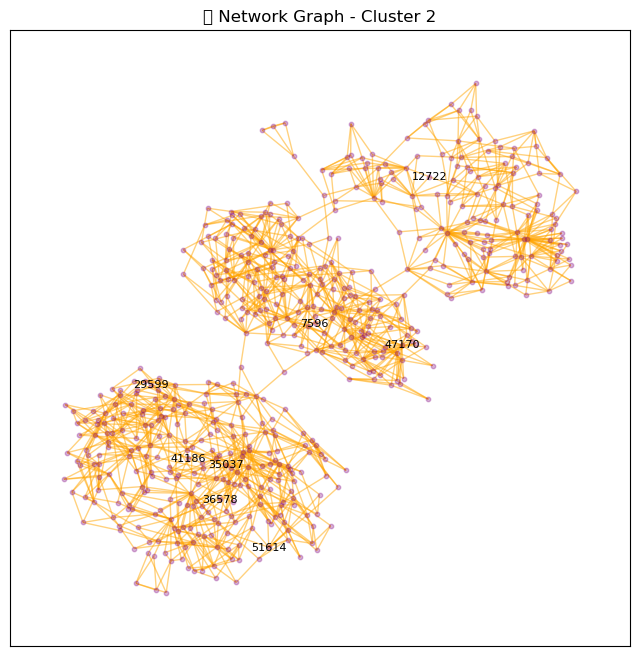

In [6]:
# plotting smallest cluster (2)
# Set similarity threshold & max connections
SIMILARITY_THRESHOLD = 0.95
MAX_CONNECTIONS = 3

# Process only Cluster 2
cluster = 2  # Specify the cluster to process
print(f"\nProcessing Cluster {cluster}...")

# Extract similarity matrix and cluster data
sim_matrix = cluster_matches[str(cluster)]  # Ensure cluster key matches saved format
cluster_data = profiles_filtered[profiles_filtered["hdbscan_clusters"] == cluster]
profile_ids = cluster_data.index.astype(str).values  # Ensure string IDs

# Convert similarity matrix to NumPy array
sim_matrix = np.array(sim_matrix)

# Create a graph
G = nx.Graph()

# Add nodes first
G.add_nodes_from(profile_ids)

# Add edges for strong matches
for i in range(len(profile_ids)):
    top_match_indices = np.argsort(sim_matrix[i])[::-1][1:MAX_CONNECTIONS + 1]
    top_similarities = sim_matrix[i][top_match_indices]

    for j, sim_score in zip(top_match_indices, top_similarities):
        if sim_score > SIMILARITY_THRESHOLD:
            G.add_edge(profile_ids[i], profile_ids[j], weight=sim_score)

# Check network size
print(f"Cluster {cluster} → Nodes: {G.number_of_nodes()}, Edges: {G.number_of_edges()}")

# Skip empty networks
if G.number_of_edges() == 0:
    print(f"⚠ No strong matches found for Cluster {cluster}. No graph to plot.")
else:
    # Plot the network
    plt.figure(figsize=(8, 8))
    pos = nx.kamada_kawai_layout(G)  # Faster layout for large graphs
    nx.draw_networkx_nodes(G, pos, node_size=10, alpha=0.3, node_color="purple")
    nx.draw_networkx_edges(G, pos, alpha=0.5, edge_color="orange")

    # Show labels for a few nodes
    sample_nodes = np.random.choice(list(G.nodes), size=min(8, len(G.nodes)), replace=False)
    labels = {node: node for node in sample_nodes}
    nx.draw_networkx_labels(G, pos, labels, font_size=8, font_color="black")

    plt.title(f"Network Graph - Cluster {cluster}")
    plt.show()


What This Graph Shows  
1️⃣ 📌 Nodes = Individual Profiles  
Each dot (node) represents a profile within Cluster 2.  
Larger clusters indicate profiles that are highly similar to many others.  
Isolated nodes (on the edges) represent profiles with fewer strong matches.  
2️⃣ 📌 Edges = Cosine Similarity Strength  
Lines (edges) between nodes represent a strong similarity between two profiles.  
The more edges a node has, the more matches it has within the cluster.  
Thicker/denser areas = Highly connected groups → Strongly similar individuals.  
3️⃣ 📌 Sub-Groups & Communities  
The network is split into three main groups, meaning that Cluster 2 itself has sub-groups.  
These groups likely represent different personality traits, preferences, or shared interests.  
The connections between groups are weaker, meaning they are less similar.  
4️⃣ 📌 Labeled Nodes (e.g., 12222, 2586, 25599, etc.)  
These highlight key profiles in the network.
They could be central figures in their communities (highly similar to many others).  
Or, they might be outliers with a few unique connections.  

In [19]:
### categorise blobs (subgroup) in network above (cluster 2)
### Detect Communities Using NetworkX
# Apply the Louvain community detection algorithm
partition = community.best_partition(G)  # This assigns each node to a sub-group (blob)
# Convert partition results to a DataFrame
blob_df = pd.DataFrame(list(partition.items()), columns=["profile_id", "blob"])
# Reset index to move `profile_id` into a column
profiles_filtered = profiles_filtered.reset_index()
# Ensure `profile_id` is a string for merging
profiles_filtered["profile_id"] = profiles_filtered["profile_id"].astype(str)
blob_df["profile_id"] = blob_df["profile_id"].astype(str)
# merge dfs
profiles_with_blobs = profiles_filtered.merge(blob_df, on="profile_id", how="left")
# Check how many profiles were assigned to each blob
print(profiles_with_blobs["blob"].value_counts())

### Compute Feature Importance Per Blob
# Define features & labels
features = [
    "age_clean", "height_clean", "income_clean", "body_type_level", "diet_code",
    "diet_level", "drinks_level", "drugs_level", "education_level", "education_code",
    "ethnicity_code", "job_code", "location_town_code", "offspring_has", "offspring_wants",
    "orientation_code", "pets_dog", "pets_cat", "religion_code", "religion_level",
    "sign_code", "sign_level", "smokes_code", "speaks_program", "status_code",
    "speaks_counter_clean", "Dominant_Topic"
]
# Store results
feature_importance_per_blob = {}
# Compute feature importance for each detected blob
for blob_id in profiles_with_blobs["blob"].unique():
    blob_data = profiles_with_blobs[profiles_with_blobs["blob"] == blob_id]
    
    # Skip if the blob is too small
    if len(blob_data) < 10:
        continue

    X_blob = blob_data[features].fillna(0)  # Fill missing values
    y_blob = blob_data["blob"]  # Target variable (which blob it belongs to)

    # Train Decision Tree Classifier
    clf = DecisionTreeClassifier(random_state=42)
    clf.fit(X_blob, y_blob)

    # Store feature importance
    feature_importance_per_blob[blob_id] = dict(zip(features, clf.feature_importances_))

# Convert to DataFrame for visualization
feature_importance_df = pd.DataFrame(feature_importance_per_blob).T
# Display feature importance table
display("Feature Importance Per Cluster 2 Blob", feature_importance_df)


blob
4.0    135
0.0     89
3.0     87
1.0     76
7.0     66
8.0     41
5.0     34
6.0     30
2.0     14
Name: count, dtype: int64


'Feature Importance Per Blob'

,age_clean,height_clean,income_clean,body_type_level,diet_code,diet_level,drinks_level,drugs_level,education_level,education_code,ethnicity_code,job_code,location_town_code,offspring_has,offspring_wants,orientation_code,pets_dog,pets_cat,religion_code,religion_level,sign_code,sign_level,smokes_code,speaks_program,status_code,speaks_counter_clean,Dominant_Topic
0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
5.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
6.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
7.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
8.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [18]:
display(profiles_filtered)

,body_type,diet,drinks,drugs,education,ethnicity,height,income,job,offspring,orientation,pets,religion,sex,sign,smokes,speaks,status,age_filtered,height_filtered,income_filtered,age_clean,height_clean,income_clean,location_town,location_state,location_country,body_type_level,diet_code,diet_level,drinks_level,drugs_level,education_level,education_type,education_code,ethnicity_clean,ethnicity_code,job_code,location_town_code,offspring_has,offspring_wants,orientation_code,pets_dog,pets_cat,religion_code,religion_level,sex_code,sign_code,sign_level,smokes_code,speaks_program,status_code,speaks_counter_clean,essay_clean,Dominant_Topic,Topic_Label,Topic_Prevalence,completeness_score,iso_score,hdbscan_clusters,best_match_profile_id,best_match_score
profile_id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
8,average,mostly anything,socially,never,graduated from college/university,white,65.0,-1,artistic / musical / writer,"doesn’t have kids, but wants them",straight,likes dogs and likes cats,christianity,f,sagittarius,no,"english, spanish (okay)",single,31.0,65.0,NaN,3.433987,65.0,31.072325,san francisco,california,US,0.0,1.0,2.0,2.0,0.0,2.0,college/university,0,white,8,5.0,154,0.0,NaN,0,1.0,1.0,4.0,0.0,1,9.0,0.0,0.0,0,3,11.247214,write meet new people spend time friend see fi...,14,New / Enjoy / Live,7.096998,30.0,1,3,11500.0,0.999850
9,NaN,strictly anything,socially,NaN,graduated from college/university,white,67.0,-1,NaN,doesn’t have kids,straight,likes dogs and likes cats,christianity but not too serious about it,f,gemini but it doesn’t matter,when drinking,english,single,24.0,67.0,NaN,3.178054,67.0,NaN,belvedere tiburon,california,US,NaN,1.0,3.0,2.0,NaN,2.0,college/university,0,white,8,NaN,14,0.0,NaN,0,1.0,1.0,4.0,2.0,1,5.0,1.0,3.0,0,3,11.007933,goodness moment job nice find settle make sure...,26,Girl / Think / New,4.317561,28.0,1,1,12141.0,0.996507
10,athletic,mostly anything,not at all,never,working on two-year college,white,65.0,-1,student,NaN,straight,likes dogs and likes cats,atheism and laughing about it,m,cancer but it doesn’t matter,no,english (fluently),single,37.0,65.0,NaN,3.610918,65.0,27.144176,san mateo,california,US,-4.0,1.0,2.0,0.0,0.0,1.0,two-year college,7,white,8,1.0,160,NaN,NaN,0,1.0,1.0,1.0,1.0,0,3.0,1.0,0.0,0,3,11.007933,name jake creative guy look easy practical not...,0,Day / Try / Big,0.550959,30.0,1,3,5206.0,0.999802
12,average,mostly anything,socially,never,graduated from college/university,white,72.0,40000,banking / financial / real estate,NaN,straight,likes cats,christianity and very serious about it,m,leo but it doesn’t matter,no,"english (fluently), sign language (poorly)",seeing someone,28.0,72.0,40000.0,3.332205,72.0,34.199519,daly city,california,US,0.0,1.0,2.0,2.0,0.0,2.0,college/university,0,white,8,19.0,43,NaN,NaN,0,NaN,1.0,4.0,4.0,0,6.0,1.0,0.0,0,2,11.021576,bear wisconsin grow iowa move california year ...,15,Think / Know / Want,8.128912,28.0,1,0,36225.0,0.995461
14,skinny,mostly anything,socially,never,graduated from high school,white,66.0,30000,sales / marketing / biz dev,NaN,straight,has dogs and likes cats,christianity but not too serious about it,f,NaN,no,english,single,30.0,66.0,30000.0,3.401197,66.0,31.072325,san francisco,california,US,-2.0,1.0,2.0,2.0,0.0,2.0,high school,1,white,8,14.0,154,NaN,NaN,0,2.0,1.0,4.0,2.0,1,NaN,NaN,0.0,0,3,11.007933,NaN,15,Think / Know / Want,8.128912,28.0,1,3,45549.0,0.999878
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
59930,average,strictly vegetarian,socially,sometimes,graduated from masters program,white,68.0,-1,artistic / musical / writer,NaN,straight,has dogs and likes cats,atheism but not too serious about it,m,pisces but it doesn’t matter,no,"english (fluently), polish (fluently), french ...",single,27.0,68.0,NaN,3.295837,68.0,31.0

### Cluster 0 (935 individuals)

🔹 Cosine similarity matrices and profile data loaded successfully!
Clusters in similarity data: ['3', '1', '0', '4', '2']
🔹 Cluster 3 similarity matrix shape: (10292, 10292)

🔹 Processing Cluster 0...
🔹 Cluster 0 → Nodes: 935, Edges: 2375


C:\Users\Owner\miniconda3\envs\new_env\lib\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 128313 (\N{SMALL BLUE DIAMOND}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


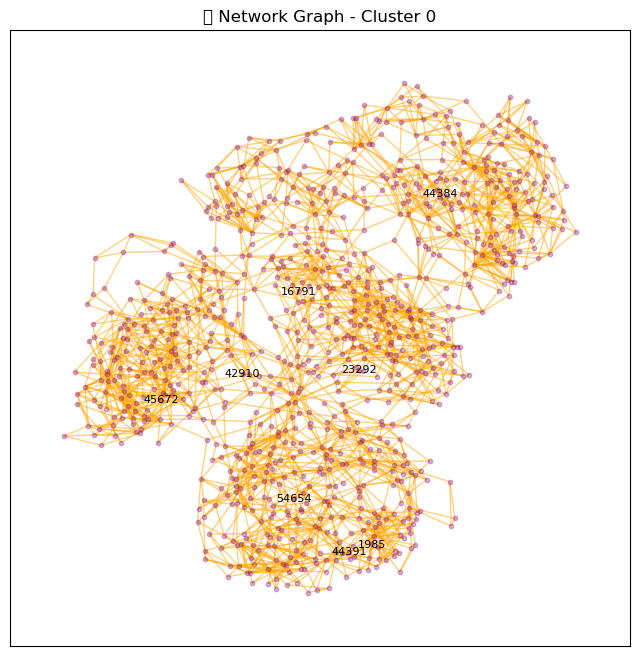

In [20]:
# plotting 2nd smallest cluster (0)
# Set similarity threshold & max connections
SIMILARITY_THRESHOLD = 0.95
MAX_CONNECTIONS = 3

# Process only Cluster 0
cluster = 0  # Specify the cluster to process
print(f"\nProcessing Cluster {cluster}...")

# Extract similarity matrix and cluster data
sim_matrix = cluster_matches[str(cluster)]  # Ensure cluster key matches saved format
cluster_data = profiles_filtered[profiles_filtered["hdbscan_clusters"] == cluster]
profile_ids = cluster_data.index.astype(str).values  # Ensure string IDs

# Convert similarity matrix to NumPy array
sim_matrix = np.array(sim_matrix)

# Create a graph
G = nx.Graph()

# Add nodes first
G.add_nodes_from(profile_ids)

# Add edges for strong matches
for i in range(len(profile_ids)):
    top_match_indices = np.argsort(sim_matrix[i])[::-1][1:MAX_CONNECTIONS + 1]
    top_similarities = sim_matrix[i][top_match_indices]

    for j, sim_score in zip(top_match_indices, top_similarities):
        if sim_score > SIMILARITY_THRESHOLD:
            G.add_edge(profile_ids[i], profile_ids[j], weight=sim_score)

# Check network size
print(f"Cluster {cluster} → Nodes: {G.number_of_nodes()}, Edges: {G.number_of_edges()}")

# Skip empty networks
if G.number_of_edges() == 0:
    print(f"⚠ No strong matches found for Cluster {cluster}. No graph to plot.")
else:
    # Plot the network
    plt.figure(figsize=(8, 8))
    pos = nx.kamada_kawai_layout(G)  # Faster layout for large graphs
    nx.draw_networkx_nodes(G, pos, node_size=10, alpha=0.3, node_color="purple")
    nx.draw_networkx_edges(G, pos, alpha=0.5, edge_color="orange")

    # Show labels for a few nodes
    sample_nodes = np.random.choice(list(G.nodes), size=min(8, len(G.nodes)), replace=False)
    labels = {node: node for node in sample_nodes}
    nx.draw_networkx_labels(G, pos, labels, font_size=8, font_color="black")

    plt.title(f"Network Graph - Cluster {cluster}")
    plt.show()


### Cluster 1 (1834 individuals)

🔹 Cosine similarity matrices and profile data loaded successfully!
Clusters in similarity data: ['3', '1', '0', '4', '2']
🔹 Cluster 3 similarity matrix shape: (10292, 10292)

🔹 Processing Cluster 1...
🔹 Cluster 1 → Nodes: 1834, Edges: 4629


C:\Users\Owner\miniconda3\envs\new_env\lib\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 128313 (\N{SMALL BLUE DIAMOND}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


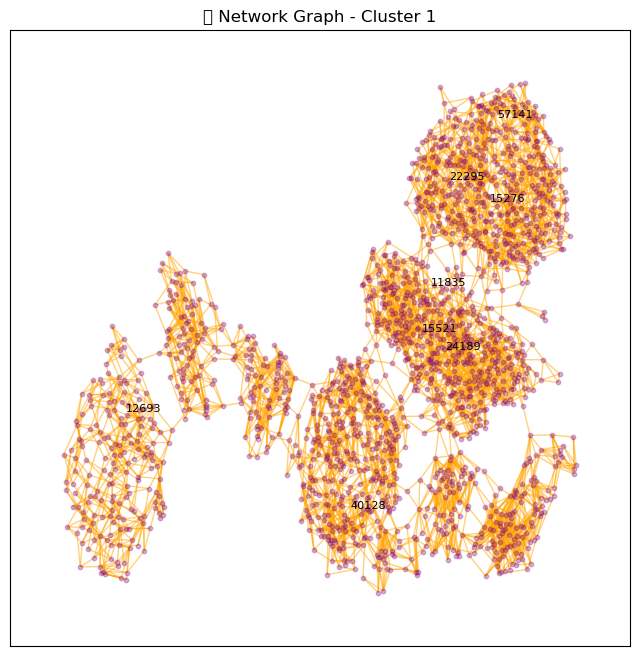

In [22]:
# plotting 3rd smallest cluster (1)
# Set similarity threshold & max connections
SIMILARITY_THRESHOLD = 0.95
MAX_CONNECTIONS = 3

# Process only Cluster 1
cluster = 1  # Specify the cluster to process
print(f"\nProcessing Cluster {cluster}...")

# Extract similarity matrix and cluster data
sim_matrix = cluster_matches[str(cluster)]  # Ensure cluster key matches saved format
cluster_data = profiles_filtered[profiles_filtered["hdbscan_clusters"] == cluster]
profile_ids = cluster_data.index.astype(str).values  # Ensure string IDs

# Convert similarity matrix to NumPy array
sim_matrix = np.array(sim_matrix)

# Create a graph
G = nx.Graph()

# Add nodes first
G.add_nodes_from(profile_ids)

# Add edges for strong matches
for i in range(len(profile_ids)):
    top_match_indices = np.argsort(sim_matrix[i])[::-1][1:MAX_CONNECTIONS + 1]
    top_similarities = sim_matrix[i][top_match_indices]

    for j, sim_score in zip(top_match_indices, top_similarities):
        if sim_score > SIMILARITY_THRESHOLD:
            G.add_edge(profile_ids[i], profile_ids[j], weight=sim_score)

# Check network size
print(f"Cluster {cluster} → Nodes: {G.number_of_nodes()}, Edges: {G.number_of_edges()}")

# Skip empty networks
if G.number_of_edges() == 0:
    print(f"⚠ No strong matches found for Cluster {cluster}. No graph to plot.")
else:
    # Plot the network
    plt.figure(figsize=(8, 8))
    pos = nx.kamada_kawai_layout(G)  # Faster layout for large graphs
    nx.draw_networkx_nodes(G, pos, node_size=10, alpha=0.3, node_color="purple")
    nx.draw_networkx_edges(G, pos, alpha=0.5, edge_color="orange")

    # Show labels for a few nodes
    sample_nodes = np.random.choice(list(G.nodes), size=min(8, len(G.nodes)), replace=False)
    labels = {node: node for node in sample_nodes}
    nx.draw_networkx_labels(G, pos, labels, font_size=8, font_color="black")

    plt.title(f"Network Graph - Cluster {cluster}")
    plt.show()



### Cluster 4 (2658 individuals)

🔹 Cosine similarity matrices and profile data loaded successfully!
Clusters in similarity data: ['3', '1', '0', '4', '2']
🔹 Cluster 3 similarity matrix shape: (10292, 10292)

🔹 Processing Cluster 4...
🔹 Cluster 4 → Nodes: 2658, Edges: 6924


C:\Users\Owner\miniconda3\envs\new_env\lib\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 128313 (\N{SMALL BLUE DIAMOND}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


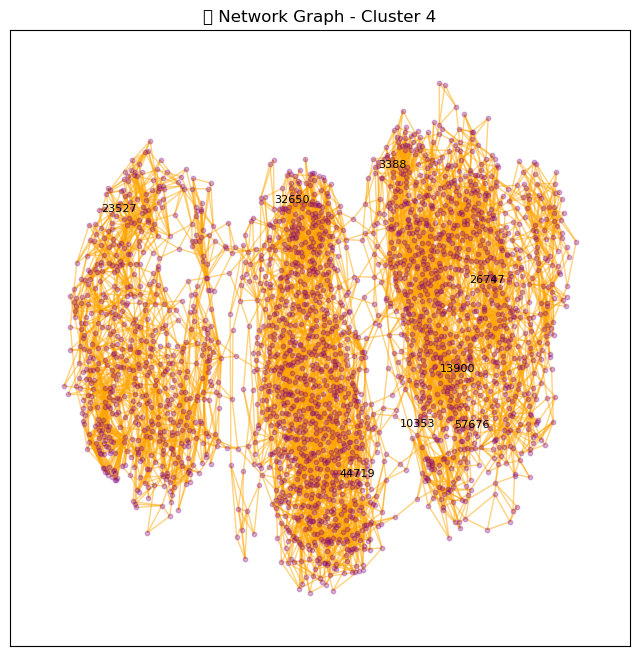

In [23]:
# plotting 4th smallest cluster (4)
# Set similarity threshold & max connections
SIMILARITY_THRESHOLD = 0.95
MAX_CONNECTIONS = 3

# Process only Cluster 4
cluster = 4  # Specify the cluster to process
print(f"\nProcessing Cluster {cluster}...")

# Extract similarity matrix and cluster data
sim_matrix = cluster_matches[str(cluster)]  # Ensure cluster key matches saved format
cluster_data = profiles_filtered[profiles_filtered["hdbscan_clusters"] == cluster]
profile_ids = cluster_data.index.astype(str).values  # Ensure string IDs

# Convert similarity matrix to NumPy array
sim_matrix = np.array(sim_matrix)

# Create a graph
G = nx.Graph()

# Add nodes first
G.add_nodes_from(profile_ids)

# Add edges for strong matches
for i in range(len(profile_ids)):
    top_match_indices = np.argsort(sim_matrix[i])[::-1][1:MAX_CONNECTIONS + 1]
    top_similarities = sim_matrix[i][top_match_indices]

    for j, sim_score in zip(top_match_indices, top_similarities):
        if sim_score > SIMILARITY_THRESHOLD:
            G.add_edge(profile_ids[i], profile_ids[j], weight=sim_score)

# Check network size
print(f"Cluster {cluster} → Nodes: {G.number_of_nodes()}, Edges: {G.number_of_edges()}")

# Skip empty networks
if G.number_of_edges() == 0:
    print(f"⚠ No strong matches found for Cluster {cluster}. No graph to plot.")
else:
    # Plot the network
    plt.figure(figsize=(8, 8))
    pos = nx.kamada_kawai_layout(G)  # Faster layout for large graphs
    nx.draw_networkx_nodes(G, pos, node_size=10, alpha=0.3, node_color="purple")
    nx.draw_networkx_edges(G, pos, alpha=0.5, edge_color="orange")

    # Show labels for a few nodes
    sample_nodes = np.random.choice(list(G.nodes), size=min(8, len(G.nodes)), replace=False)
    labels = {node: node for node in sample_nodes}
    nx.draw_networkx_labels(G, pos, labels, font_size=8, font_color="black")

    plt.title(f"Network Graph - Cluster {cluster}")
    plt.show()



### Cluster 3 (10292 individuals) - too many. do not plot the network (takes forever!

## 

# Creating an interactive interface to visualise matches using Gradio
Gradio is a lightweight library that allows you to create interactive web-based UIs in Jupyter with minimal code. It's perfect for quickly testing and deploying your match-finding interface.  
__Key Features:__  
- Works inside Jupyter Notebook
- No frontend coding required (simple Python functions)
- Can display tables, text, and images
- Can be deployed locally or shared with others

## Load data

In [10]:
# takes 5-10 min as some similarity matrices are very large
# Load profile data and ensure profile_id is a string index
profiles_with_best_match = pd.read_csv("profiles_features_with_best_cosine_matches_for_Gradio.csv", encoding='utf-8', dtype={"profile_id": str}, index_col="profile_id")
# Define columns to drop as they are irrelevant for the ML model
columns_to_drop = ['Unnamed: 34']
# Drop the specified columns
profiles_with_best_match  = profiles_with_best_match .drop(columns=columns_to_drop)
# Check first few rows of df
print("profiles_with_best_match df:")
display(profiles_with_best_match.head())
display(profiles_with_best_match.columns)

# Define the new column order
column_order = [
    # Demographics
    "orientation", "sex", "age_filtered", "height_filtered", 
    "ethnicity_clean",  "location_town", 
    "location_state", "location_country",
    
    # Education & Job
    "education_type", "Education Level Label", "job", "income_filtered",
    
    # Lifestyle & Habits
    "body_type", "Diet Type", "Diet Level Label", "drinks", 
    "Drinks Level Label", "smokes", "Smokes Code Label",
    "drugs", "Drugs Level Label",     
    
    # Family & Relationships
    "status", "Offsprings Has Label", "Offspring Wants Label", 
    
    # Personal Preferences & Interests
    "Pets Cat label", "Pets Dog Label", "Religion Code Label", 
    "Religion Level Label", "Sign Code Label", "Sign Level label", 

    # Best match and group
    "Topic Label post TF-IDF filtering", 'hdbscan_clusters', "best_match_profile_id", "best_match_score"    
]

# Reorder the DataFrame
profiles_with_best_match = profiles_with_best_match[column_order]

# Display the updated DataFrame
display(profiles_with_best_match.head())
display(profiles_with_best_match.columns)

# Load similarity matrices (ensure profile_id is referenced correctly)
similarity_data = np.load("similarity_matrices.npz", allow_pickle=True)
cluster_matches = {key: similarity_data[key] for key in similarity_data.files}

# Dictionary to store similarity matrices
similarity_matrices = {}

# Only process the five valid similarity matrices
valid_files = ["similarity_matrix_cluster_0.csv", 
               "similarity_matrix_cluster_1.csv", 
               "similarity_matrix_cluster_2.csv", 
               "similarity_matrix_cluster_3.csv", 
               "similarity_matrix_cluster_4.csv"]

for file in valid_files:
    if os.path.exists(file):  # Ensure file exists
        df = pd.read_csv(file, dtype=str)  # Load CSV with profile_id as string
        df.set_index(df.columns[0], inplace=True)  # Set first column as index

        # Ensure index and column names are strings
        df.index = df.index.astype(str)
        df.columns = df.columns.astype(str)

        # Ensure the DataFrame is square (rows == columns)
        if df.shape[0] != df.shape[1]:
            print(f"Skipping {file} (Invalid shape: {df.shape})")
            continue  # Skip incorrect matrices

        df.columns = df.index  # Ensure column names match profile IDs

        # Extract cluster number from filename
        cluster_id = file.split("_")[-1].split(".")[0]
        similarity_matrices[cluster_id] = df  # Store valid matrix

print(f"Loaded {len(similarity_matrices)} similarity matrices successfully!")




profiles_with_best_match df:


,body_type,drinks,drugs,job,orientation,pets,sex,smokes,status,age_filtered,height_filtered,income_filtered,location_town,location_state,location_country,education_type,ethnicity_clean,Topic Label post TF-IDF filtering,Diet Level Label,Drinks Level Label,Drugs Level Label,Education Level Label,Offspring Wants Label,Offsprings Has Label,Pets Cat label,Pets Dog Label,Religion Code Label,Religion Level Label,Sign Code Label,Sign Level label,Smokes Code Label,best_match_profile_id,best_match_score,Diet Type,hdbscan_clusters
profile_id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
8,average,socially,never,artistic / musical / writer,straight,likes dogs and likes cats,f,no,single,31,65.0,NaN,san francisco,california,US,college/university,white,Active / Summer / Hiking,mostly,drinking: socially,drug use: no,Graduated,NaN,has 0 kid,likes cats,likes dogs,christianity,NaN,sagittarius,NaN,smoking: no,11500.0,0.999850,anything,3.0
9,NaN,socially,NaN,NaN,straight,likes dogs and likes cats,f,when drinking,single,24,67.0,NaN,belvedere tiburon,california,US,college/university,white,Wear / Ice / Chocolate,strictly,drinking: socially,NaN,Graduated,NaN,has 0 kid,likes cats,likes dogs,christianity,religion: not too serious,gemini,sign doesn't matter,smoking: when drinking,12141.0,0.996507,anything,1.0
10,athletic,not at all,never,student,straight,likes dogs and likes cats,m,no,single,37,65.0,NaN,san mateo,california,US,two-year college,white,Brother / Young / Red,mostly,drinking: no,drug use: no,working on,NaN,NaN,likes cats,likes dogs,atheism,religion: laughing,cancer,sign doesn't matter,smoking: no,5206.0,0.999802,anything,3.0
12,average,socially,never,banking / financial / real estate,straight,likes cats,m,no,seeing someone,28,72.0,40000.0,daly city,california,US,college/university,white,Answer / Use / Turn,mostly,drinking: socially,drug use: no,Graduated,NaN,NaN,likes cats,NaN,christianity,religion: very serious,leo,sign doesn't matter,smoking: no,36225.0,0.995461,anything,0.0
14,skinny,socially,never,sales / marketing / biz dev,straight,has dogs and likes cats,f,no,single,30,66.0,30000.0,san francisco,california,US,high school,white,Answer / Use / Turn,mostly,drinking: socially,drug use: no,Graduated,NaN,NaN,likes cats,has dogs,christianity,religion: not too serious,NaN,NaN,smoking: no,45549.0,0.999878,anything,3.0


Index(['body_type', 'drinks', 'drugs', 'job', 'orientation', 'pets', 'sex',
       'smokes', 'status', 'age_filtered', 'height_filtered',
       'income_filtered', 'location_town', 'location_state',
       'location_country', 'education_type', 'ethnicity_clean',
       'Topic Label post TF-IDF filtering', 'Diet Level Label',
       'Drinks Level Label', 'Drugs Level Label', 'Education Level Label',
       'Offspring Wants Label', 'Offsprings Has Label', 'Pets Cat label',
       'Pets Dog Label', 'Religion Code Label', 'Religion Level Label',
       'Sign Code Label', 'Sign Level label', 'Smokes Code Label',
       'best_match_profile_id', 'best_match_score', 'Diet Type',
       'hdbscan_clusters'],
      dtype='object')

,orientation,sex,age_filtered,height_filtered,ethnicity_clean,location_town,location_state,location_country,education_type,Education Level Label,job,income_filtered,body_type,Diet Type,Diet Level Label,drinks,Drinks Level Label,smokes,Smokes Code Label,drugs,Drugs Level Label,status,Offsprings Has Label,Offspring Wants Label,Pets Cat label,Pets Dog Label,Religion Code Label,Religion Level Label,Sign Code Label,Sign Level label,Topic Label post TF-IDF filtering,hdbscan_clusters,best_match_profile_id,best_match_score
profile_id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
8,straight,f,31,65.0,white,san francisco,california,US,college/university,Graduated,artistic / musical / writer,NaN,average,anything,mostly,socially,drinking: socially,no,smoking: no,never,drug use: no,single,has 0 kid,NaN,likes cats,likes dogs,christianity,NaN,sagittarius,NaN,Active / Summer / Hiking,3.0,11500.0,0.999850
9,straight,f,24,67.0,white,belvedere tiburon,california,US,college/university,Graduated,NaN,NaN,NaN,anything,strictly,socially,drinking: socially,when drinking,smoking: when drinking,NaN,NaN,single,has 0 kid,NaN,likes cats,likes dogs,christianity,religion: not too serious,gemini,sign doesn't matter,Wear / Ice / Chocolate,1.0,12141.0,0.996507
10,straight,m,37,65.0,white,san mateo,california,US,two-year college,working on,student,NaN,athletic,anything,mostly,not at all,drinking: no,no,smoking: no,never,drug use: no,single,NaN,NaN,likes cats,likes dogs,atheism,religion: laughing,cancer,sign doesn't matter,Brother / Young / Red,3.0,5206.0,0.999802
12,straight,m,28,72.0,white,daly city,california,US,college/university,Graduated,banking / financial / real estate,40000.0,average,anything,mostly,socially,drinking: socially,no,smoking: no,never,drug use: no,seeing someone,NaN,NaN,likes cats,NaN,christianity,religion: very serious,leo,sign doesn't matter,Answer / Use / Turn,0.0,36225.0,0.995461
14,straight,f,30,66.0,white,san francisco,california,US,high school,Graduated,sales / marketing / biz dev,30000.0,skinny,anything,mostly,socially,drinking: socially,no,smoking: no,never,drug use: no,single,NaN,NaN,likes cats,has dogs,christianity,religion: not too serious,NaN,NaN,Answer / Use / Turn,3.0,45549.0,0.999878


Index(['orientation', 'sex', 'age_filtered', 'height_filtered',
       'ethnicity_clean', 'location_town', 'location_state',
       'location_country', 'education_type', 'Education Level Label', 'job',
       'income_filtered', 'body_type', 'Diet Type', 'Diet Level Label',
       'drinks', 'Drinks Level Label', 'smokes', 'Smokes Code Label', 'drugs',
       'Drugs Level Label', 'status', 'Offsprings Has Label',
       'Offspring Wants Label', 'Pets Cat label', 'Pets Dog Label',
       'Religion Code Label', 'Religion Level Label', 'Sign Code Label',
       'Sign Level label', 'Topic Label post TF-IDF filtering',
       'hdbscan_clusters', 'best_match_profile_id', 'best_match_score'],
      dtype='object')

✅ Loaded 5 similarity matrices successfully!


## Launch interactive interface

In [13]:
import warnings
warnings.filterwarnings("ignore", category=DeprecationWarning)
pd.set_option("display.max_rows", 100)  # Show up to 100 rows
pd.set_option("display.max_colwidth", None)  # Prevent column truncation

# Convert 'hdbscan_clusters' to strings, handling NaN values
profiles_with_best_match["hdbscan_clusters"] = (
    profiles_with_best_match["hdbscan_clusters"]
    .fillna(-1)  # Replace NaN with -1 (outliers)
    .astype(int)  # Convert to integer
    .astype(str)  # Convert to string for dictionary lookup
)

# Function to apply styling
def style_matches(df, profile_id):
    """Applies conditional formatting to highlight similar values while keeping the reference profile white."""

    # Define base styles
    styles = pd.DataFrame("", index=df.index, columns=df.columns)

    # Keep the looked-up profile row completely **WHITE**
    styles.loc[df.index[0], :] = "background-color: black; font-weight: bold; color: orange;"

    # Apply column-wise conditional formatting for similar values in the **remaining rows**
    for col in df.columns:
        if df[col].dtype in [int, float, object]:  # Apply only to valid columns
            unique_values = df[col].dropna().unique()  # Get unique values
            color_map = {val: f"background-color: rgba(255, 165, 0, {0.2 + (0.8 * i / len(unique_values))})"
                         for i, val in enumerate(unique_values)}
            styles.loc[df.index[1:], col] = df[col].map(color_map).fillna("")  # Use `.loc[]` instead of `.iloc[]`

    return styles

# Function to find and display profile matches
def display_profile_with_matches(profile_id, top_n=20):
    """Finds and displays the closest matches for a given profile ID based on HDBSCAN cluster."""

    # Ensure profile exists in dataset
    if profile_id not in profiles_with_best_match.index:
        return pd.DataFrame({"Error": [f"Profile ID {profile_id} not found in dataset."]})

    # Get the HDBSCAN cluster for this profile
    cluster_id = profiles_with_best_match.loc[profile_id, "hdbscan_clusters"]

    # Ensure the cluster exists in similarity matrices
    if cluster_id not in similarity_matrices:
        return pd.DataFrame({"Error": [f"No similarity matrix found for Cluster {cluster_id}."]})

    # Select the correct similarity matrix
    sim_df = similarity_matrices[cluster_id]

    # Ensure profile exists in the similarity matrix
    if profile_id not in sim_df.index:
        return pd.DataFrame({"Error": [f"Profile ID {profile_id} not found in Cluster {cluster_id}."]})

    print(f"Profile {profile_id} found in Cluster {cluster_id}.")

    # Extract similarity scores for profile_id
    top_matches = sim_df.loc[profile_id].astype(float).sort_values(ascending=False).dropna().head(top_n)

    # Include the original profile in match list
    match_ids = [profile_id] + [pid for pid in top_matches.index if pid != profile_id]
    match_ids = [pid for pid in match_ids if pid in profiles_with_best_match.index]

    # Retrieve profile details
    matches_df = profiles_with_best_match.loc[match_ids].copy()
    matches_df["Similarity Score"] = [1.0] + list(top_matches.loc[match_ids[1:]].values)

    # Sort by similarity score
    matches_df = matches_df.sort_values(by="Similarity Score", ascending=False)

    # Apply styling for visualization
    styled_df = matches_df.reset_index().style.apply(lambda x: style_matches(matches_df.reset_index(), profile_id), axis=None)

    return styled_df  # Return styled DataFrame
    

# Create Gradio Interface
with gr.Blocks() as demo:
    gr.Markdown("### Find Your Best Matches")
    profile_id_input = gr.Textbox(label="Enter Profile ID", placeholder="e.g., 12345")
    num_matches = gr.Slider(minimum=1, maximum=20, value=10, step=1, label="Number of Matches")
    search_button = gr.Button("Find Matches")
    output_table = gr.Dataframe(label="Top Matches", height=1000, min_width=1000, row_count=20)
    
    # Pass correct parameters to Gradio function
    search_button.click(
        fn=lambda pid, n: display_profile_with_matches(pid, n), 
        inputs=[profile_id_input, num_matches], 
        outputs=output_table
    )

# Run the interface
demo.launch() # starts in Jupyter
#demo.launch(share=True) # starts in browser


Running on local URL:  http://127.0.0.1:7860

To create a public link, set `share=True` in `launch()`.


✅ Profile 59749 found in Cluster 2.


## Export similarity matrices as along format for Tableau import

In [10]:
# Load cosine similarity matrix (assuming it's a DataFrame)
similarity_matrix_cluster_2 = pd.read_csv("similarity_matrix_cluster_2.csv", index_col=0)

# Convert to long format
top_n = 20  # Number of closest matches
long_format = []

for profile_id in similarity_matrix_cluster_2.index:
    top_matches = similarity_matrix_cluster_2.loc[profile_id].nlargest(top_n)
    for match_id, sim_score in top_matches.items():
        long_format.append([profile_id, match_id, sim_score])

# Convert to DataFrame and save for Tableau
matches_df = pd.DataFrame(long_format, columns=["profile_id", "match_profile_id", "cosine_similarity"])
matches_df.to_csv("similarity_matrix_cluster_2_top_20_matches.csv", index=False)



✅ Profile 55 found in Cluster 2.
✅ Profile 55 found in Cluster 2.
